In [4]:
#@title
from google.colab import drive
drive.mount('/content/drive')
%cd "/content/drive/MyDrive/YTP 5th"
!pip install -q transformers
!pip install -q keras-bert==0.81.1
import json
import transformers
import numpy as np
import keras
import os
import re
import tensorflow as tf
from tqdm import tqdm
from keras.utils import plot_model
import matplotlib.pyplot as plt

DATA_PATH = '/content/drive/MyDrive/YTP 5th/data/clean.json'
record=dict()

Mounted at /content/drive
/content/drive/MyDrive/YTP 5th
     |████████████████████████████████| 2.0MB 8.7MB/s 
     |████████████████████████████████| 890kB 1.3MB/s 
     |████████████████████████████████| 3.2MB 57.2MB/s 


# `DataGen`

In [5]:
BATCH_SIZE=32
rank = '2330 3037 2303 6488 8046 2603 3481 2458 2327 2454 2609 3006 2409 2317 2344 3443 2492 3260 2337 6533 3034 4976 3008 5483 4743 2408 2308 6116 3189 2354 2357 6531 3711 2014 4142 2377 3105 3228 5269 2375 8070 3661 4968 3545 3078 3406 5471 8299 1301 6271 2331 1305 2338 2881 3540 2882 3019 6202 4967 3042 4128 4938 2610 2618 0050 2328 2379 3413 2376 2368 3374 2371 2002 2891 8086 3293 2356 6138 2615 4966 2027 6150 2353 3707 6121 1590 2886 6415 6203 3576 2049 1326 4958 4162 8358 5223 6237 8936 2412 2383 6525 6269 2382 2449 2201 3680 3178 3014 8069 5347 3714 8081 2481 1101 1513 6213 2472 6443 6477 6182 5425 2345 2009 1314 2301 5371 3691 1303 4915 5274 2312 1909 3141 3529 8383 2884 6188 6669 6541 3552 2467 6679 3015 2038 6505 8454 2108 5871 3533 2342 3665 3264 5243 3317 6510 1216 1476 2401 6224 3231 6104 1309 8016 8464 2888 6278 2456 0056 1477 5386 2474 3419 4576 2912 2436 6223 2883 6239 1312 6274 3483 5299 6414 8255 9958 6285 5469 8171 2352 2885 2476 1785 2441 6147 2406'.split(' ')

In [6]:
#@title `DataGen`
class DataGen(keras.utils.Sequence):
    def __init__(self, stock_id, batch_size=32, shuffle=True, context='title', concat=False, max_length=40, to01=True, encoder=None, idx_type=0):
        if type(stock_id) in [np.ndarray,list]:
            self.stock_id = list(map(str, stock_id))
        else:
            self.stock_id = [stock_id]
        self.shuffle = shuffle
        self.batch_size = batch_size
        assert context in ['title', 'content']
        self.context = context
        self.concat = concat
        self.max_length = max_length
        self.to01 = bool(to01)
        self.encoder = encoder
        self.tokenizer = transformers.BertTokenizer.from_pretrained("bert-base-chinese",)
        with open(DATA_PATH, 'r', encoding='utf-8') as f:
            tmp = json.load(f)
        self.data = dict()
        for i in tmp:
            if i['stock_id'] in self.stock_id:
                self.data[i['stock_id']] = i
        if len(self.data) != len(self.stock_id):
            raise ValueError(f'stock id ({set(self.stock_id) - set(self.data.keys())}) out of data collection')
        self.x=[]
        self.y=[]
        for [id,d] in self.data.items():
            for i in d['news']:
                if i['index'][idx_type] is None:
                    continue
                if concat:
                    self.x.append(' [SEP] '.join(map(lambda x: x[self.context], i['news'])))
                    self.y.append(i['index'][idx_type])
                else:
                    for j in i['news']:
                        self.x.append(j[self.context])
                        self.y.append(i['index'][idx_type])
        self.x = np.array(self.x)
        self.y = np.array(self.y, dtype="float32")
        self.y = (100 + self.y) / 200
        if self.to01:
            self.y = np.where(self.y > 0.5, 1, 0)
        self.n = len(self.x)
        self.indices = np.arange(self.n)
        self.on_epoch_end()

    def __len__(self):
        return self.n // self.batch_size

    def get_data(self, indices):
        encoded = self.tokenizer(
            self.x[indices].tolist(),
            add_special_tokens=True,
            max_length=self.max_length,
            return_attention_mask=True,
            return_token_type_ids=True,
            padding='max_length',
            truncation=True,
            return_tensors="tf",
        )

        input_ids = np.array(encoded["input_ids"], dtype="int32")
        attention_masks = np.array(encoded["attention_mask"], dtype="int32")
        token_type_ids = np.array(encoded["token_type_ids"], dtype="int32")
        if self.encoder is None:
            return ([input_ids, attention_masks], self.y[indices])
        else:
            return (self.encoder.predict([input_ids, attention_masks]), self.y[indices])

    def __getitem__(self, idx):
        indices = self.indices[idx*self.batch_size : (idx+1)*self.batch_size]
        return self.get_data(indices)

    def all(self):
        return self.get_data(self.indices)

    def on_epoch_end(self):
        if self.shuffle:
            np.random.shuffle(self.indices)

In [7]:
#@title DataGenRNN
separator = ['。','！','!','？','?',';','；', '...看原文','more...','...more','■']
brackets = ['「」']# + ['()','（）','[]','【】','〈〉','『』']
def non_empty(a):
    return list(filter(lambda x: len(x)!=0, a))
def split_all(string, sep=separator, bra=brackets):
    bra = ''.join(map(lambda x: f'(?![^{re.escape(x[0])}]*{re.escape(x[1])})', bra))
    sep = '('+'|'.join(map(lambda x: re.escape(x), sep))+')'
    res = non_empty(map(lambda x: x.strip(), re.split(sep + bra, string)))
    # return res
    ans = []
    for i in res:
        if re.fullmatch(sep,i) is not None:
            if len(ans) != 0:
                ans[-1] += i
        else:
            ans.append(i)
    return ans
def art2sent(art):
    return split_all(''.join(art.strip().split('\n')))
class DataGenRNN(keras.utils.Sequence):
    def __init__(self, stock_id, encoder, batch_size=32, shuffle=True, concat=False, max_length=200, max_sentences=30, to01=True, idx_type=0):
        if type(stock_id) in [np.ndarray, list]:
            self.stock_id = list(map(str, stock_id))
        else:
            self.stock_id = [stock_id]
        self.shuffle = shuffle
        self.batch_size = batch_size
        self.concat = concat
        self.max_length = max_length
        self.max_sentences = max_sentences
        self.to01 = bool(to01)
        self.encoder = encoder
        self.tokenizer = transformers.BertTokenizer.from_pretrained("bert-base-chinese",)
        with open(DATA_PATH, 'r', encoding='utf-8') as f:
            tmp = json.load(f)
        self.data = dict()
        for i in tmp:
            if i['stock_id'] in self.stock_id:
                self.data[i['stock_id']] = i
        if len(self.data) != len(self.stock_id):
            raise ValueError(f'stock id ({set(self.stock_id) - set(self.data.keys())}) out of data collection')
        self.x = []
        self.y = []
        for [id,d] in self.data.items():
            for i in d['news']:
                if i['index'][idx_type] is None:
                    continue
                if concat:
                    self.x.append([])
                    self.y.append(i['index'][idx_type])
                    for j in i['news']:
                        self.x[-1] += art2sent(j['content'])
                else:
                    for j in i['news']:
                        self.x.append(art2sent(j['content']))
                        self.y.append(i['index'][idx_type])
        self.x = np.array(self.x, dtype=object)
        self.y = np.array(self.y, dtype="float32")
        self.y = (100 + self.y) / 200
        if self.to01:
            self.y = np.where(self.y > 0.5, 1, 0)
        self.n = len(self.x)
        self.indices = np.arange(self.n)
        self.on_epoch_end()

    def __len__(self):
        return self.n // self.batch_size

    def get_data(self, indices):
        def process(x):
            encoded = self.tokenizer(
                x if type(x) == list else x.tolist(),
                add_special_tokens=True,
                max_length=self.max_length,
                return_attention_mask=True,
                return_token_type_ids=True,
                padding='max_length',
                truncation=True,
                return_tensors="tf",
            )
            input_ids = np.array(encoded["input_ids"], dtype="int32")
            attention_masks = np.array(encoded["attention_mask"], dtype="int32")
            token_type_ids = np.array(encoded["token_type_ids"], dtype="int32")
            x = self.encoder.predict([input_ids, attention_masks])
            if len(x) > self.max_sentences:
                x = x[:self.max_sentences]
            elif len(x) < self.max_sentences:
                x = np.append(x, np.zeros((self.max_sentences - len(x),) + x.shape[1:]), axis=0)
            return x
        return (np.array(list(map(process, tqdm(self.x[indices])))), self.y[indices])

    def __getitem__(self, idx):
        indices = self.indices[idx*self.batch_size : (idx+1)*self.batch_size]
        return self.get_data(indices)

    def all(self):
        return self.get_data(self.indices)

    def on_epoch_end(self):
        if self.shuffle:
            np.random.shuffle(self.indices)

# `split`

In [8]:
def split(data,ratio=[1]):
    n=len(data[0])
    ret=[]
    for i in range(1,len(ratio)):
        ratio[i]+=ratio[i-1]
    if ratio[-1]!=1:
        ratio.append(1)
    for i in range(len(ratio)):
        ratio[i]=int(ratio[i]*n)
    ratio=[0]+ratio
    for d in data:
        ret.append([])
        for i in range(len(ratio)-1):
            ret[-1].append(d[ratio[i]:ratio[i+1]])
    return ret

# `getBERT`

In [9]:
from keras_bert import load_trained_model_from_checkpoint
pretrained_path = 'chinese_L-12_H-768_A-12'
config_path = os.path.join(pretrained_path, 'bert_config.json')
checkpoint_path = os.path.join(pretrained_path, 'bert_model.ckpt')

def getBERT(SEQ_LEN):
    layer_num = 12
    bert = load_trained_model_from_checkpoint(
        config_path,
        checkpoint_path,
        training=True,
        use_adapter=True,
        trainable=['Encoder-{}-MultiHeadSelfAttention-Adapter'.format(i + 1) for i in range(layer_num)] +
        ['Encoder-{}-FeedForward-Adapter'.format(i + 1) for i in range(layer_num)] +
        ['Encoder-{}-MultiHeadSelfAttention-Norm'.format(i + 1) for i in range(layer_num)] +
        ['Encoder-{}-FeedForward-Norm'.format(i + 1) for i in range(layer_num)],
        seq_len=SEQ_LEN
    )
    inputs = bert.inputs[:2]
    outputs = bert.get_layer('NSP-Dense').output
    return keras.models.Model(inputs, outputs, name='bert_w2v')

# `Record`

In [10]:
class Record(keras.callbacks.Callback):
    def __init__(self):
        self.history=dict()
    
    def plot(self):
        title=['loss', 'acc', 'mae']
        title=[[s, 'val_' + s] for s in title]
        fig, ax = plt.subplots(3, figsize=(10, 15))
        for i, [a, b] in enumerate(title):
            ha, hb = self.history[a], self.history[b]
            ax[i].plot(ha, label=a)
            ax[i].plot(hb, label=b)
            ax[i].set_xlabel('epochs')
            ax[i].set_ylabel(a)
            ax[i].legend()
            ax[i].grid()
        plt.show()

    def on_epoch_end(self, epoch, logs=None):
        for i in logs:
            if i not in self.history:
                self.history[i]=[]
            self.history[i].append(logs[i])
        self.plot()

# sol.2 BERT + Dense (content)


In [ ]:
#@title
# 安裝keras-bert函式庫
# !pip install -q keras-bert==0.81.1
# 下載對應需要使用的bert預訓練模型
# wget參數: -q(安靜模式)
# !wget -q https://storage.googleapis.com/bert_models/2018_11_03/chinese_L-12_H-768_A-12.zip
# unzip參數: -o(overwrite 直接覆蓋不詢問)
# !unzip -o chinese_L-12_H-768_A-12.zip

In [ ]:
SEQ_LEN = 256
BATCH_SIZE = 32

In [ ]:
import keras

dor = 0.2

bert_w2v = getBERT(SEQ_LEN)

inputs = keras.layers.Input(bert_w2v.output_shape[1:])
outputs = inputs
outputs = keras.layers.Dropout(dor)(outputs)
outputs = keras.layers.Dense(units=128, activation='relu')(outputs)
outputs = keras.layers.Dropout(dor)(outputs)
outputs = keras.layers.Dense(units=16, activation='relu')(outputs)
outputs = keras.layers.Dropout(dor)(outputs)
outputs = keras.layers.Dense(units=1, activation='sigmoid')(outputs)
decision = keras.models.Model(inputs, outputs, name='decision')

inputs = [keras.layers.Input((SEQ_LEN,)), keras.layers.Input((SEQ_LEN,))]
outputs = decision(bert_w2v(inputs))
model = keras.models.Model(inputs, outputs)

In [ ]:
# model.load_weights('./models/weight--bert-128-128-1--0%do--150epochs-mae')

In [ ]:
decision.summary()
model.summary()

Model: "decision"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_13 (InputLayer)        [(None, 768)]             0         
_________________________________________________________________
dropout_12 (Dropout)         (None, 768)               0         
_________________________________________________________________
dense_12 (Dense)             (None, 128)               98432     
_________________________________________________________________
dropout_13 (Dropout)         (None, 128)               0         
_________________________________________________________________
dense_13 (Dense)             (None, 16)                2064      
_________________________________________________________________
dropout_14 (Dropout)         (None, 16)                0         
_________________________________________________________________
dense_14 (Dense)             (None, 1)                 17 

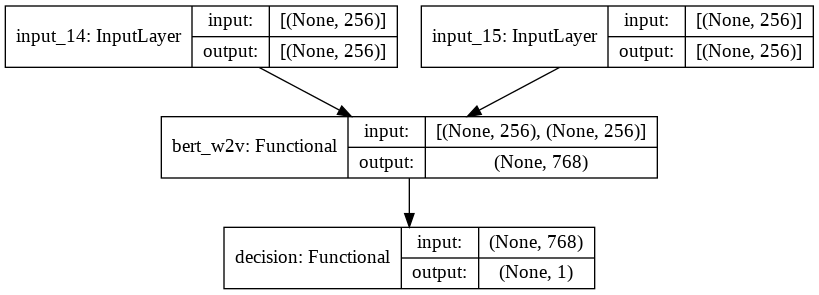

In [ ]:
plot_model(model, show_shapes=True)

In [ ]:
def custom_loss(y_true, y_pred):
    bc = keras.losses.binary_crossentropy(y_true, y_pred)
    mae = keras.losses.mean_absolute_error(y_true, y_pred)
    mse = keras.losses.mean_squared_error(y_true, y_pred)
    return bc
    return (bc + mae) / 2
bert_w2v.trainable=True
model.compile(
    loss=custom_loss,
    optimizer=keras.optimizers.Adam(0.0001),
    metrics=[keras.metrics.BinaryAccuracy(name='acc'),keras.metrics.MeanAbsoluteError(name='mae')]
)
decision.compile(
    loss=custom_loss,
    optimizer=keras.optimizers.Adam(0.0001),
    metrics=[keras.metrics.BinaryAccuracy(name='acc'),keras.metrics.MeanAbsoluteError(name='mae')]
)

In [ ]:
# data = DataGen(rank[:], context='content', concat=False, max_length=SEQ_LEN, to01=True, encoder=bert_w2v, idx_type=2)

In [ ]:
# data.encoder = bert_w2v
# x, y = data.all()
# np.savez('./data/training-sol2-rkALL.npz', x=x, y=y)

In [ ]:
t=np.load('./data/training-sol2-rkALL.npz')
x, y = t['x'], t['y']

In [ ]:
[[training_x, val_x, testing_x], [training_y, val_y, testing_y]] = split([x, y], [0.75, 0.15])

Epoch 1/150
938/938 [==============================] - 3s 3ms/step - loss: 0.6940 - acc: 0.5643 - mae: 0.4803 - val_loss: 0.6530 - val_acc: 0.6202 - val_mae: 0.4698


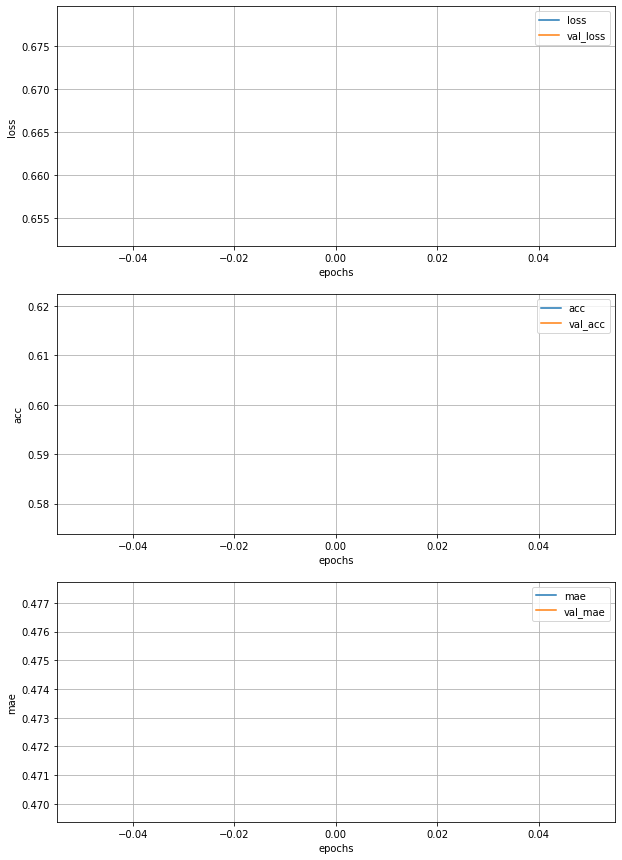

Epoch 2/150
938/938 [==============================] - 3s 3ms/step - loss: 0.6649 - acc: 0.6016 - mae: 0.4691 - val_loss: 0.6407 - val_acc: 0.6480 - val_mae: 0.4558


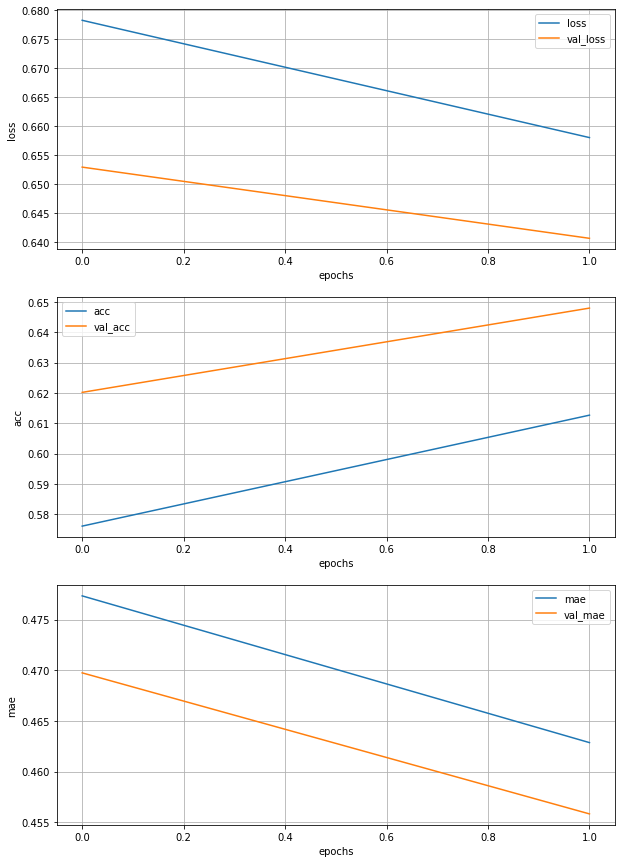

Epoch 3/150
938/938 [==============================] - 3s 3ms/step - loss: 0.6507 - acc: 0.6318 - mae: 0.4556 - val_loss: 0.6387 - val_acc: 0.6507 - val_mae: 0.4549


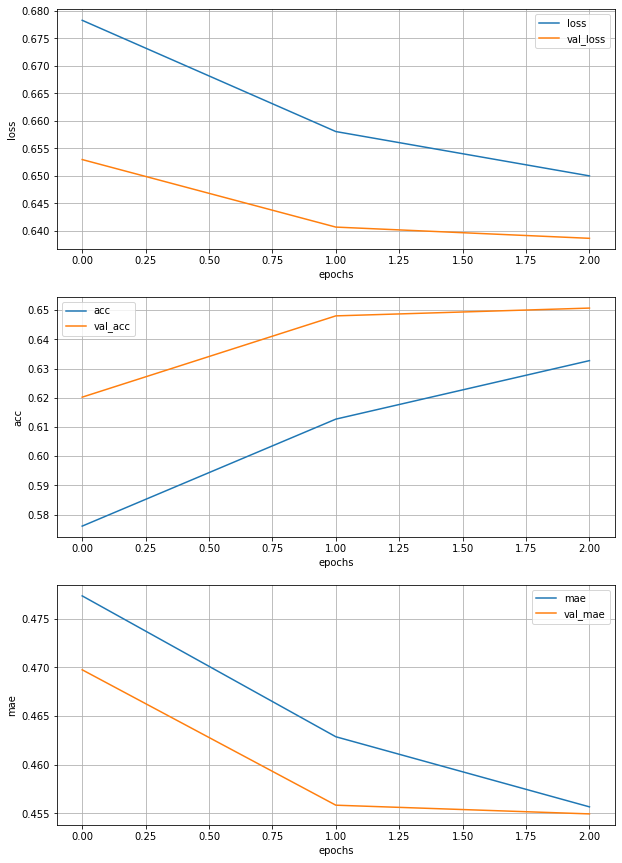

Epoch 4/150
938/938 [==============================] - 3s 3ms/step - loss: 0.6462 - acc: 0.6385 - mae: 0.4536 - val_loss: 0.6365 - val_acc: 0.6524 - val_mae: 0.4532


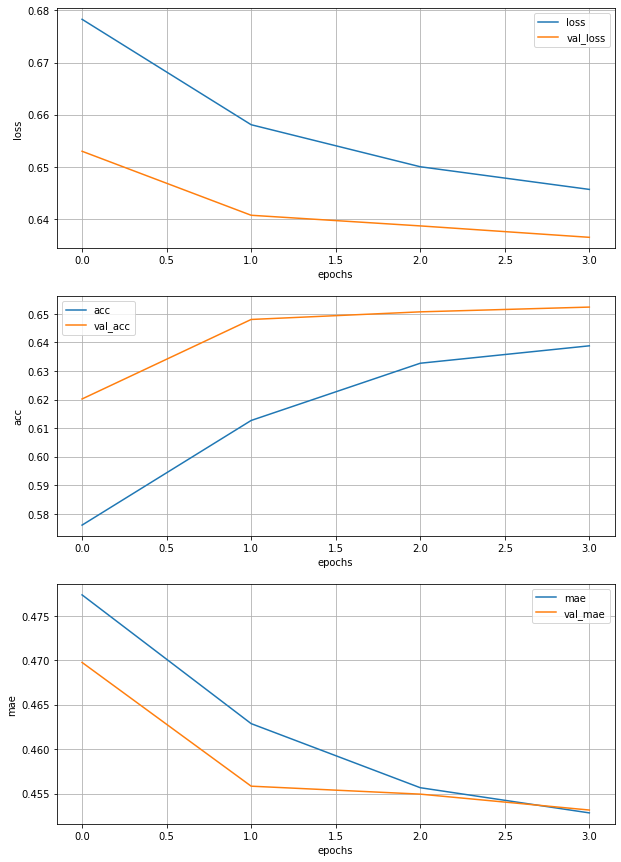

Epoch 5/150
938/938 [==============================] - 3s 3ms/step - loss: 0.6470 - acc: 0.6359 - mae: 0.4533 - val_loss: 0.6333 - val_acc: 0.6539 - val_mae: 0.4458


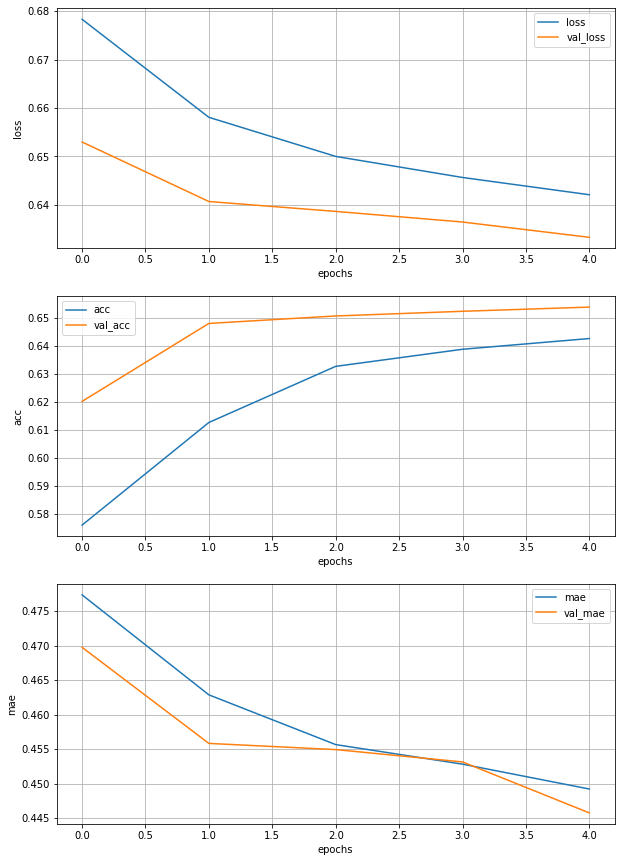

Epoch 6/150
938/938 [==============================] - 3s 3ms/step - loss: 0.6398 - acc: 0.6459 - mae: 0.4477 - val_loss: 0.6332 - val_acc: 0.6531 - val_mae: 0.4418


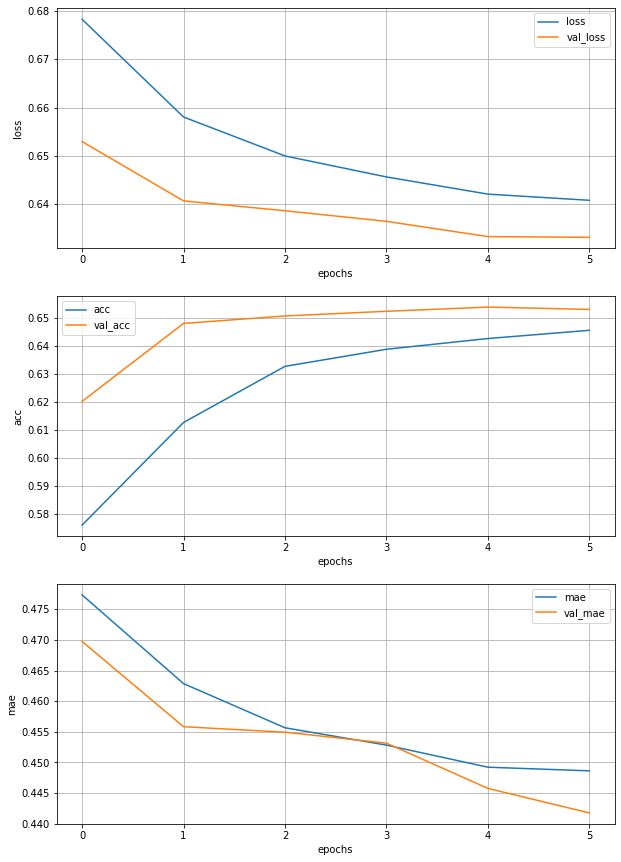

Epoch 7/150
938/938 [==============================] - 3s 3ms/step - loss: 0.6374 - acc: 0.6521 - mae: 0.4442 - val_loss: 0.6391 - val_acc: 0.6519 - val_mae: 0.4585


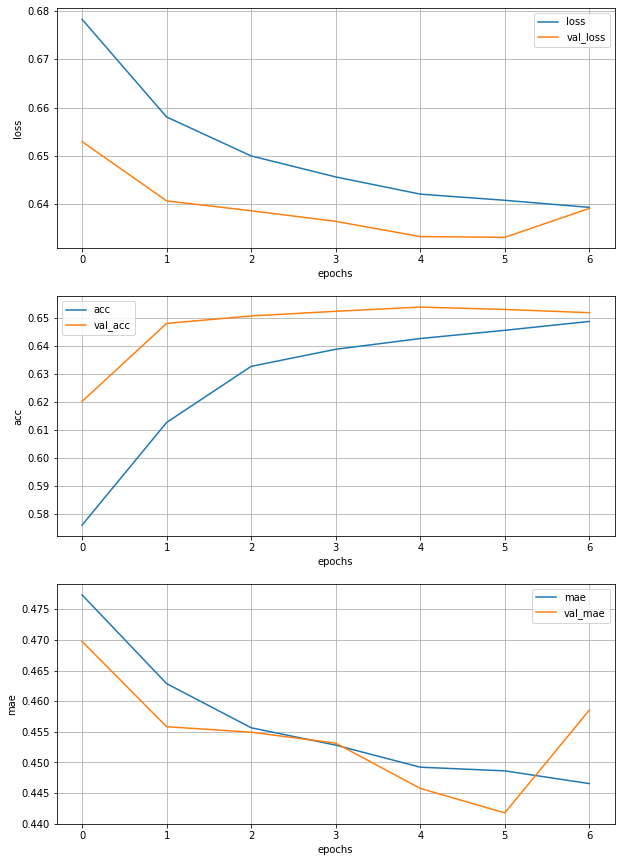

Epoch 8/150
938/938 [==============================] - 3s 3ms/step - loss: 0.6401 - acc: 0.6462 - mae: 0.4485 - val_loss: 0.6324 - val_acc: 0.6544 - val_mae: 0.4386


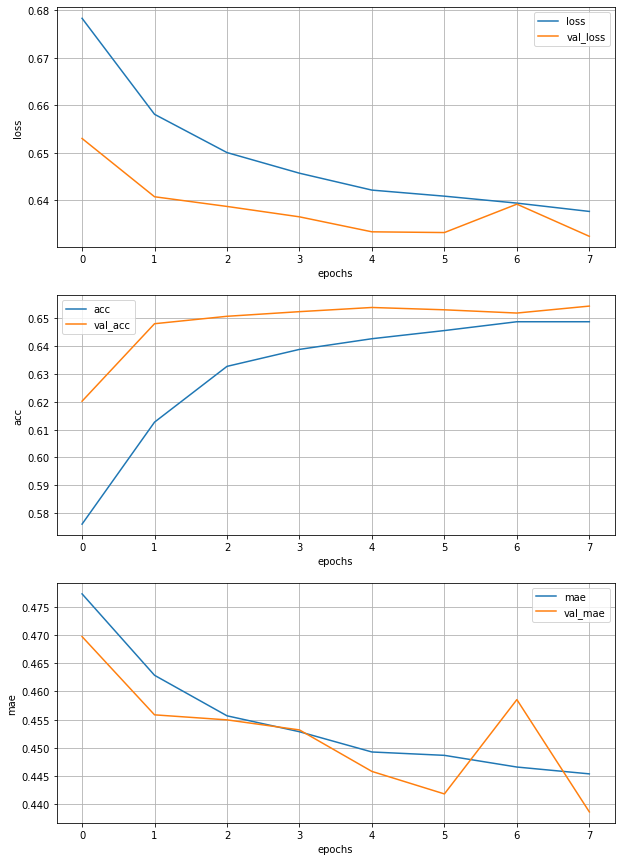

Epoch 9/150
938/938 [==============================] - 3s 3ms/step - loss: 0.6353 - acc: 0.6519 - mae: 0.4428 - val_loss: 0.6332 - val_acc: 0.6571 - val_mae: 0.4493


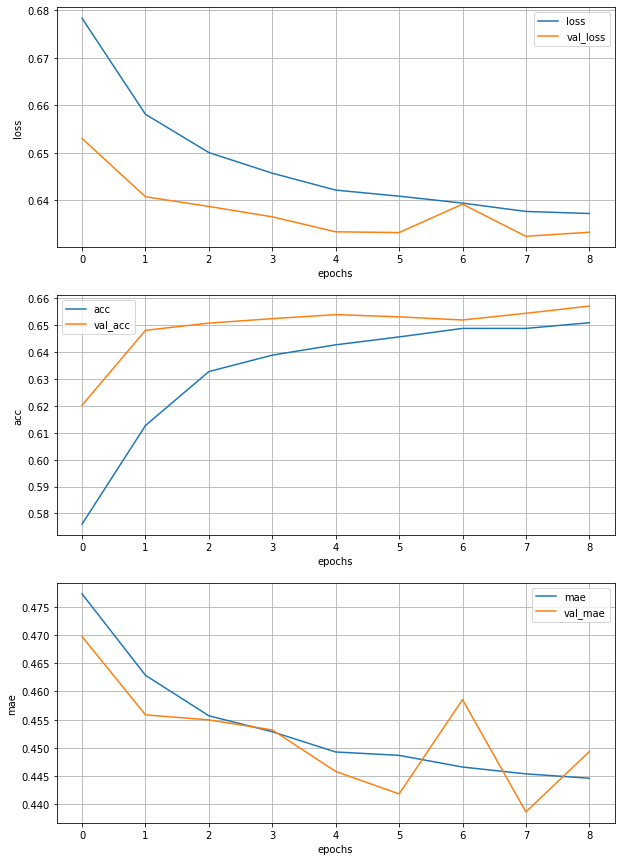

Epoch 10/150
938/938 [==============================] - 3s 3ms/step - loss: 0.6346 - acc: 0.6547 - mae: 0.4431 - val_loss: 0.6327 - val_acc: 0.6504 - val_mae: 0.4448


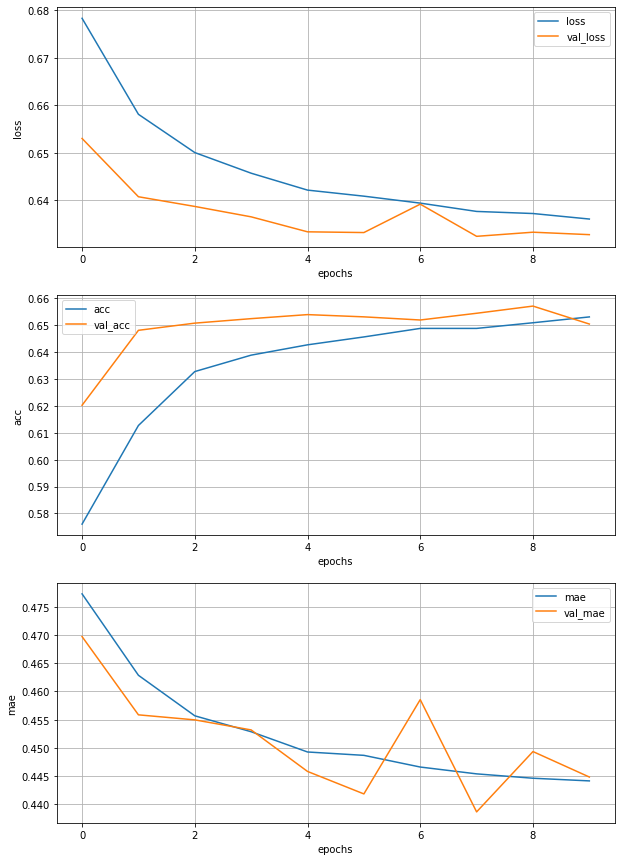

Epoch 11/150
938/938 [==============================] - 3s 3ms/step - loss: 0.6355 - acc: 0.6539 - mae: 0.4440 - val_loss: 0.6311 - val_acc: 0.6561 - val_mae: 0.4463


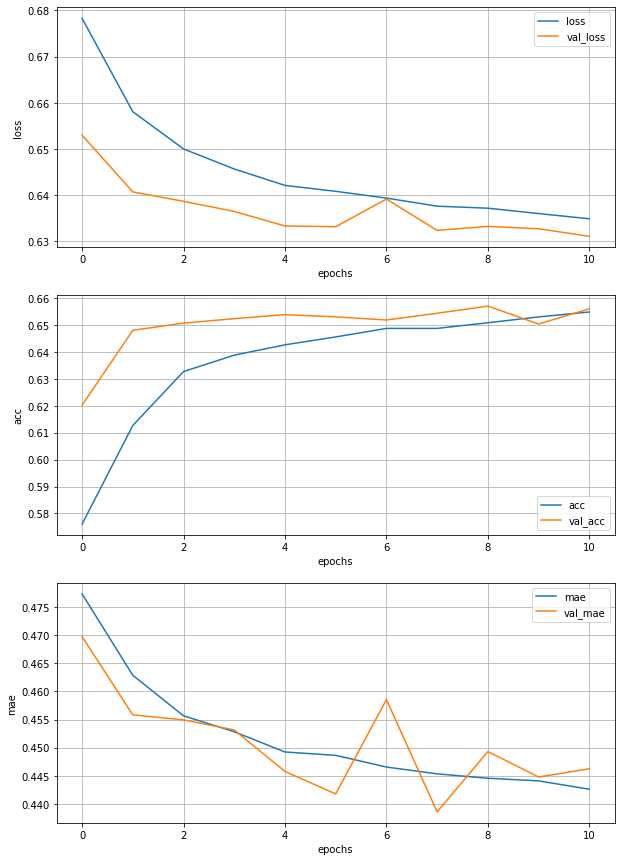

Epoch 12/150
938/938 [==============================] - 3s 3ms/step - loss: 0.6350 - acc: 0.6489 - mae: 0.4433 - val_loss: 0.6300 - val_acc: 0.6564 - val_mae: 0.4402


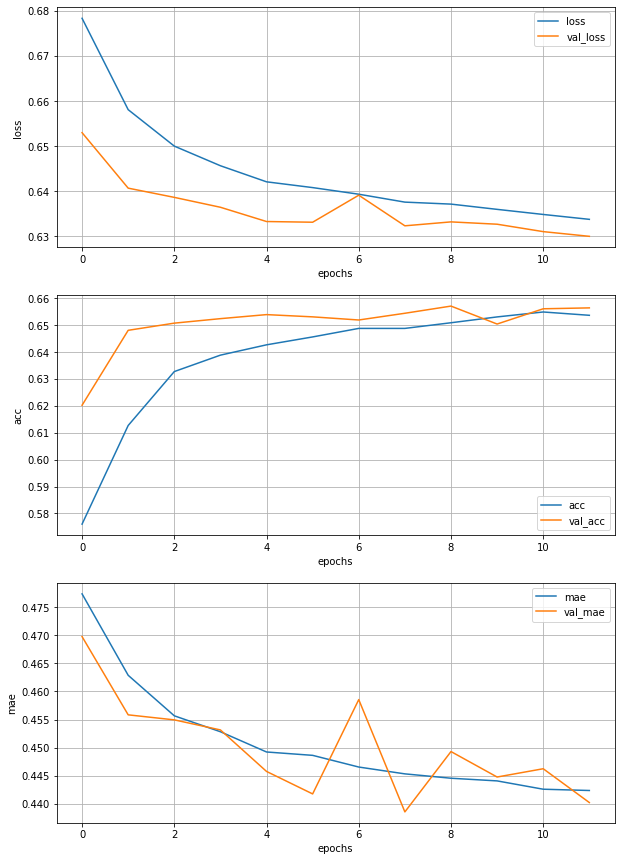

Epoch 13/150
938/938 [==============================] - 3s 3ms/step - loss: 0.6343 - acc: 0.6525 - mae: 0.4412 - val_loss: 0.6309 - val_acc: 0.6551 - val_mae: 0.4452


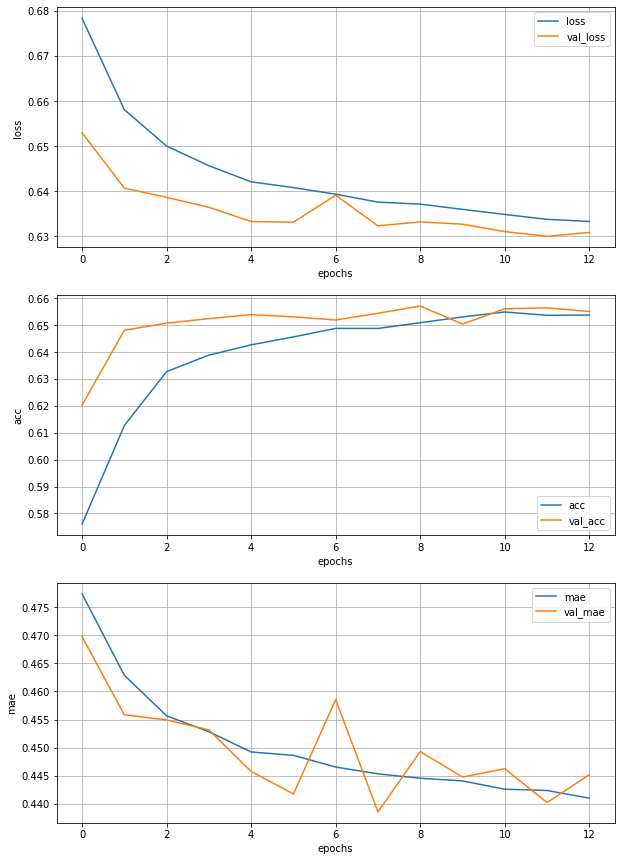

Epoch 14/150
938/938 [==============================] - 3s 3ms/step - loss: 0.6325 - acc: 0.6592 - mae: 0.4408 - val_loss: 0.6298 - val_acc: 0.6574 - val_mae: 0.4454


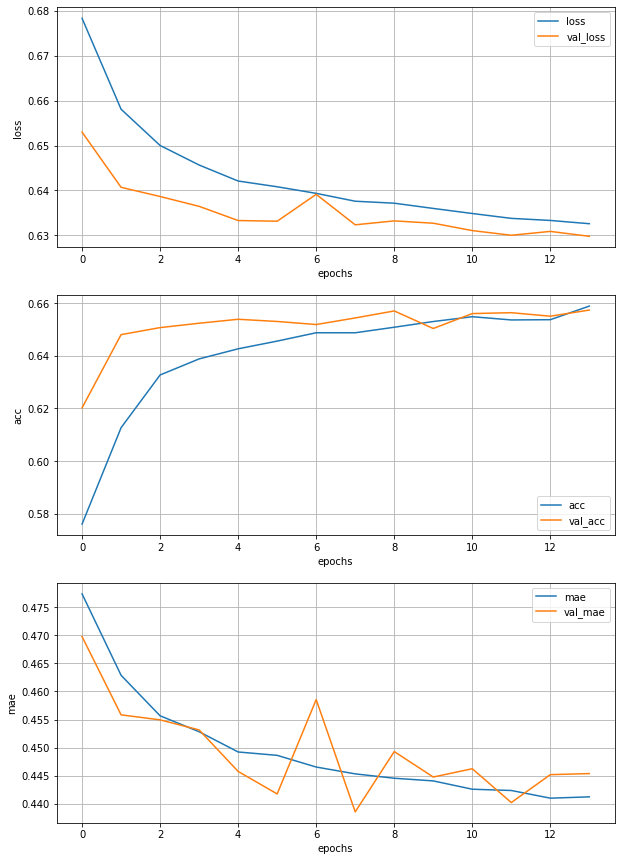

Epoch 15/150
938/938 [==============================] - 3s 3ms/step - loss: 0.6311 - acc: 0.6608 - mae: 0.4399 - val_loss: 0.6287 - val_acc: 0.6564 - val_mae: 0.4442


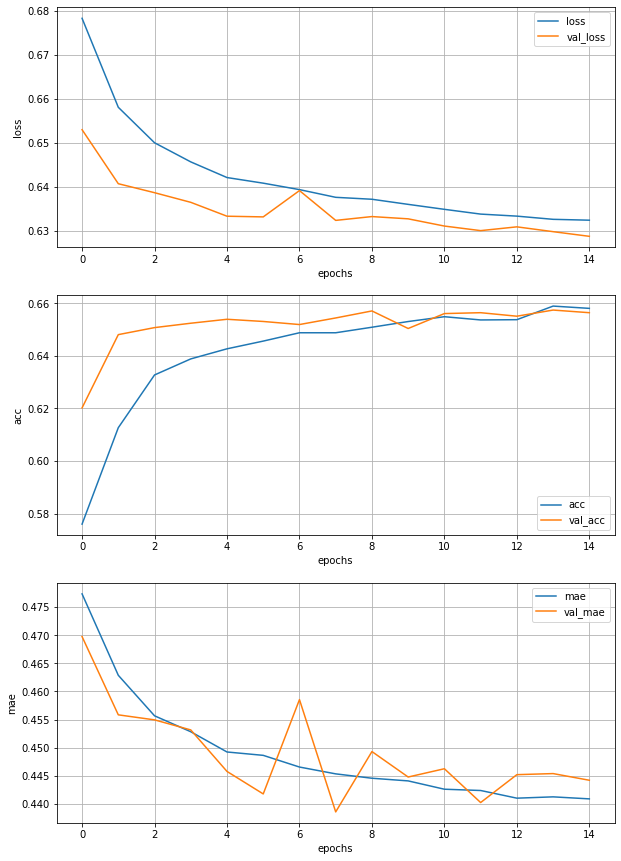

Epoch 16/150
938/938 [==============================] - 3s 4ms/step - loss: 0.6297 - acc: 0.6623 - mae: 0.4385 - val_loss: 0.6303 - val_acc: 0.6586 - val_mae: 0.4491


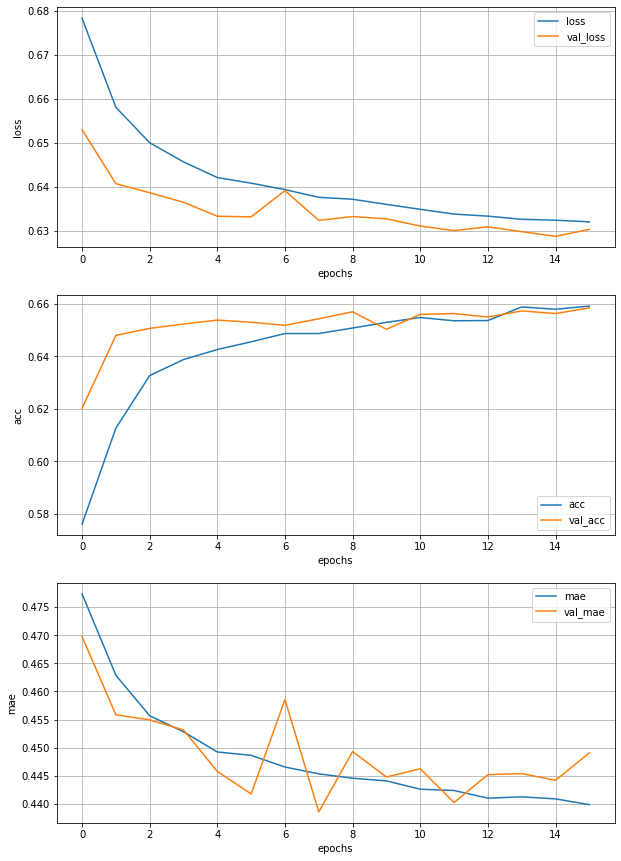

Epoch 17/150
938/938 [==============================] - 4s 4ms/step - loss: 0.6323 - acc: 0.6598 - mae: 0.4420 - val_loss: 0.6292 - val_acc: 0.6552 - val_mae: 0.4391


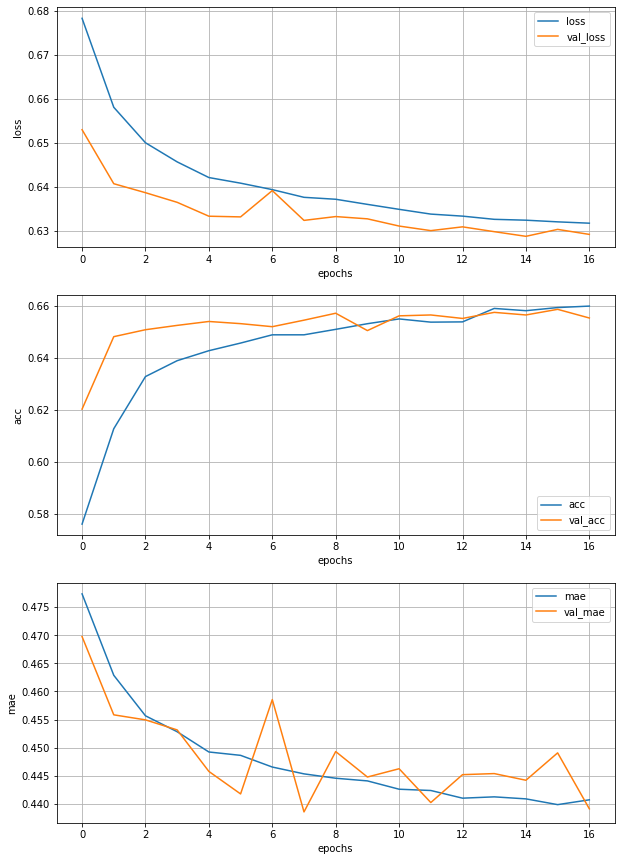

Epoch 18/150
938/938 [==============================] - 3s 4ms/step - loss: 0.6335 - acc: 0.6549 - mae: 0.4412 - val_loss: 0.6303 - val_acc: 0.6571 - val_mae: 0.4457


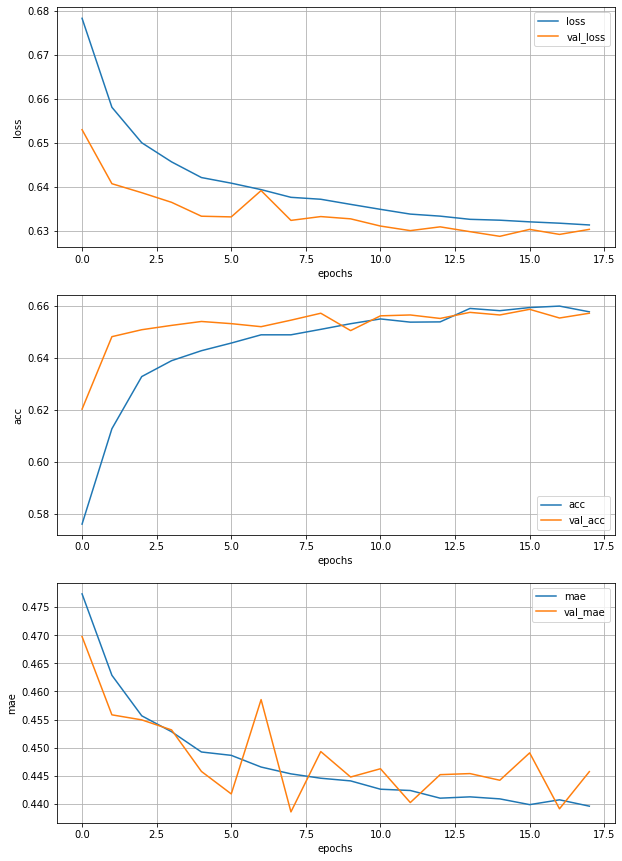

Epoch 19/150
938/938 [==============================] - 3s 4ms/step - loss: 0.6306 - acc: 0.6607 - mae: 0.4393 - val_loss: 0.6266 - val_acc: 0.6589 - val_mae: 0.4400


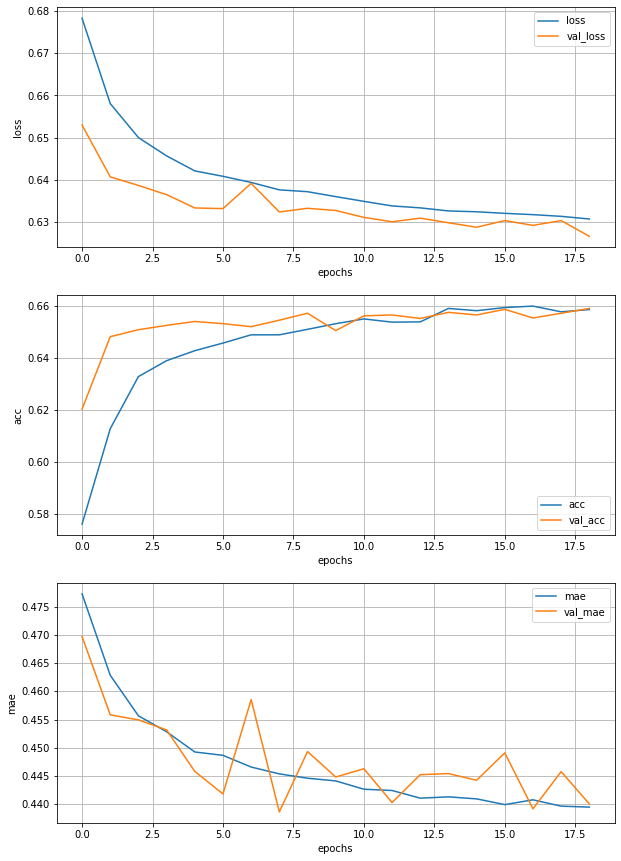

Epoch 20/150
938/938 [==============================] - 3s 4ms/step - loss: 0.6284 - acc: 0.6596 - mae: 0.4377 - val_loss: 0.6287 - val_acc: 0.6562 - val_mae: 0.4447


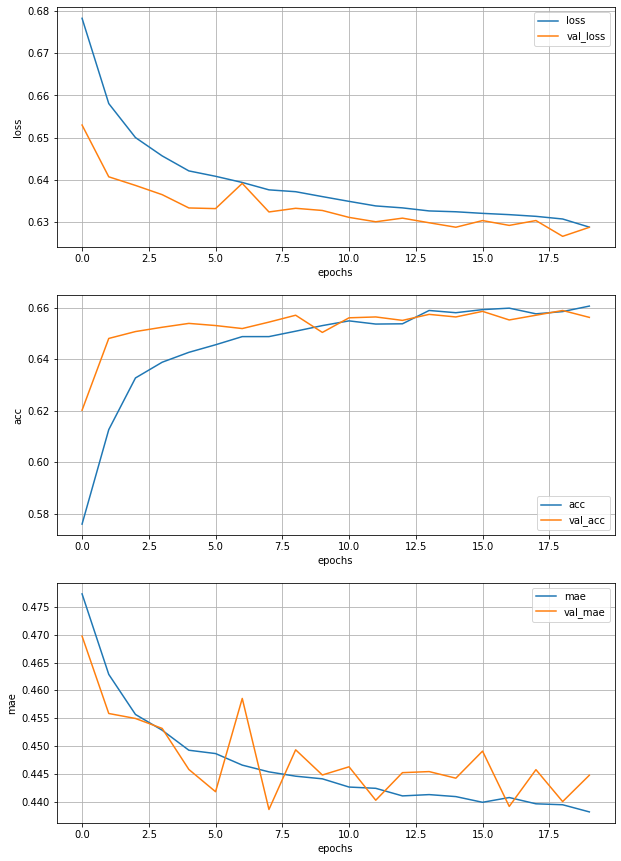

Epoch 21/150
938/938 [==============================] - 4s 4ms/step - loss: 0.6274 - acc: 0.6637 - mae: 0.4359 - val_loss: 0.6261 - val_acc: 0.6594 - val_mae: 0.4397


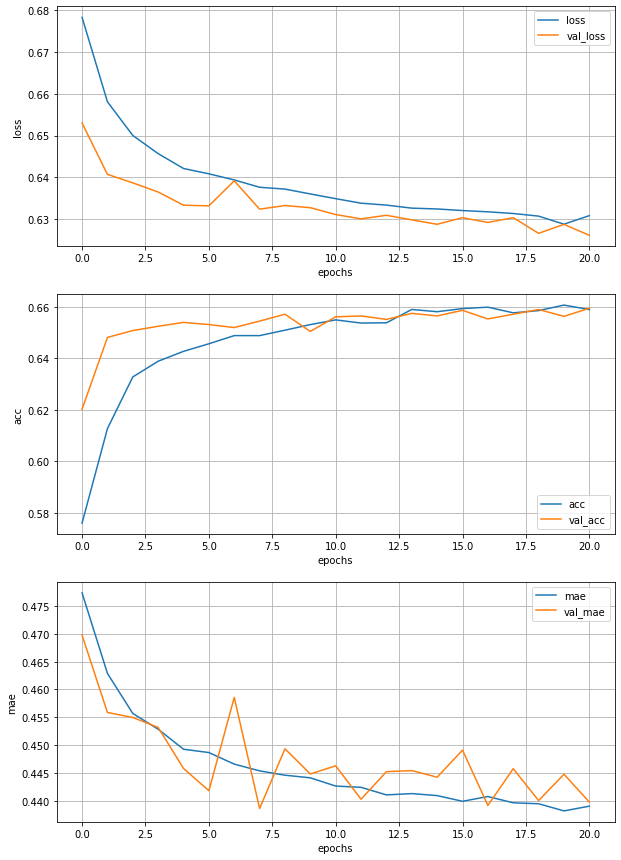

Epoch 22/150
938/938 [==============================] - 4s 4ms/step - loss: 0.6289 - acc: 0.6613 - mae: 0.4383 - val_loss: 0.6279 - val_acc: 0.6582 - val_mae: 0.4421


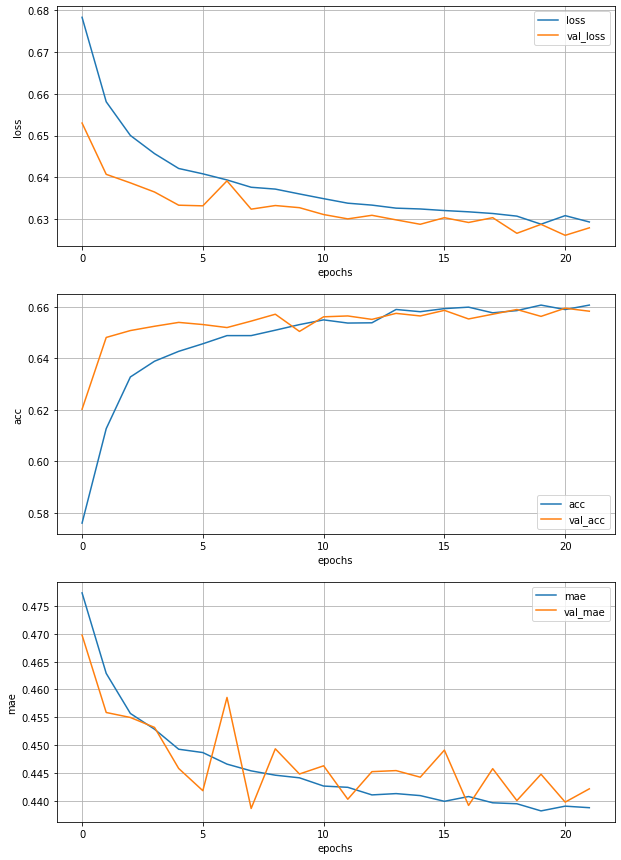

Epoch 23/150
938/938 [==============================] - 4s 4ms/step - loss: 0.6273 - acc: 0.6651 - mae: 0.4368 - val_loss: 0.6260 - val_acc: 0.6579 - val_mae: 0.4395


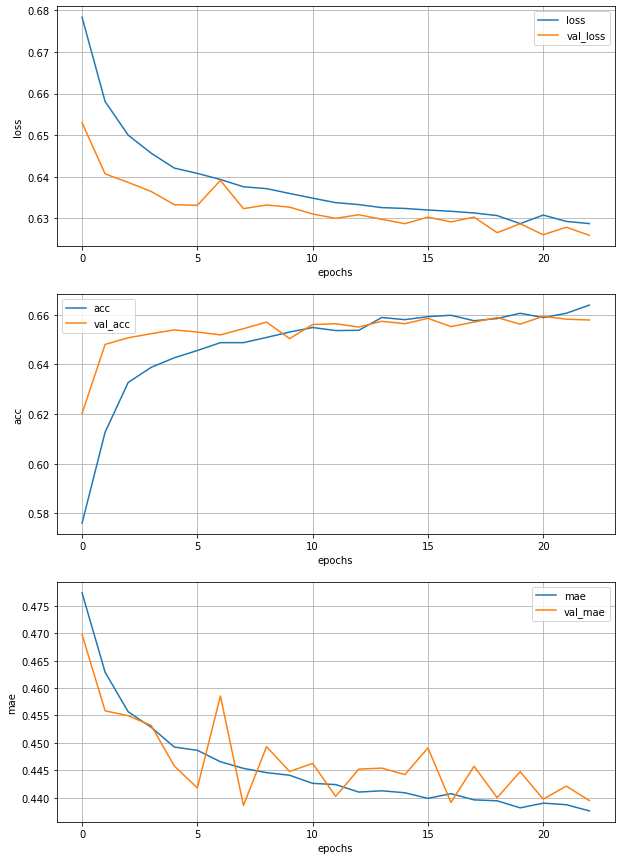

Epoch 24/150
938/938 [==============================] - 4s 4ms/step - loss: 0.6301 - acc: 0.6589 - mae: 0.4390 - val_loss: 0.6257 - val_acc: 0.6569 - val_mae: 0.4392


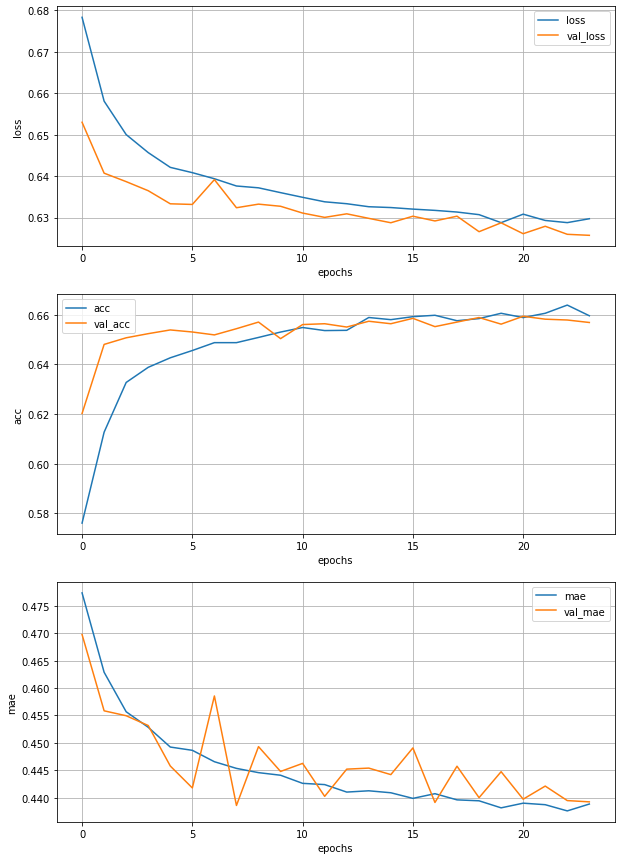

Epoch 25/150
938/938 [==============================] - 4s 4ms/step - loss: 0.6306 - acc: 0.6564 - mae: 0.4384 - val_loss: 0.6256 - val_acc: 0.6607 - val_mae: 0.4358


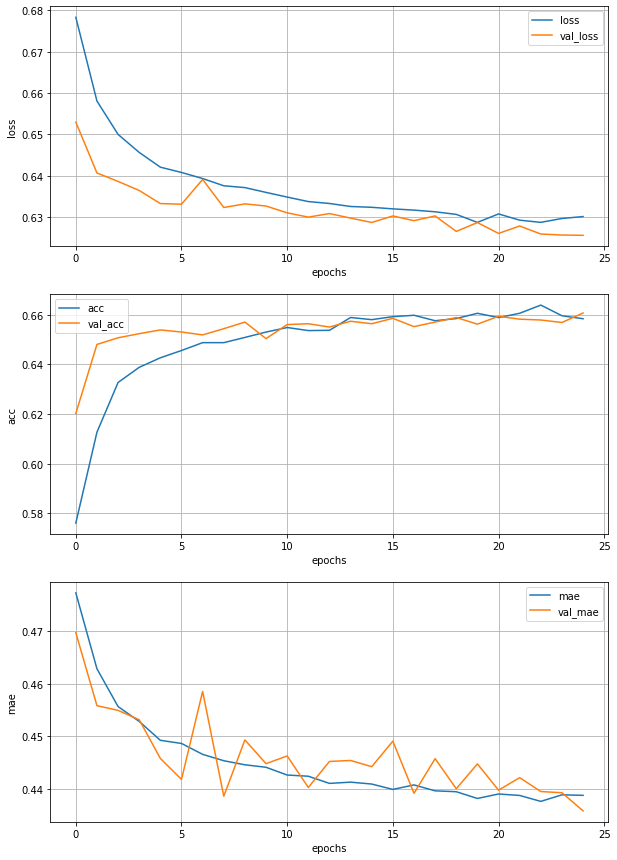

Epoch 26/150
938/938 [==============================] - 4s 4ms/step - loss: 0.6298 - acc: 0.6579 - mae: 0.4372 - val_loss: 0.6261 - val_acc: 0.6589 - val_mae: 0.4425


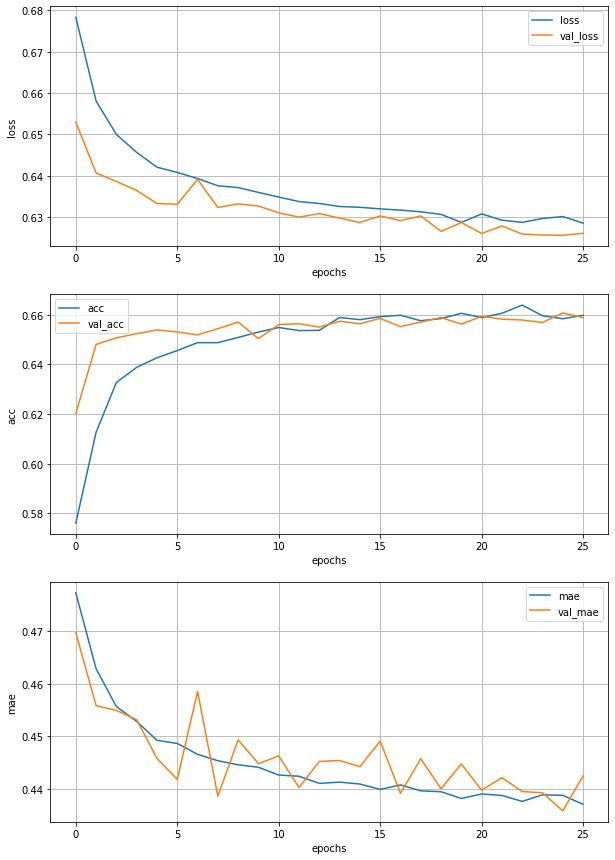

Epoch 27/150
938/938 [==============================] - 4s 4ms/step - loss: 0.6276 - acc: 0.6612 - mae: 0.4369 - val_loss: 0.6254 - val_acc: 0.6597 - val_mae: 0.4409


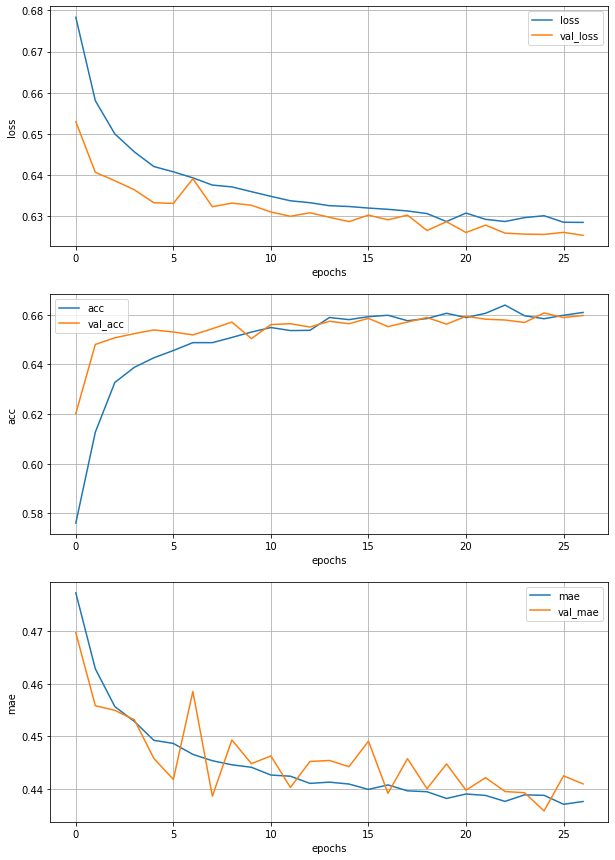

Epoch 28/150
938/938 [==============================] - 4s 4ms/step - loss: 0.6304 - acc: 0.6569 - mae: 0.4392 - val_loss: 0.6247 - val_acc: 0.6572 - val_mae: 0.4392


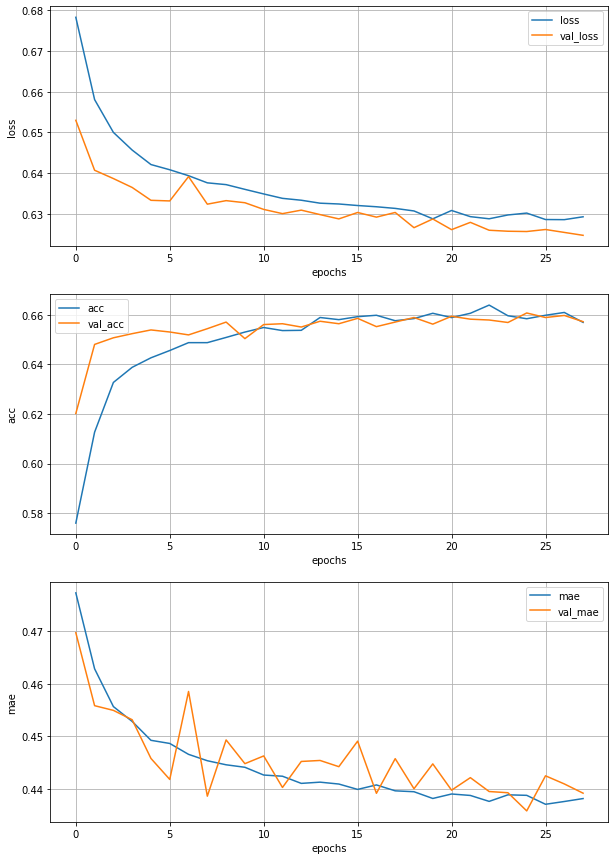

Epoch 29/150
938/938 [==============================] - 4s 4ms/step - loss: 0.6280 - acc: 0.6616 - mae: 0.4364 - val_loss: 0.6252 - val_acc: 0.6569 - val_mae: 0.4374


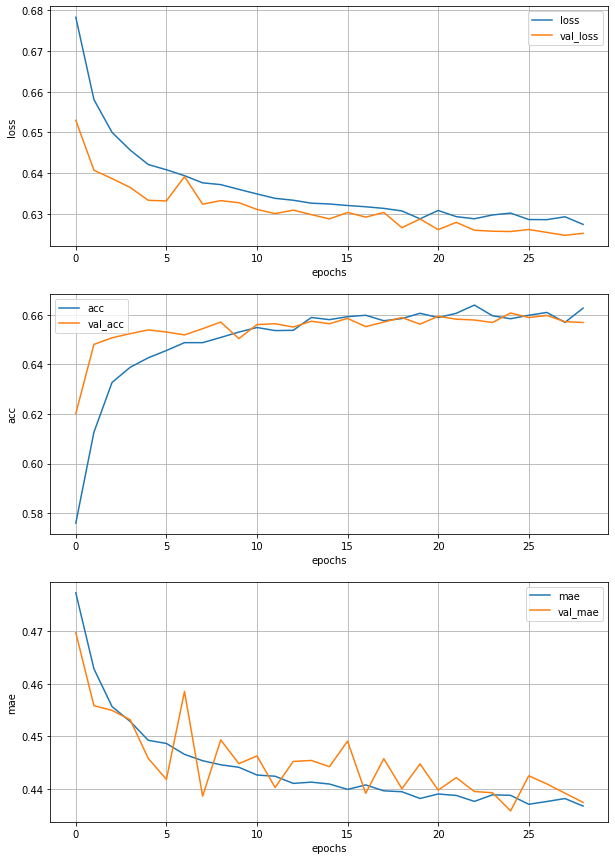

Epoch 30/150
938/938 [==============================] - 4s 4ms/step - loss: 0.6295 - acc: 0.6634 - mae: 0.4375 - val_loss: 0.6246 - val_acc: 0.6619 - val_mae: 0.4377


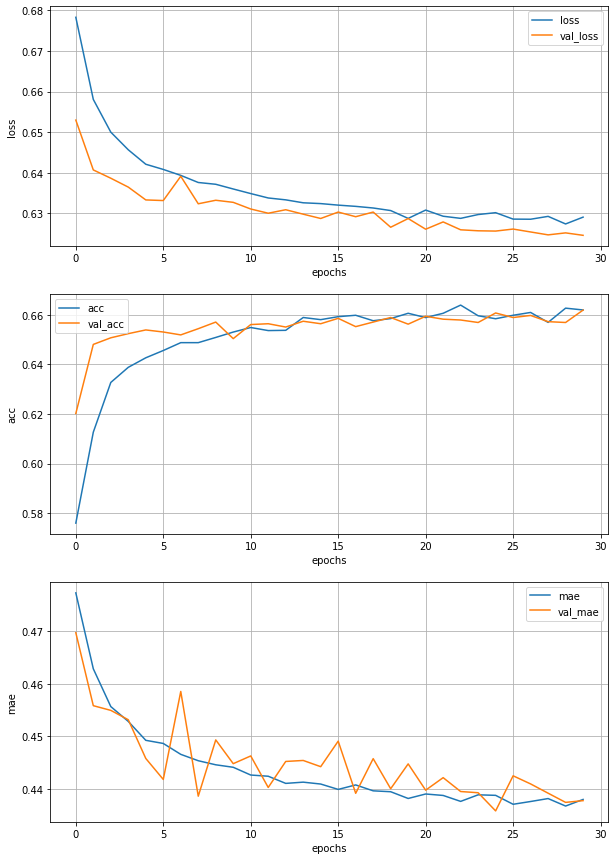

Epoch 31/150
938/938 [==============================] - 4s 4ms/step - loss: 0.6277 - acc: 0.6607 - mae: 0.4365 - val_loss: 0.6249 - val_acc: 0.6604 - val_mae: 0.4349


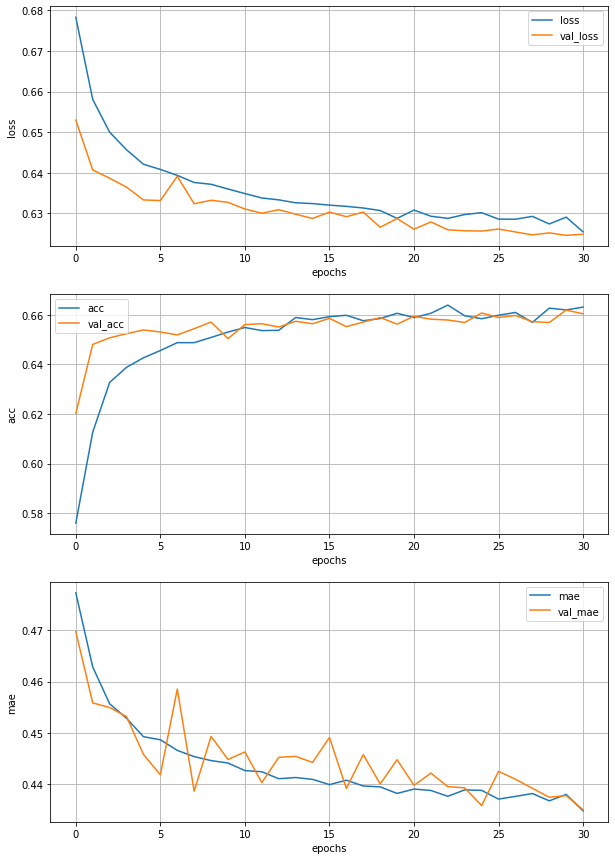

Epoch 32/150
938/938 [==============================] - 4s 4ms/step - loss: 0.6236 - acc: 0.6627 - mae: 0.4342 - val_loss: 0.6246 - val_acc: 0.6582 - val_mae: 0.4331


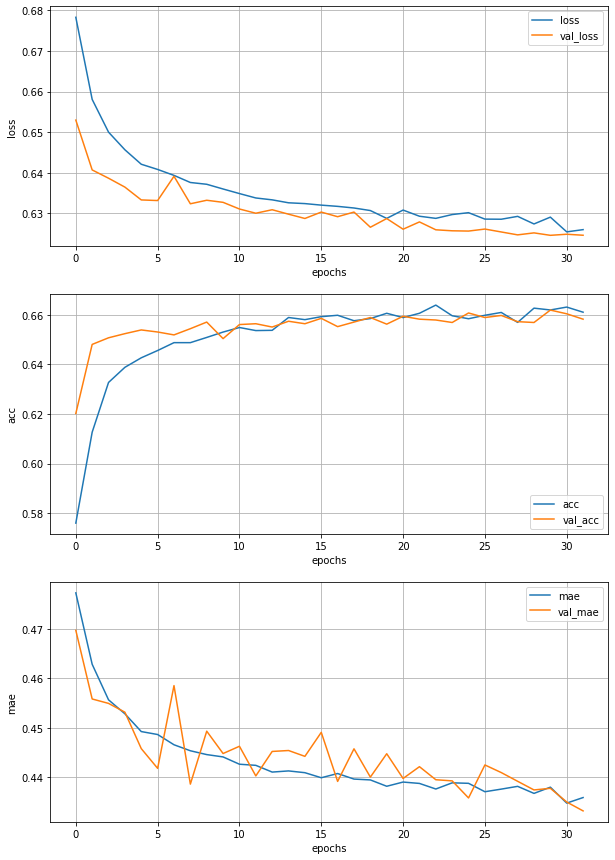

Epoch 33/150
938/938 [==============================] - 4s 4ms/step - loss: 0.6266 - acc: 0.6611 - mae: 0.4352 - val_loss: 0.6255 - val_acc: 0.6571 - val_mae: 0.4407


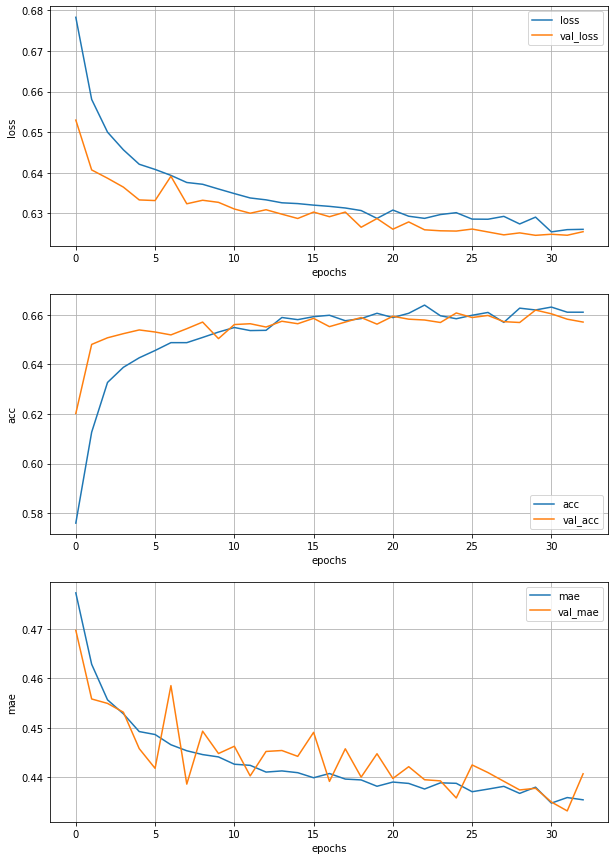

Epoch 34/150
938/938 [==============================] - 4s 4ms/step - loss: 0.6207 - acc: 0.6667 - mae: 0.4311 - val_loss: 0.6240 - val_acc: 0.6612 - val_mae: 0.4395


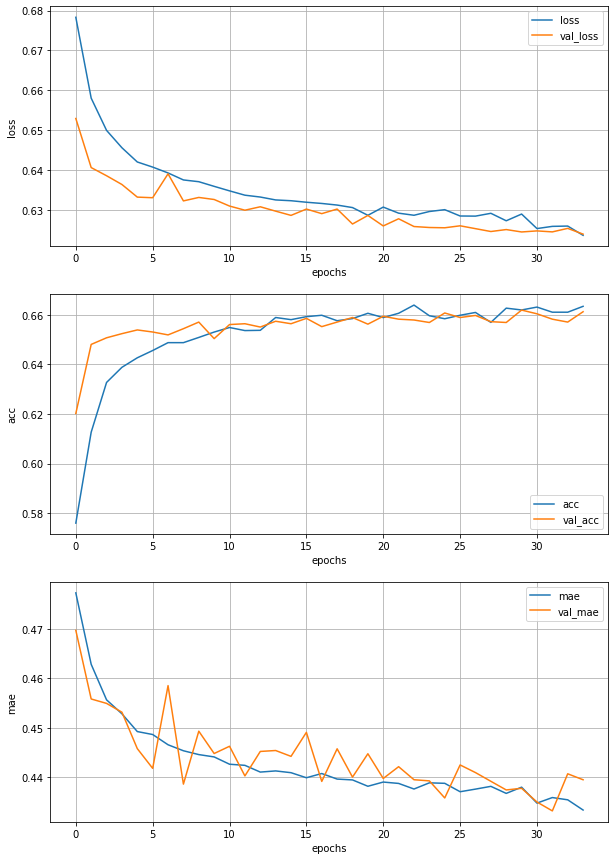

Epoch 35/150
938/938 [==============================] - 4s 4ms/step - loss: 0.6234 - acc: 0.6677 - mae: 0.4343 - val_loss: 0.6238 - val_acc: 0.6602 - val_mae: 0.4330


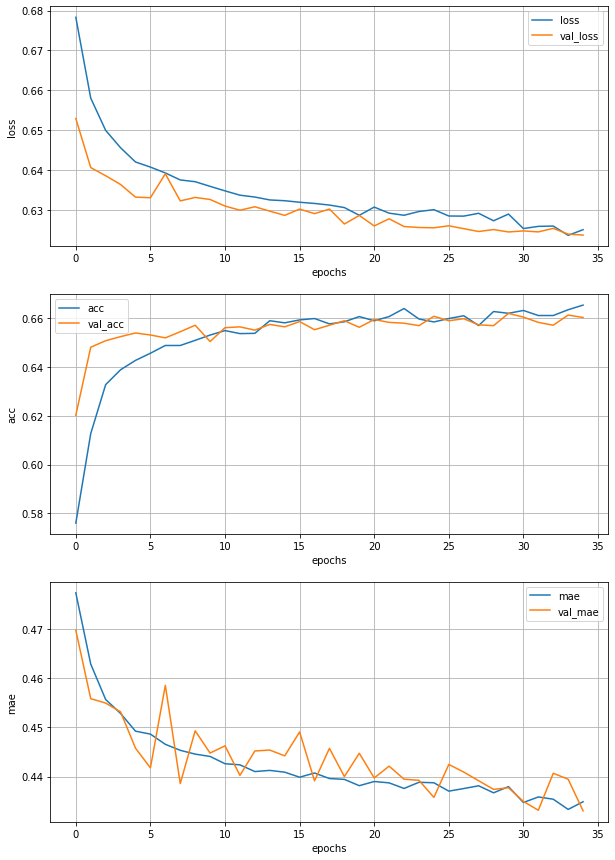

Epoch 36/150
938/938 [==============================] - 4s 4ms/step - loss: 0.6244 - acc: 0.6627 - mae: 0.4339 - val_loss: 0.6233 - val_acc: 0.6564 - val_mae: 0.4363


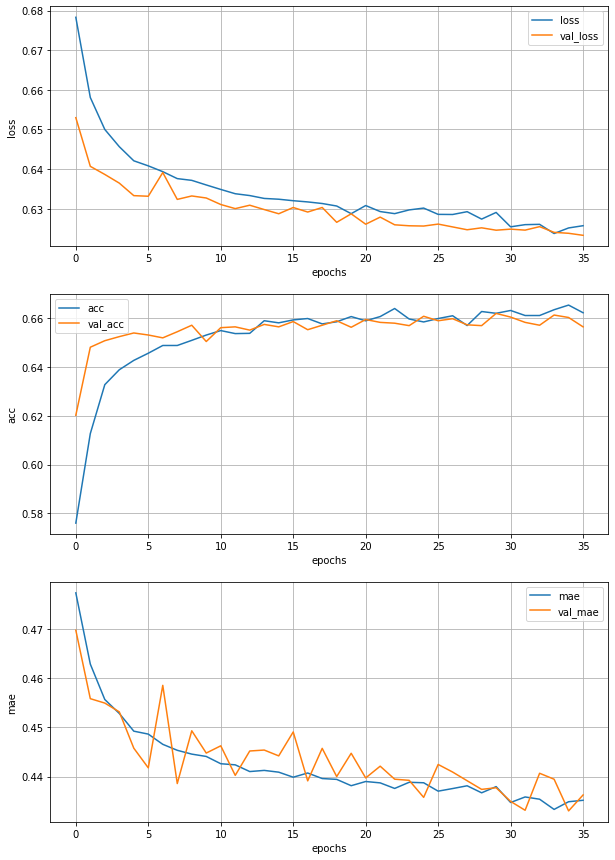

Epoch 37/150
938/938 [==============================] - 4s 4ms/step - loss: 0.6270 - acc: 0.6606 - mae: 0.4352 - val_loss: 0.6254 - val_acc: 0.6582 - val_mae: 0.4436


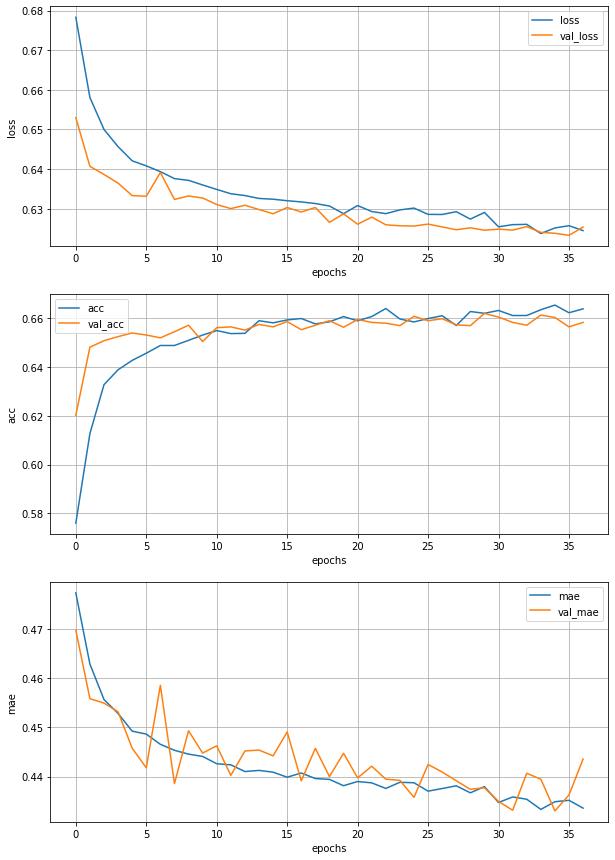

Epoch 38/150
938/938 [==============================] - 4s 4ms/step - loss: 0.6257 - acc: 0.6640 - mae: 0.4349 - val_loss: 0.6257 - val_acc: 0.6617 - val_mae: 0.4450


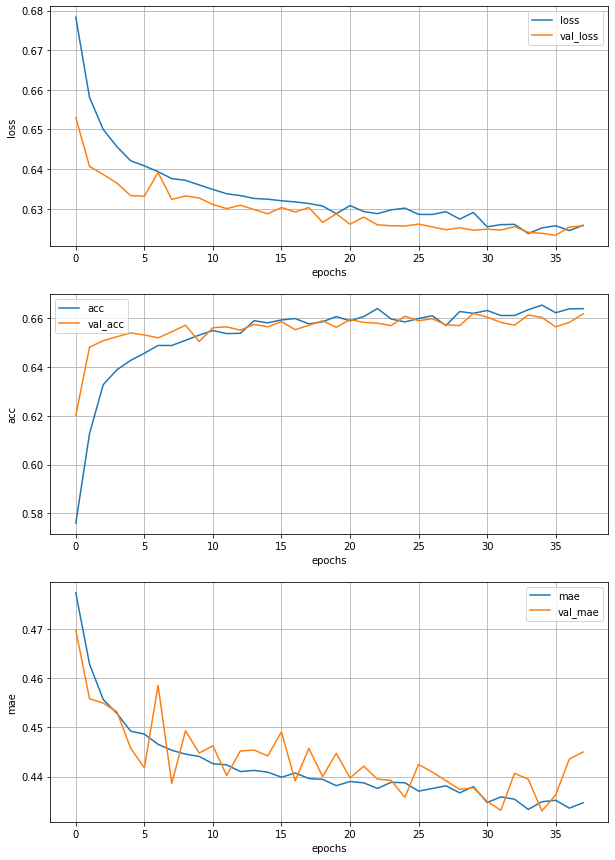

Epoch 39/150
938/938 [==============================] - 4s 5ms/step - loss: 0.6290 - acc: 0.6615 - mae: 0.4385 - val_loss: 0.6242 - val_acc: 0.6622 - val_mae: 0.4412


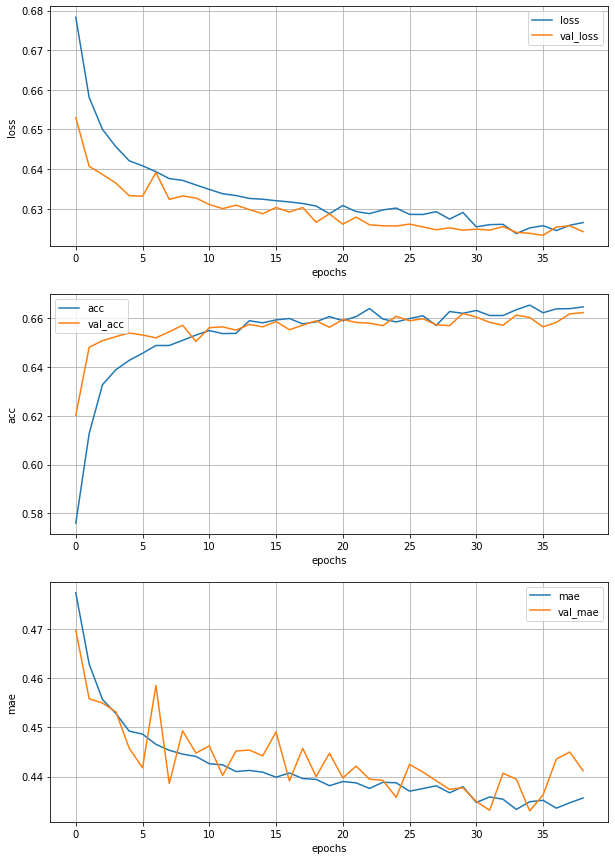

Epoch 40/150
938/938 [==============================] - 4s 4ms/step - loss: 0.6271 - acc: 0.6614 - mae: 0.4365 - val_loss: 0.6263 - val_acc: 0.6592 - val_mae: 0.4454


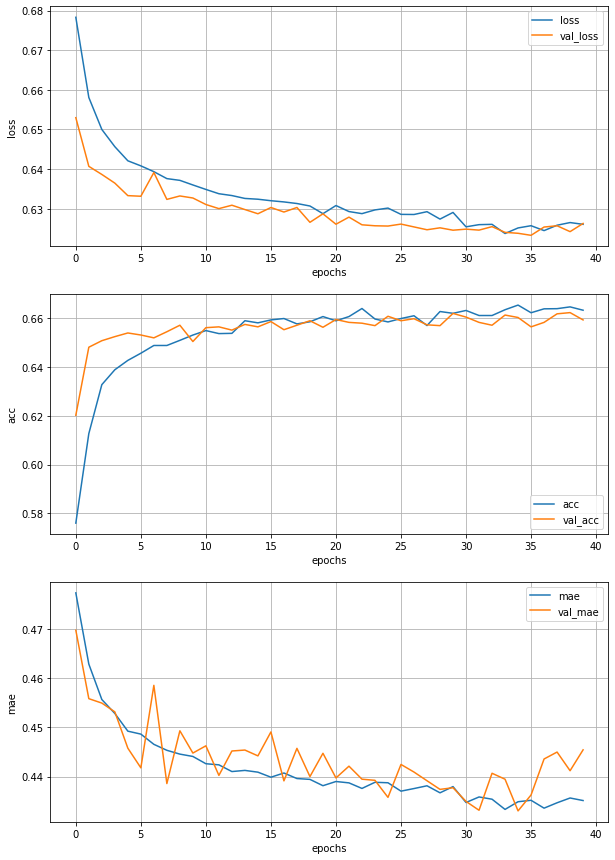

Epoch 41/150
938/938 [==============================] - 4s 4ms/step - loss: 0.6278 - acc: 0.6601 - mae: 0.4376 - val_loss: 0.6267 - val_acc: 0.6584 - val_mae: 0.4458


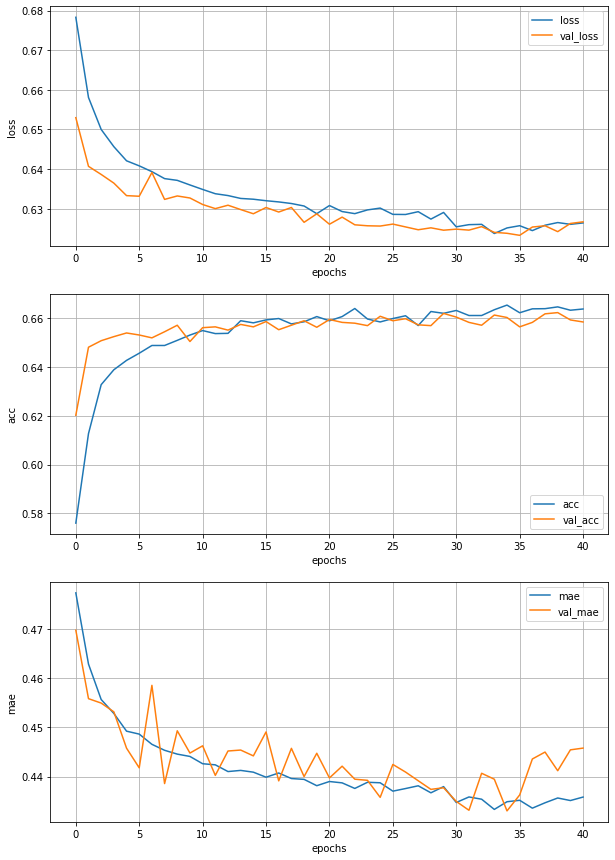

Epoch 42/150
938/938 [==============================] - 4s 5ms/step - loss: 0.6225 - acc: 0.6679 - mae: 0.4340 - val_loss: 0.6224 - val_acc: 0.6634 - val_mae: 0.4322


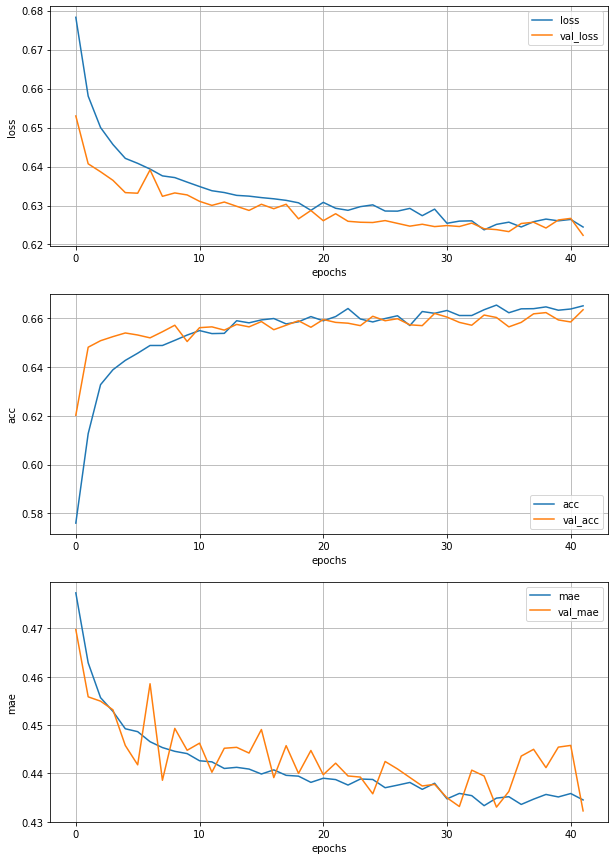

Epoch 43/150
938/938 [==============================] - 4s 4ms/step - loss: 0.6250 - acc: 0.6636 - mae: 0.4341 - val_loss: 0.6248 - val_acc: 0.6612 - val_mae: 0.4401


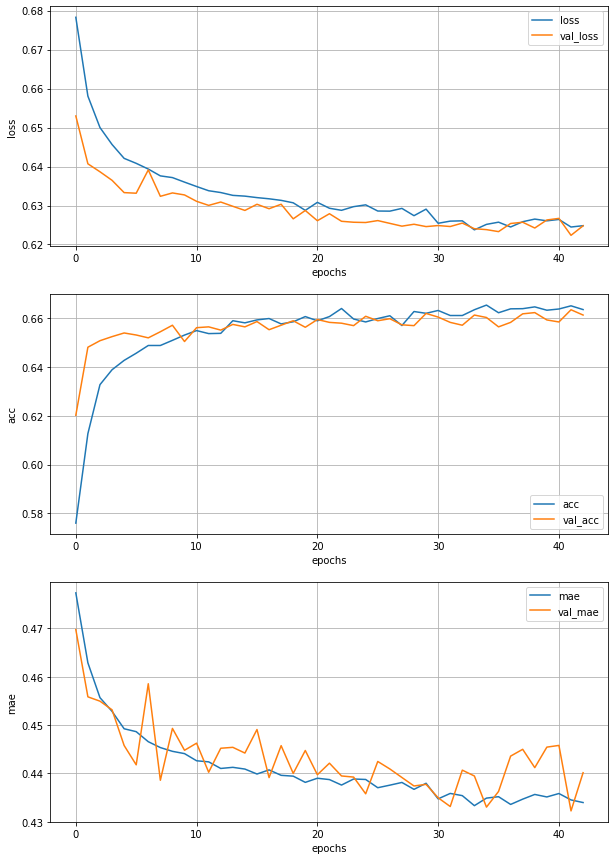

Epoch 44/150
938/938 [==============================] - 4s 4ms/step - loss: 0.6252 - acc: 0.6655 - mae: 0.4353 - val_loss: 0.6232 - val_acc: 0.6636 - val_mae: 0.4398


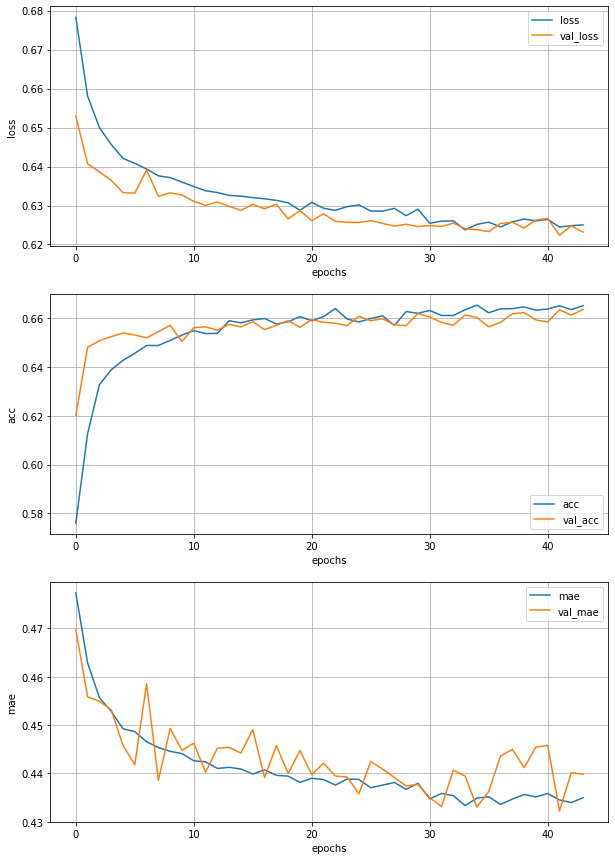

Epoch 45/150
938/938 [==============================] - 4s 4ms/step - loss: 0.6243 - acc: 0.6621 - mae: 0.4343 - val_loss: 0.6221 - val_acc: 0.6614 - val_mae: 0.4358


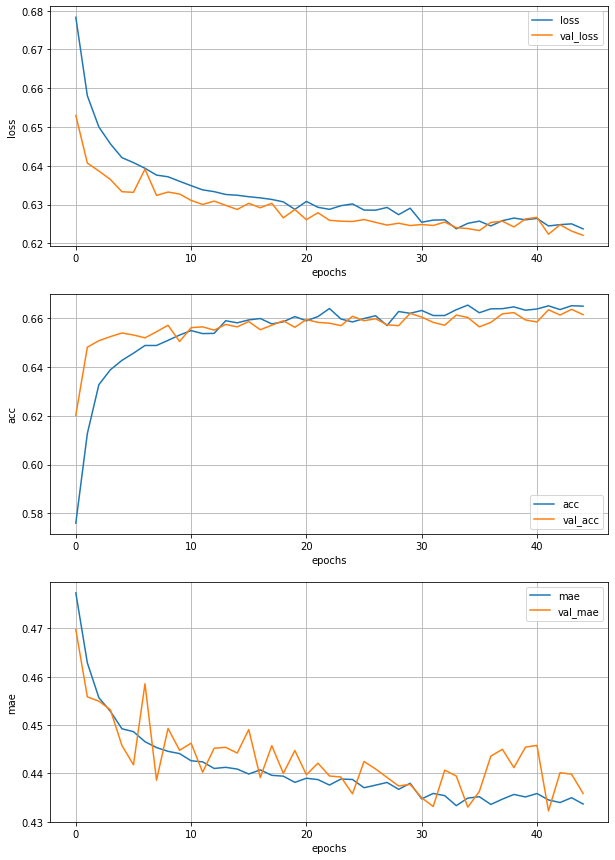

Epoch 46/150
938/938 [==============================] - 4s 5ms/step - loss: 0.6232 - acc: 0.6664 - mae: 0.4335 - val_loss: 0.6244 - val_acc: 0.6607 - val_mae: 0.4431


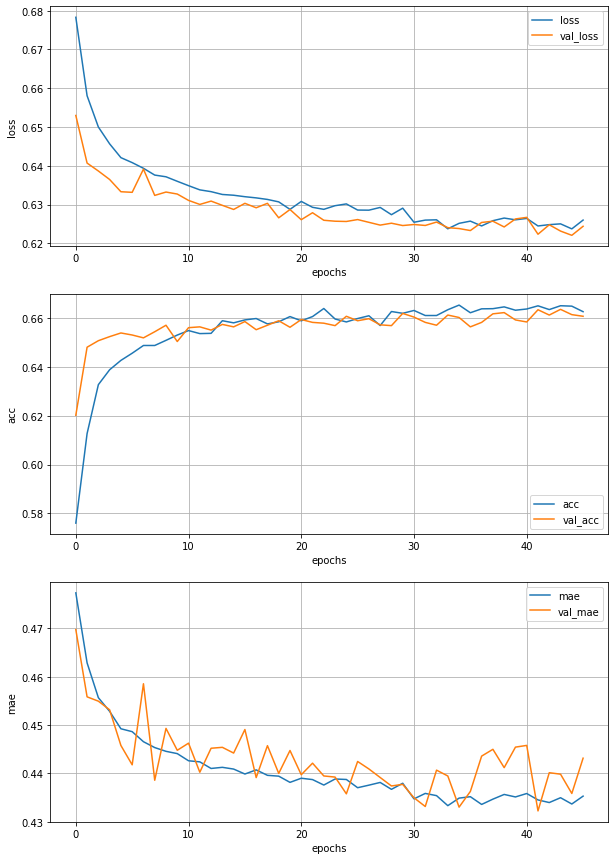

Epoch 47/150
938/938 [==============================] - 4s 4ms/step - loss: 0.6229 - acc: 0.6626 - mae: 0.4336 - val_loss: 0.6230 - val_acc: 0.6607 - val_mae: 0.4353


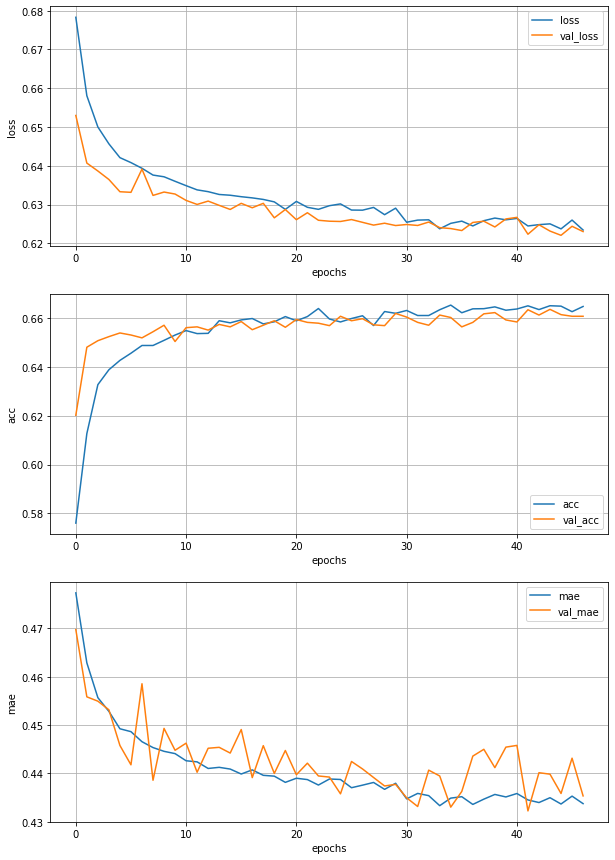

Epoch 48/150
938/938 [==============================] - 4s 5ms/step - loss: 0.6297 - acc: 0.6574 - mae: 0.4379 - val_loss: 0.6217 - val_acc: 0.6579 - val_mae: 0.4374


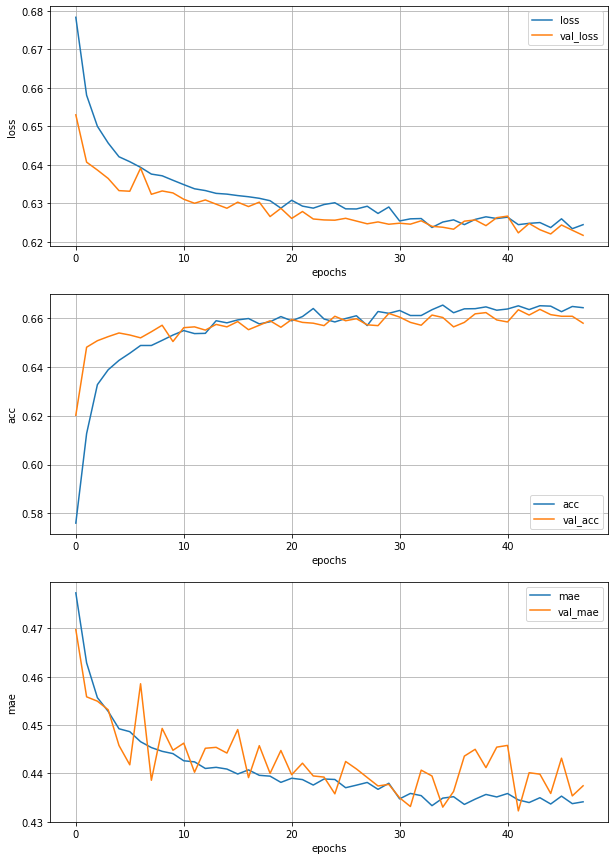

Epoch 49/150
938/938 [==============================] - 4s 5ms/step - loss: 0.6244 - acc: 0.6627 - mae: 0.4337 - val_loss: 0.6217 - val_acc: 0.6631 - val_mae: 0.4365


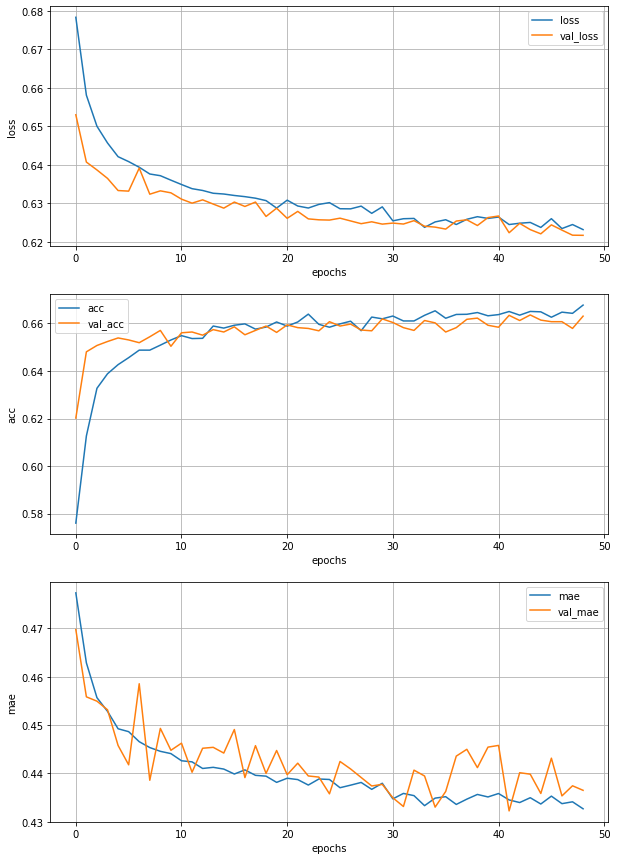

Epoch 50/150
938/938 [==============================] - 4s 5ms/step - loss: 0.6233 - acc: 0.6625 - mae: 0.4335 - val_loss: 0.6208 - val_acc: 0.6617 - val_mae: 0.4358


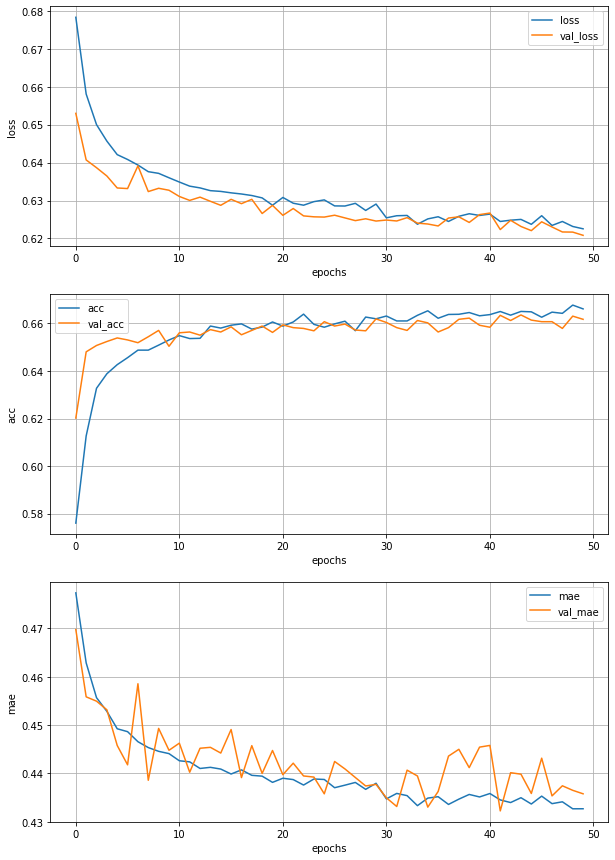

Epoch 51/150
938/938 [==============================] - 4s 5ms/step - loss: 0.6188 - acc: 0.6706 - mae: 0.4286 - val_loss: 0.6244 - val_acc: 0.6642 - val_mae: 0.4426


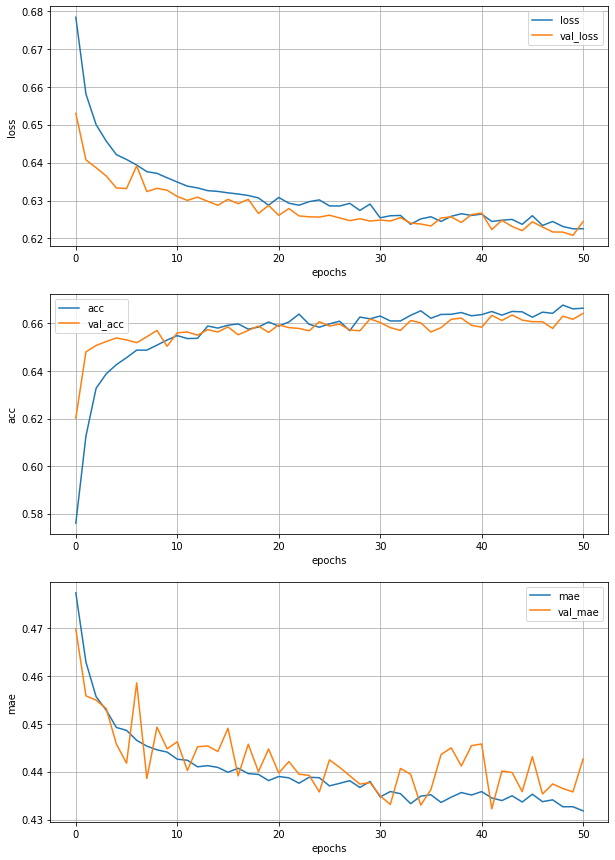

Epoch 52/150
938/938 [==============================] - 4s 5ms/step - loss: 0.6226 - acc: 0.6695 - mae: 0.4326 - val_loss: 0.6210 - val_acc: 0.6646 - val_mae: 0.4353


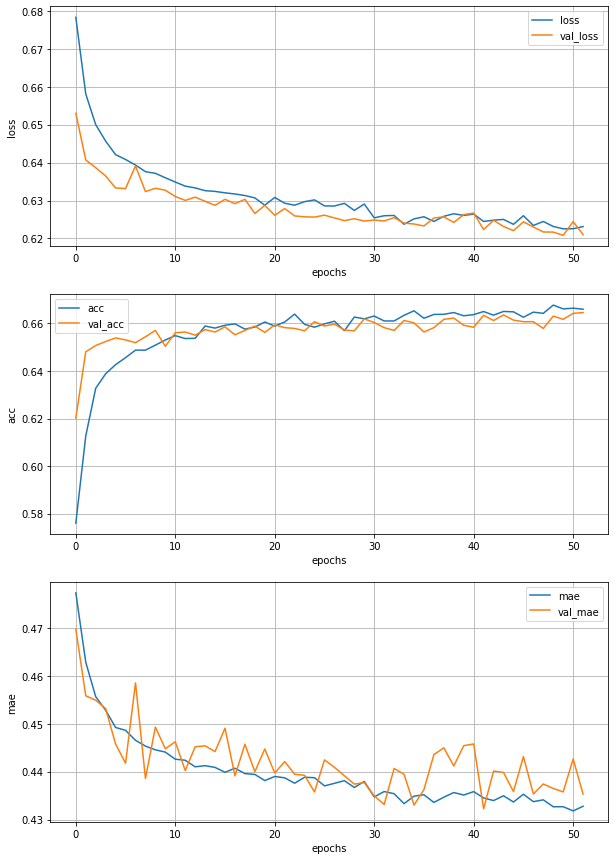

Epoch 53/150
938/938 [==============================] - 4s 5ms/step - loss: 0.6219 - acc: 0.6684 - mae: 0.4319 - val_loss: 0.6250 - val_acc: 0.6602 - val_mae: 0.4424


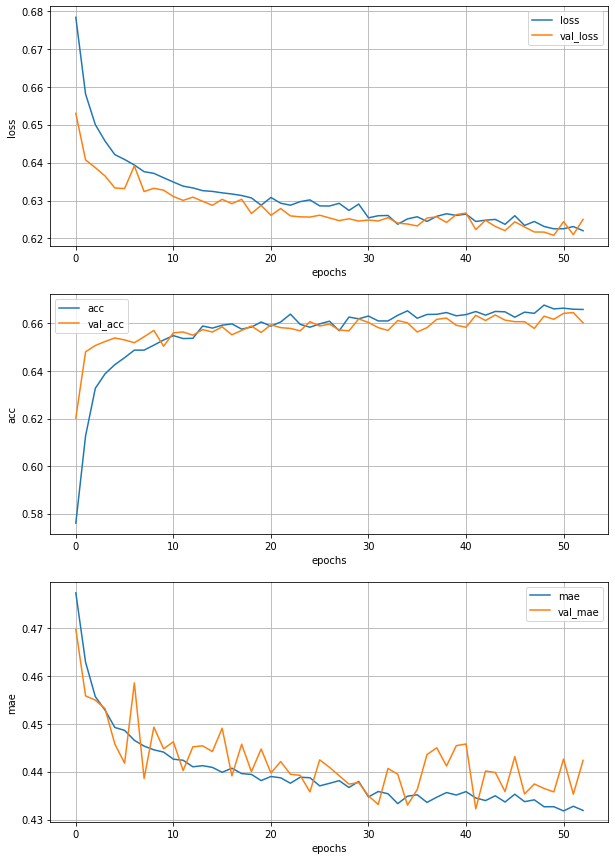

Epoch 54/150
938/938 [==============================] - 4s 5ms/step - loss: 0.6210 - acc: 0.6680 - mae: 0.4316 - val_loss: 0.6216 - val_acc: 0.6617 - val_mae: 0.4380


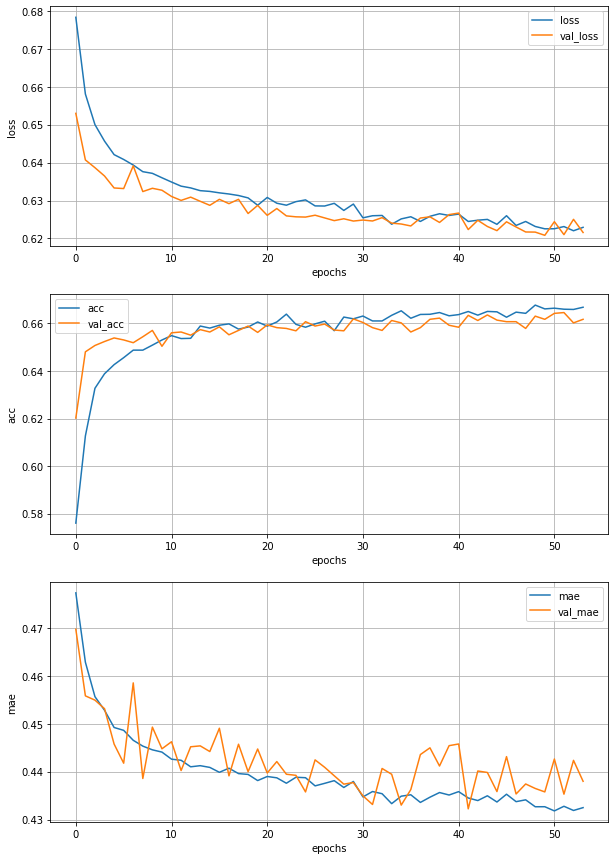

Epoch 55/150
938/938 [==============================] - 4s 5ms/step - loss: 0.6184 - acc: 0.6730 - mae: 0.4290 - val_loss: 0.6212 - val_acc: 0.6616 - val_mae: 0.4361


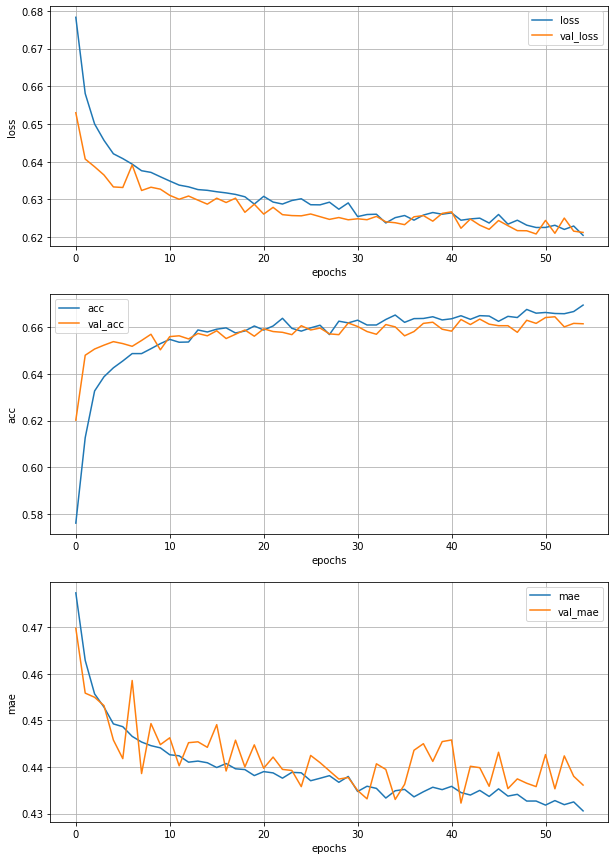

Epoch 56/150
938/938 [==============================] - 4s 5ms/step - loss: 0.6227 - acc: 0.6637 - mae: 0.4322 - val_loss: 0.6206 - val_acc: 0.6631 - val_mae: 0.4308


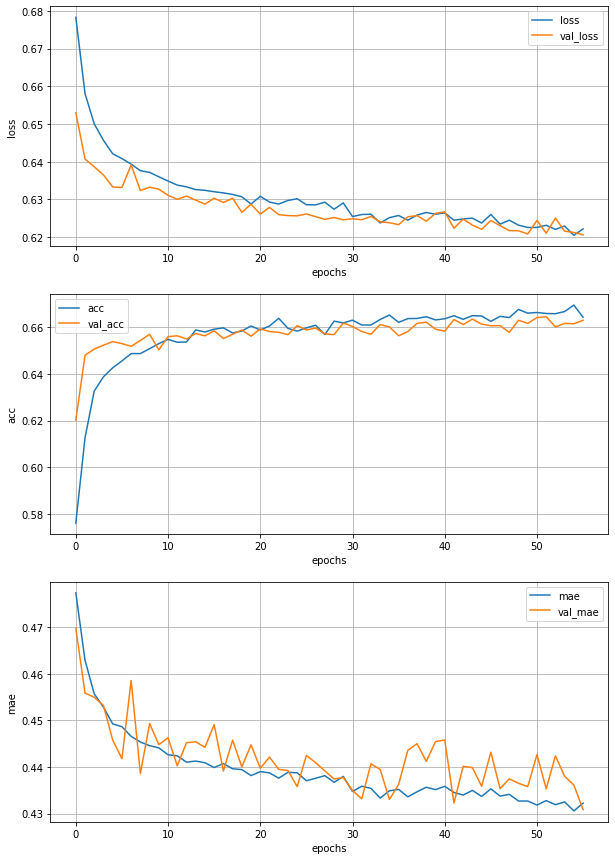

Epoch 57/150
938/938 [==============================] - 4s 5ms/step - loss: 0.6222 - acc: 0.6707 - mae: 0.4303 - val_loss: 0.6210 - val_acc: 0.6646 - val_mae: 0.4366


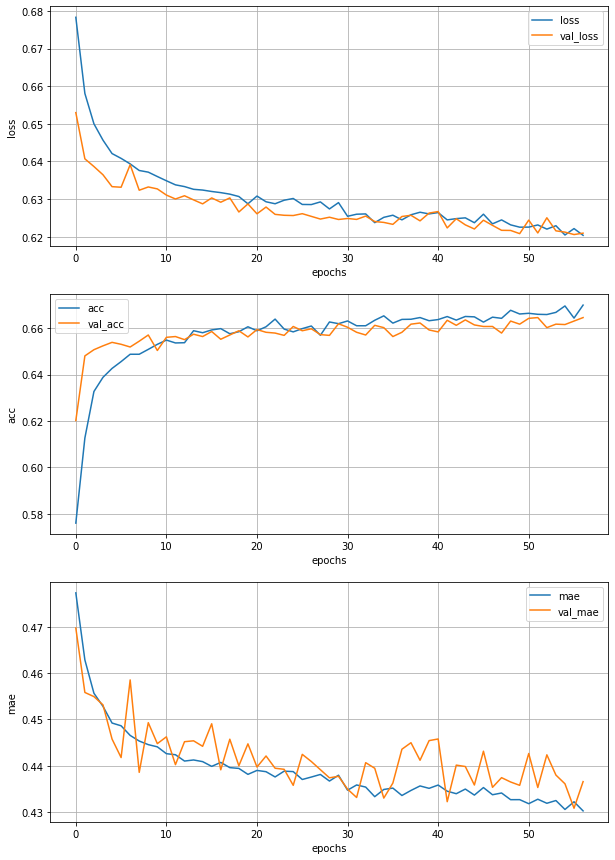

Epoch 58/150
938/938 [==============================] - 4s 5ms/step - loss: 0.6208 - acc: 0.6681 - mae: 0.4313 - val_loss: 0.6206 - val_acc: 0.6627 - val_mae: 0.4370


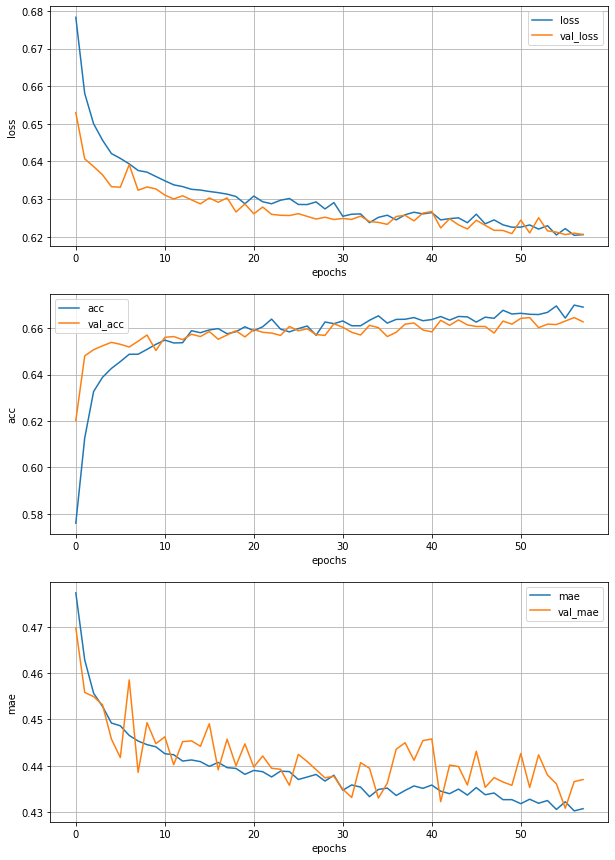

Epoch 59/150
938/938 [==============================] - 4s 5ms/step - loss: 0.6171 - acc: 0.6751 - mae: 0.4277 - val_loss: 0.6230 - val_acc: 0.6637 - val_mae: 0.4385


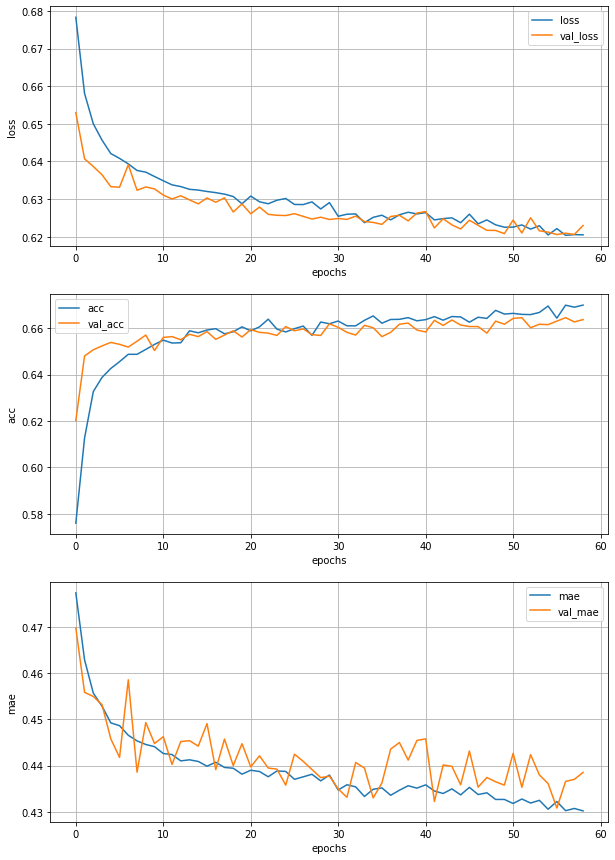

Epoch 60/150
938/938 [==============================] - 4s 5ms/step - loss: 0.6174 - acc: 0.6709 - mae: 0.4279 - val_loss: 0.6204 - val_acc: 0.6639 - val_mae: 0.4335


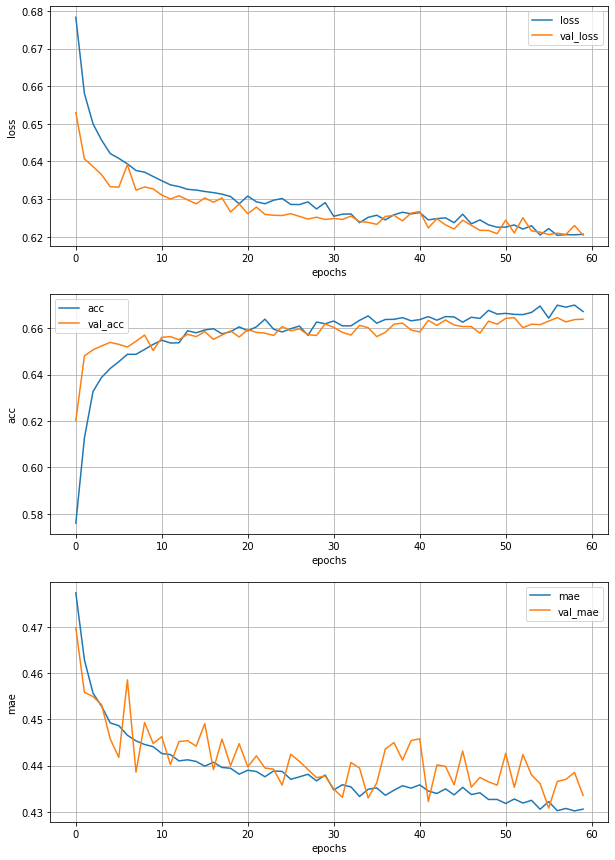

Epoch 61/150
938/938 [==============================] - 4s 5ms/step - loss: 0.6234 - acc: 0.6689 - mae: 0.4327 - val_loss: 0.6204 - val_acc: 0.6636 - val_mae: 0.4360


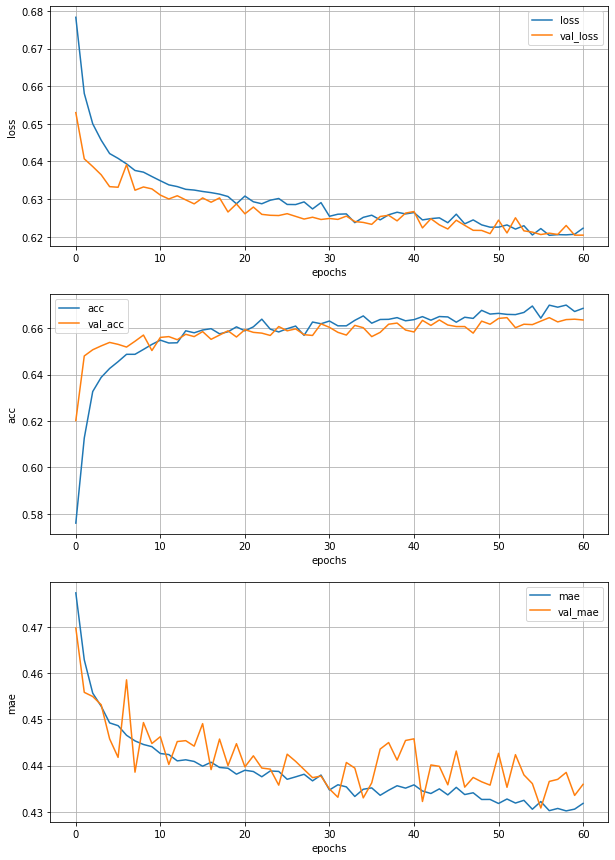

Epoch 62/150
938/938 [==============================] - 4s 5ms/step - loss: 0.6203 - acc: 0.6699 - mae: 0.4300 - val_loss: 0.6217 - val_acc: 0.6622 - val_mae: 0.4399


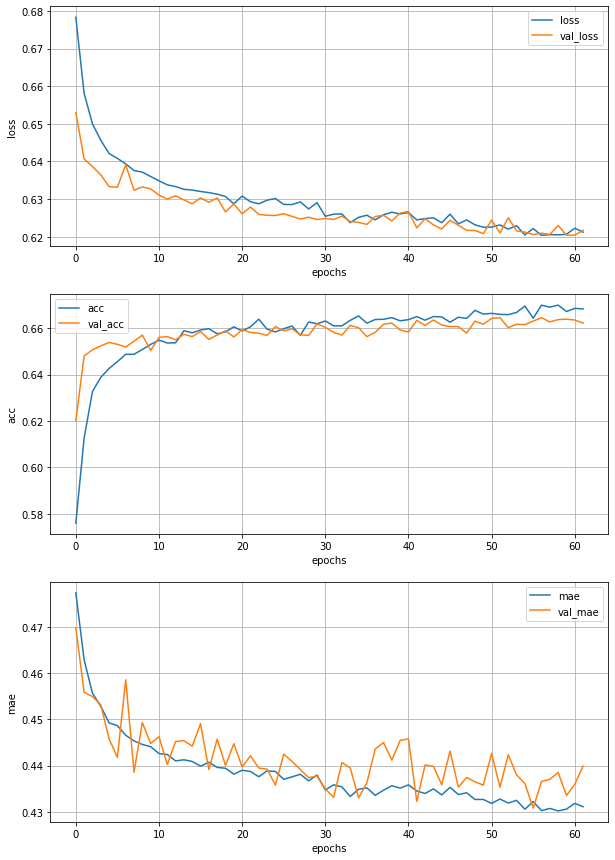

Epoch 63/150
938/938 [==============================] - 4s 5ms/step - loss: 0.6231 - acc: 0.6694 - mae: 0.4333 - val_loss: 0.6206 - val_acc: 0.6614 - val_mae: 0.4383


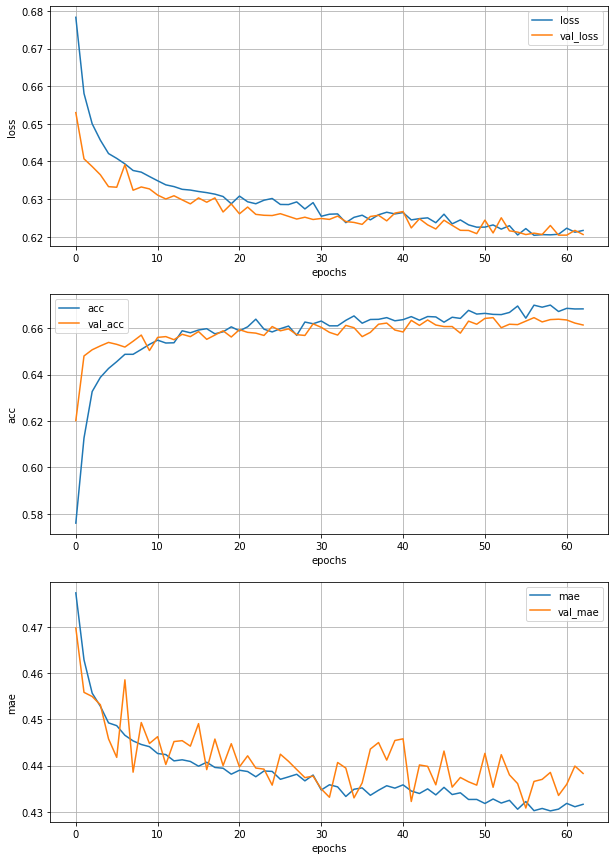

Epoch 64/150
938/938 [==============================] - 4s 5ms/step - loss: 0.6185 - acc: 0.6725 - mae: 0.4303 - val_loss: 0.6238 - val_acc: 0.6642 - val_mae: 0.4456


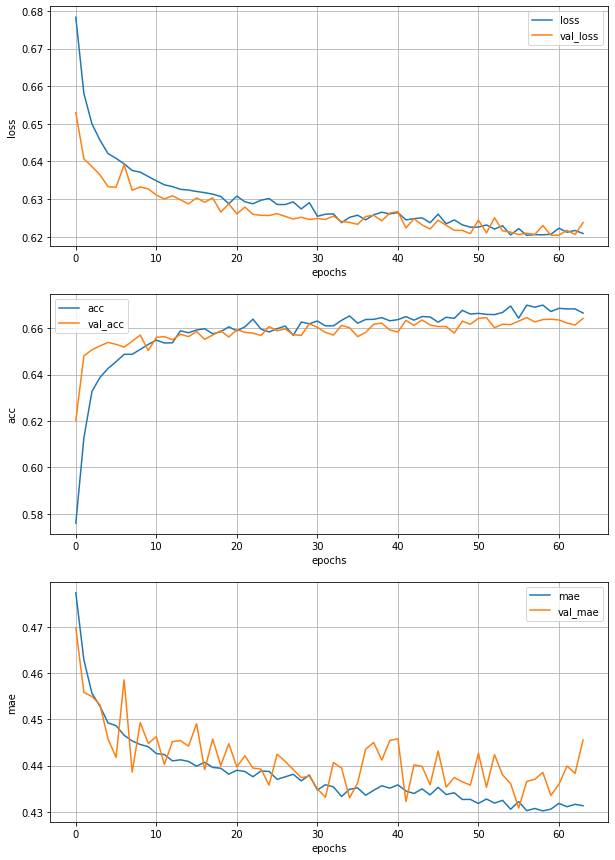

Epoch 65/150
938/938 [==============================] - 4s 5ms/step - loss: 0.6187 - acc: 0.6714 - mae: 0.4306 - val_loss: 0.6223 - val_acc: 0.6639 - val_mae: 0.4407


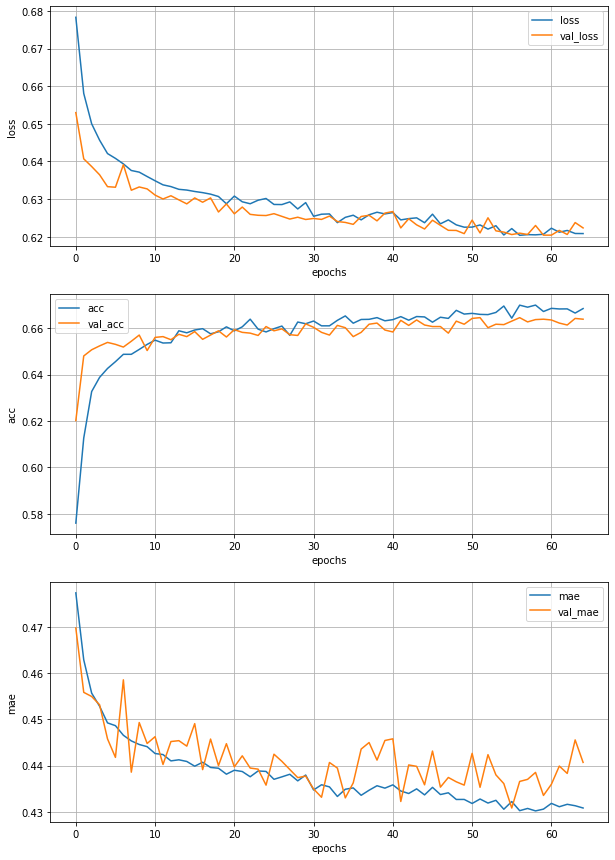

Epoch 66/150
938/938 [==============================] - 4s 5ms/step - loss: 0.6185 - acc: 0.6688 - mae: 0.4288 - val_loss: 0.6221 - val_acc: 0.6631 - val_mae: 0.4327


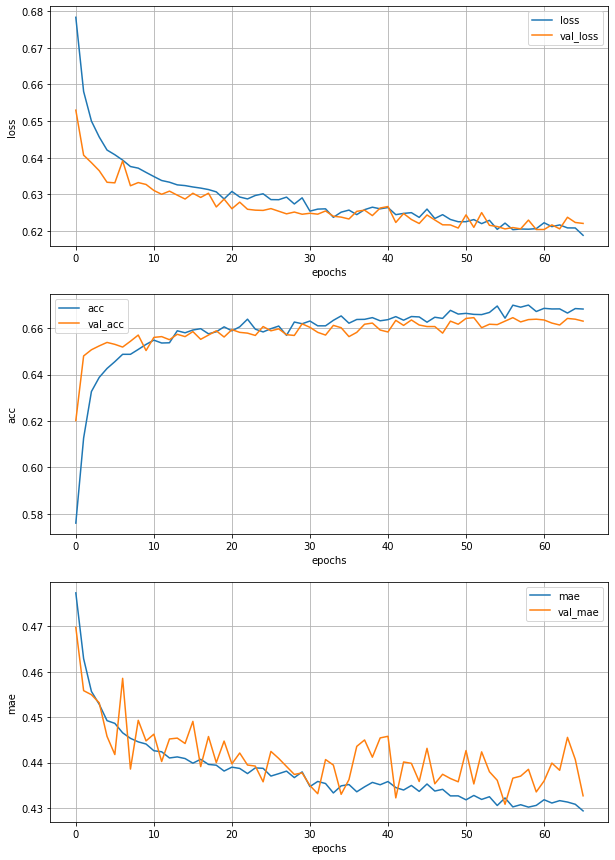

Epoch 67/150
938/938 [==============================] - 4s 4ms/step - loss: 0.6157 - acc: 0.6724 - mae: 0.4260 - val_loss: 0.6206 - val_acc: 0.6619 - val_mae: 0.4373


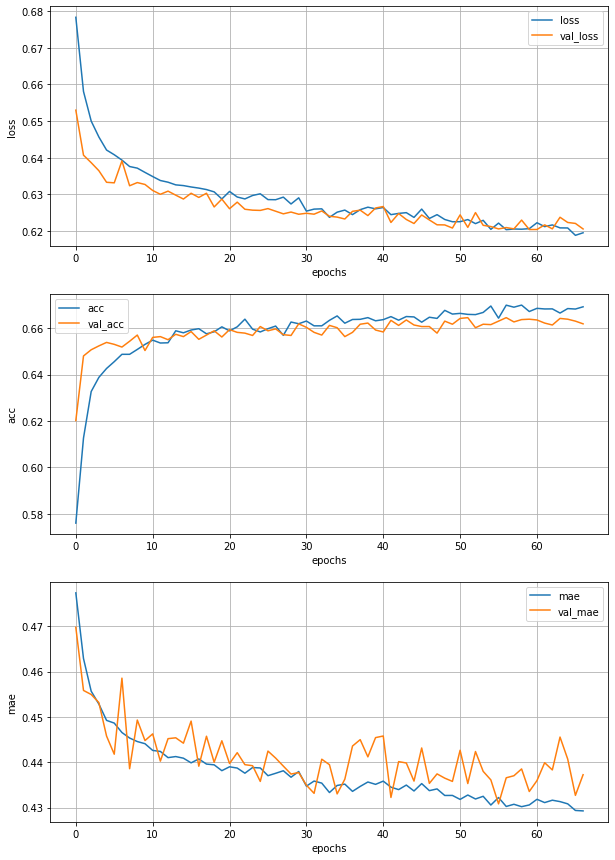

Epoch 68/150
938/938 [==============================] - 4s 4ms/step - loss: 0.6219 - acc: 0.6672 - mae: 0.4321 - val_loss: 0.6213 - val_acc: 0.6622 - val_mae: 0.4378


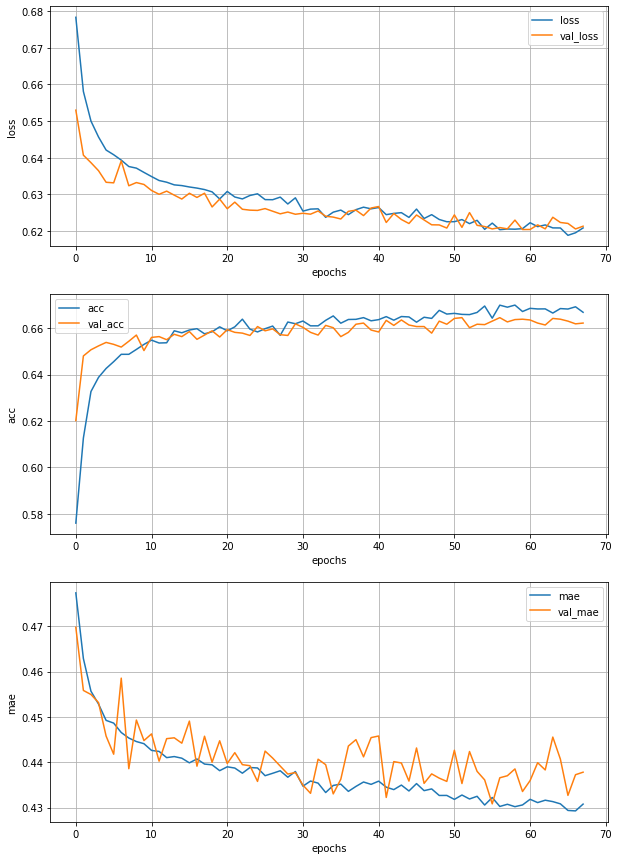

Epoch 69/150
938/938 [==============================] - 4s 5ms/step - loss: 0.6189 - acc: 0.6700 - mae: 0.4301 - val_loss: 0.6193 - val_acc: 0.6602 - val_mae: 0.4352


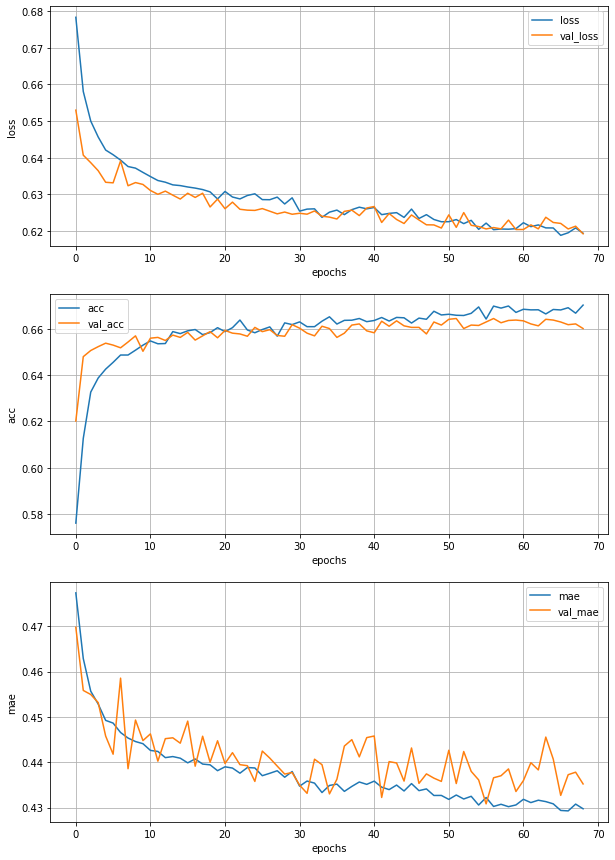

Epoch 70/150
938/938 [==============================] - 4s 5ms/step - loss: 0.6185 - acc: 0.6660 - mae: 0.4289 - val_loss: 0.6196 - val_acc: 0.6632 - val_mae: 0.4334


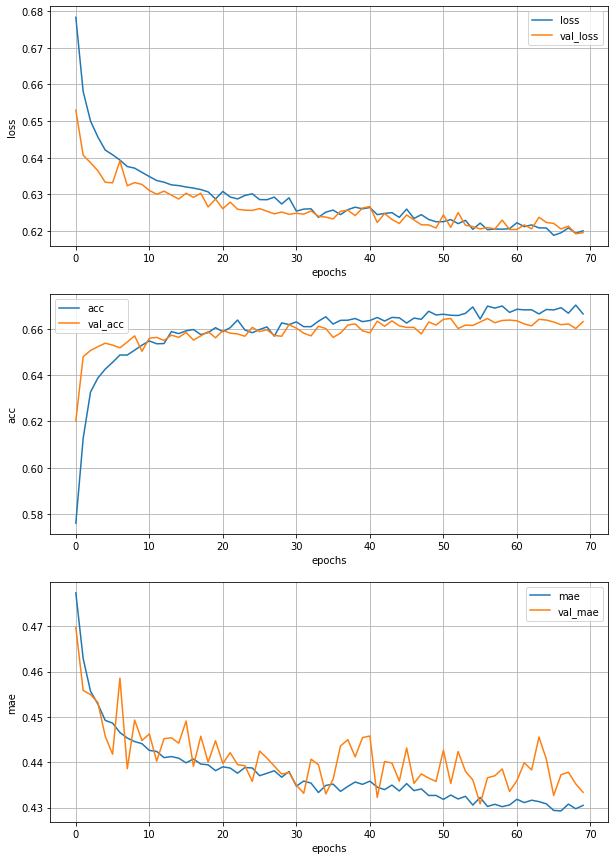

Epoch 71/150
938/938 [==============================] - 4s 5ms/step - loss: 0.6168 - acc: 0.6748 - mae: 0.4275 - val_loss: 0.6182 - val_acc: 0.6641 - val_mae: 0.4303


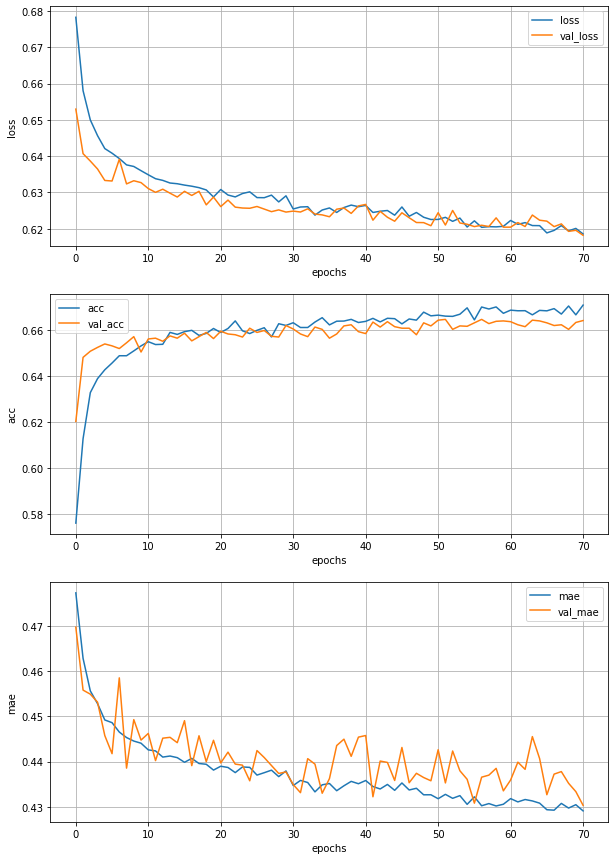

Epoch 72/150
938/938 [==============================] - 4s 5ms/step - loss: 0.6208 - acc: 0.6683 - mae: 0.4299 - val_loss: 0.6174 - val_acc: 0.6656 - val_mae: 0.4278


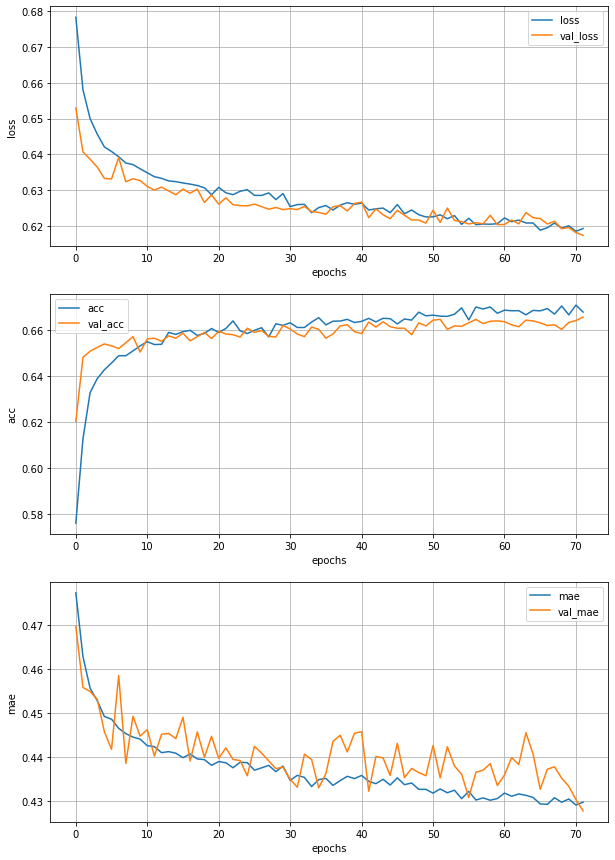

Epoch 73/150
938/938 [==============================] - 4s 5ms/step - loss: 0.6227 - acc: 0.6669 - mae: 0.4308 - val_loss: 0.6205 - val_acc: 0.6636 - val_mae: 0.4392


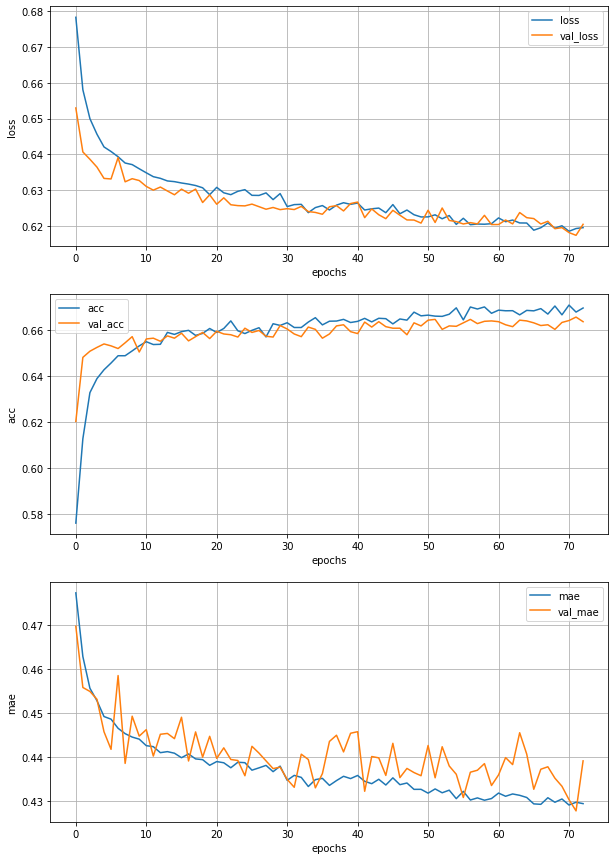

Epoch 74/150
938/938 [==============================] - 4s 5ms/step - loss: 0.6216 - acc: 0.6659 - mae: 0.4316 - val_loss: 0.6214 - val_acc: 0.6626 - val_mae: 0.4402


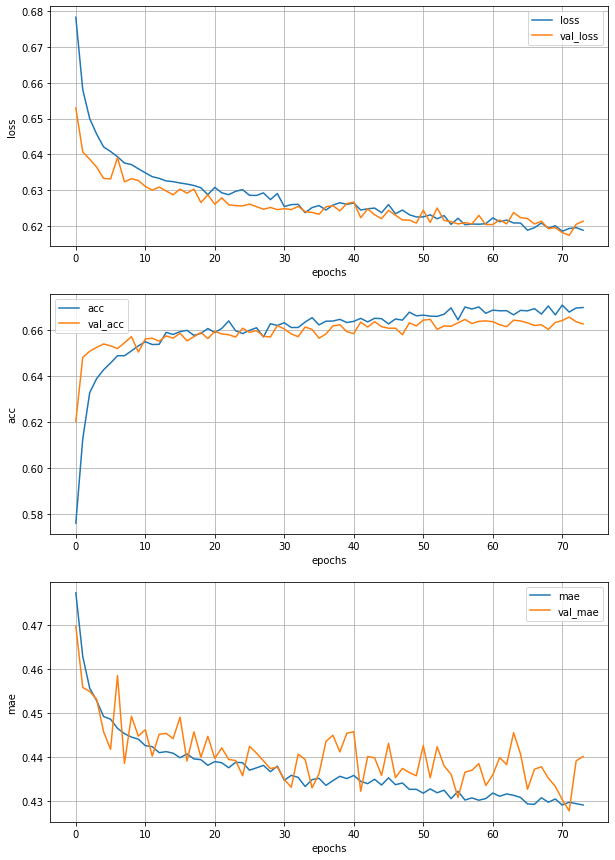

Epoch 75/150
938/938 [==============================] - 4s 5ms/step - loss: 0.6152 - acc: 0.6742 - mae: 0.4279 - val_loss: 0.6177 - val_acc: 0.6639 - val_mae: 0.4309


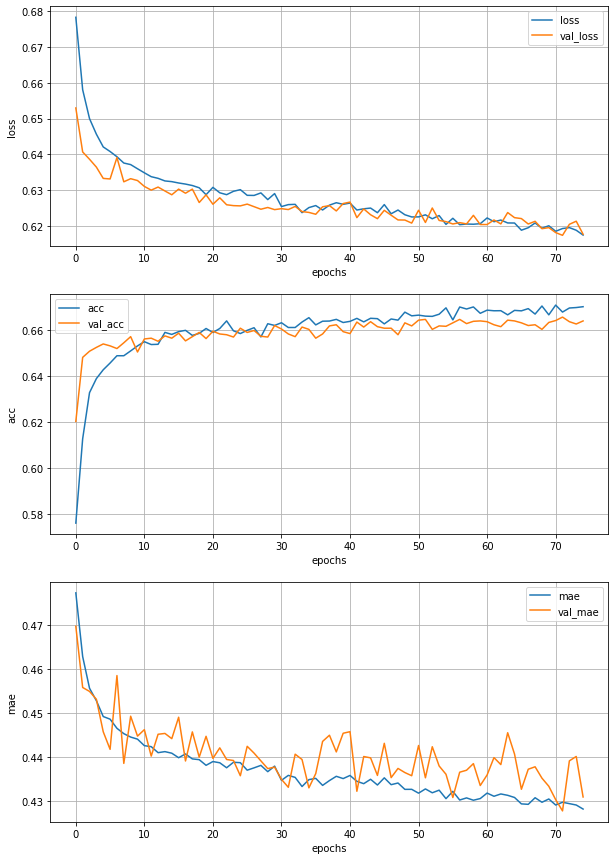

Epoch 76/150
938/938 [==============================] - 4s 5ms/step - loss: 0.6181 - acc: 0.6729 - mae: 0.4285 - val_loss: 0.6193 - val_acc: 0.6647 - val_mae: 0.4394


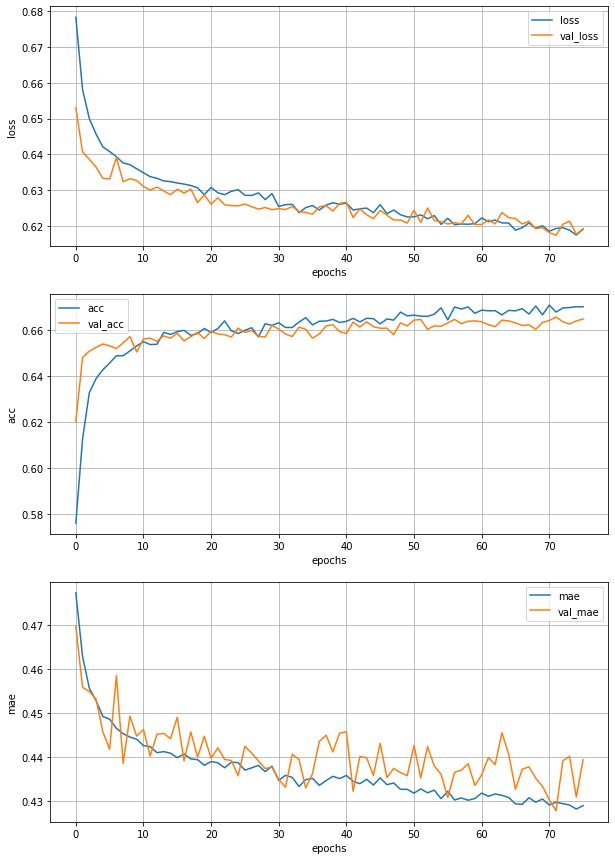

Epoch 77/150
938/938 [==============================] - 4s 5ms/step - loss: 0.6163 - acc: 0.6690 - mae: 0.4281 - val_loss: 0.6182 - val_acc: 0.6649 - val_mae: 0.4312


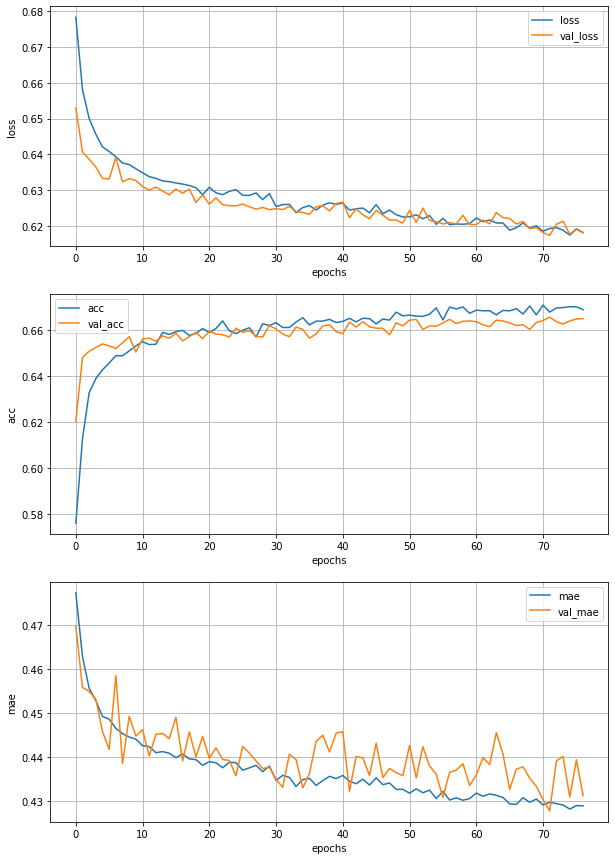

Epoch 78/150
938/938 [==============================] - 4s 5ms/step - loss: 0.6161 - acc: 0.6673 - mae: 0.4267 - val_loss: 0.6205 - val_acc: 0.6636 - val_mae: 0.4320


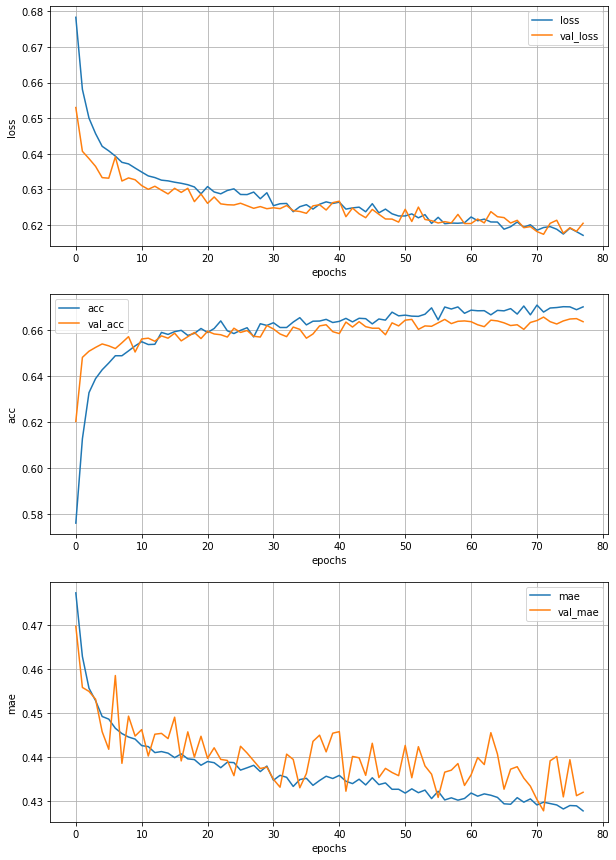

Epoch 79/150
938/938 [==============================] - 4s 4ms/step - loss: 0.6177 - acc: 0.6719 - mae: 0.4266 - val_loss: 0.6197 - val_acc: 0.6687 - val_mae: 0.4377


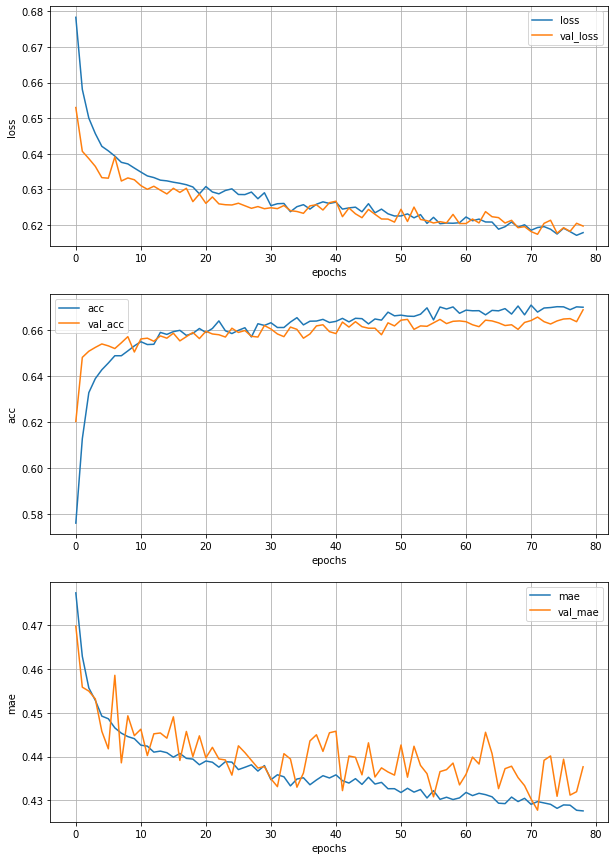

Epoch 80/150
938/938 [==============================] - 4s 5ms/step - loss: 0.6213 - acc: 0.6692 - mae: 0.4310 - val_loss: 0.6187 - val_acc: 0.6644 - val_mae: 0.4306


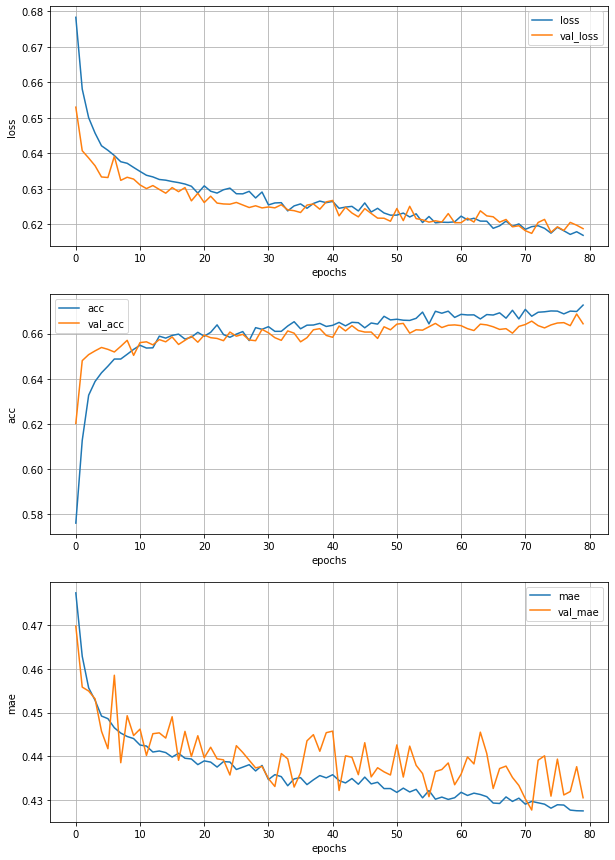

Epoch 81/150
938/938 [==============================] - 4s 5ms/step - loss: 0.6167 - acc: 0.6671 - mae: 0.4275 - val_loss: 0.6174 - val_acc: 0.6661 - val_mae: 0.4298


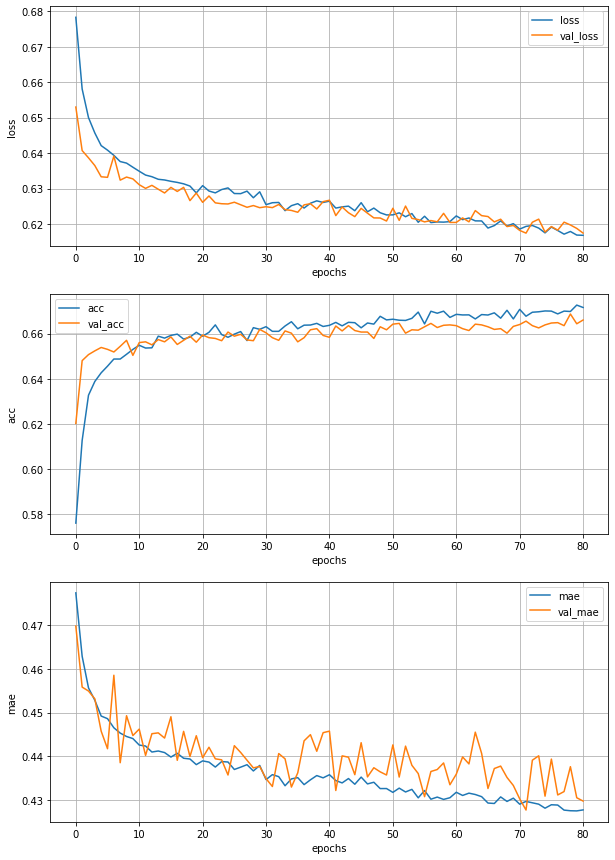

Epoch 82/150
938/938 [==============================] - 4s 4ms/step - loss: 0.6162 - acc: 0.6744 - mae: 0.4262 - val_loss: 0.6180 - val_acc: 0.6639 - val_mae: 0.4318


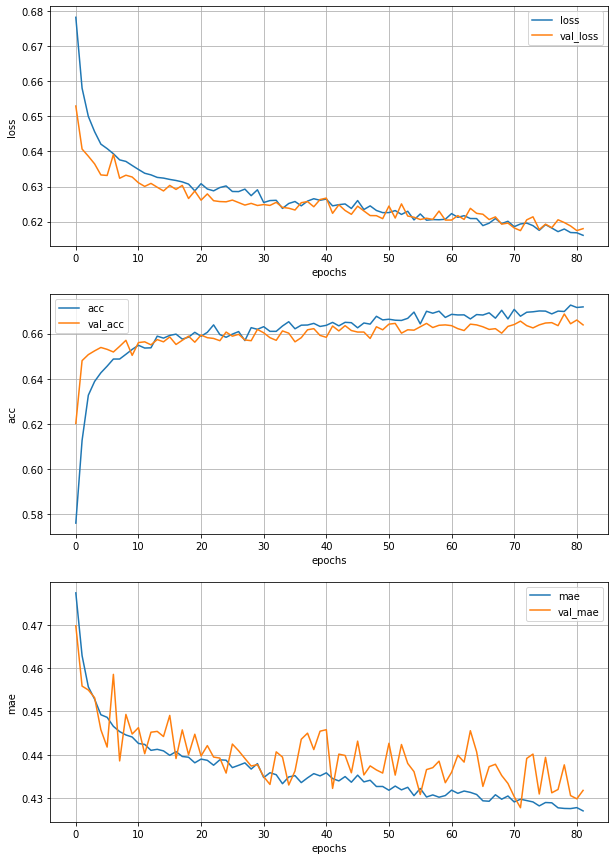

Epoch 83/150
938/938 [==============================] - 4s 5ms/step - loss: 0.6170 - acc: 0.6722 - mae: 0.4273 - val_loss: 0.6184 - val_acc: 0.6609 - val_mae: 0.4310


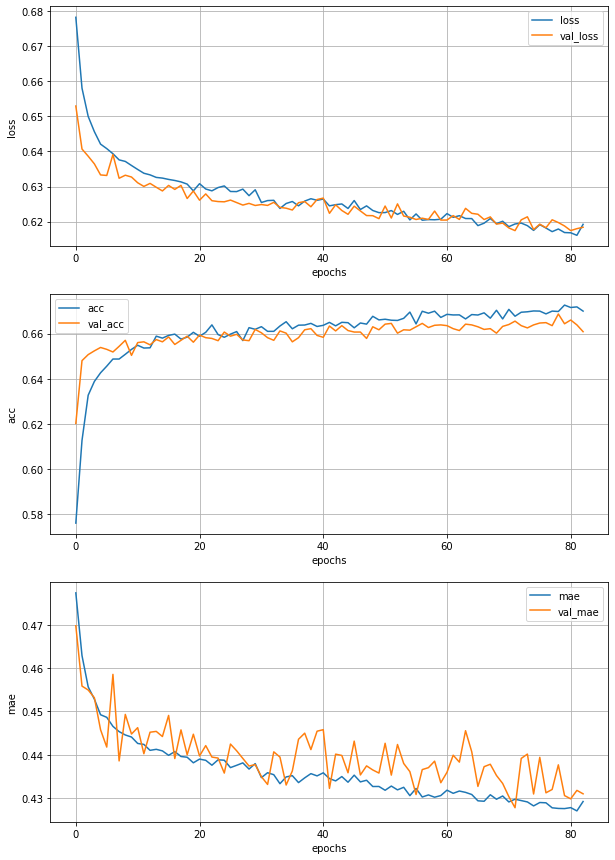

Epoch 84/150
938/938 [==============================] - 4s 4ms/step - loss: 0.6161 - acc: 0.6723 - mae: 0.4268 - val_loss: 0.6182 - val_acc: 0.6646 - val_mae: 0.4300


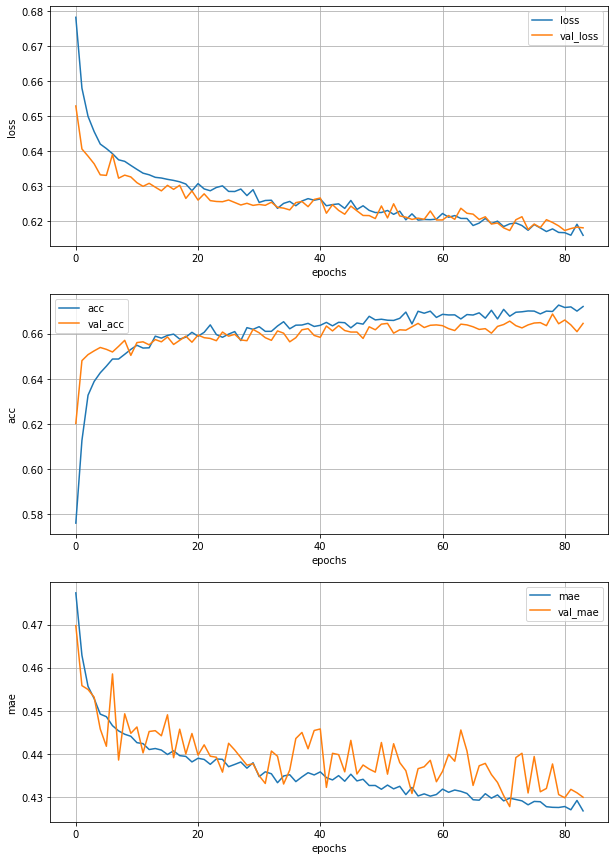

Epoch 85/150
938/938 [==============================] - 4s 5ms/step - loss: 0.6224 - acc: 0.6644 - mae: 0.4314 - val_loss: 0.6174 - val_acc: 0.6651 - val_mae: 0.4328


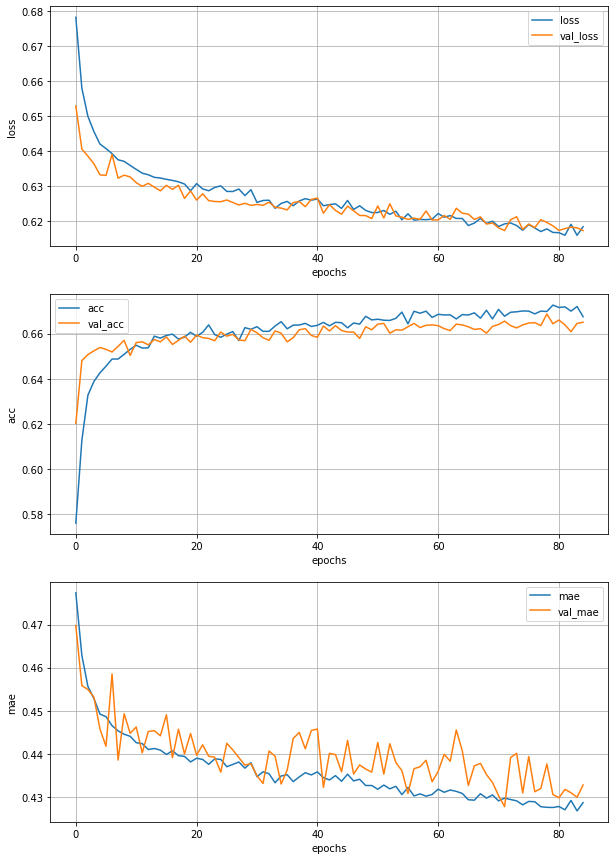

Epoch 86/150
938/938 [==============================] - 4s 5ms/step - loss: 0.6161 - acc: 0.6693 - mae: 0.4280 - val_loss: 0.6196 - val_acc: 0.6626 - val_mae: 0.4331


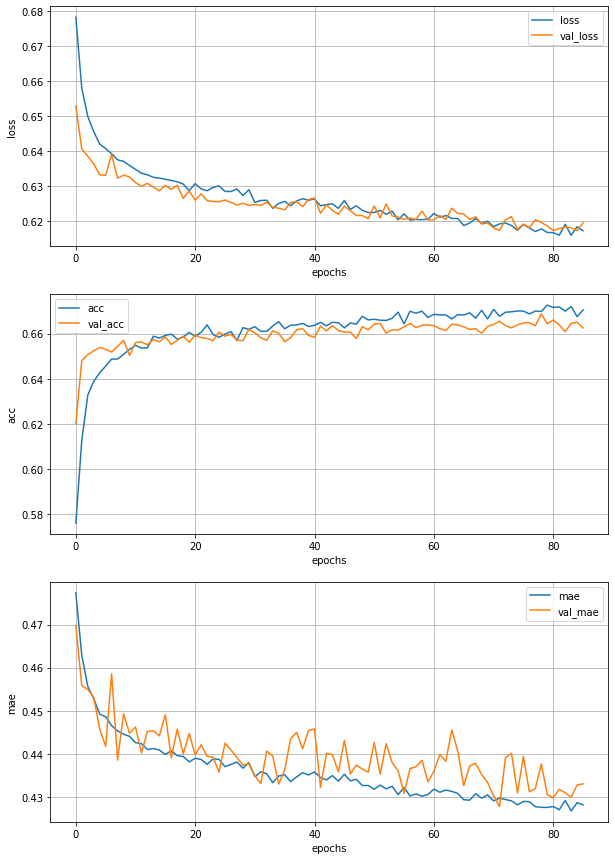

Epoch 87/150
938/938 [==============================] - 4s 5ms/step - loss: 0.6121 - acc: 0.6789 - mae: 0.4234 - val_loss: 0.6187 - val_acc: 0.6644 - val_mae: 0.4336


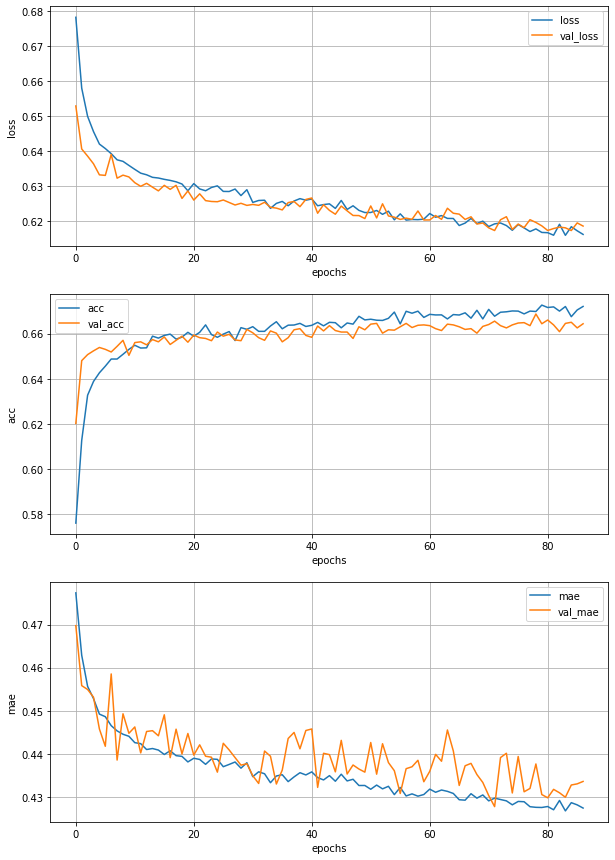

Epoch 88/150
938/938 [==============================] - 4s 5ms/step - loss: 0.6114 - acc: 0.6752 - mae: 0.4230 - val_loss: 0.6196 - val_acc: 0.6686 - val_mae: 0.4409


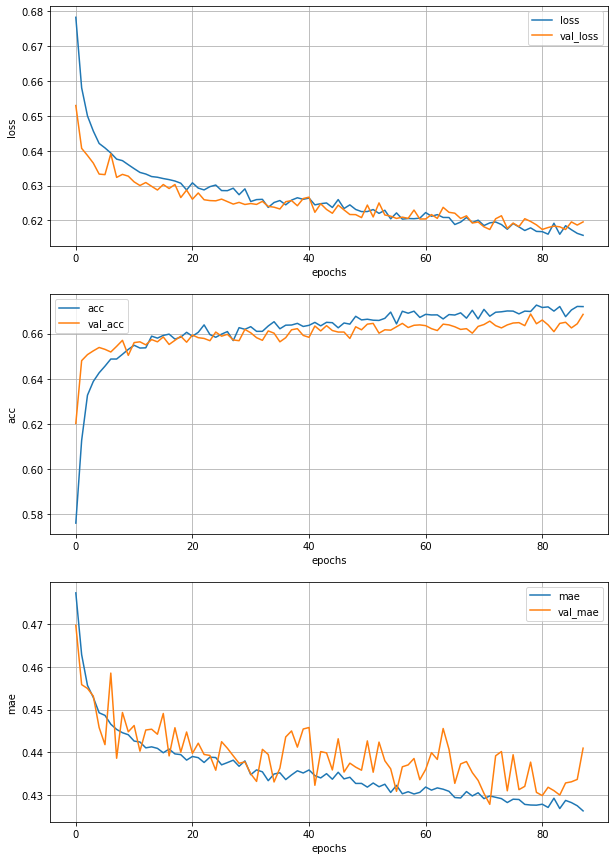

Epoch 89/150
938/938 [==============================] - 4s 4ms/step - loss: 0.6158 - acc: 0.6701 - mae: 0.4280 - val_loss: 0.6174 - val_acc: 0.6664 - val_mae: 0.4332


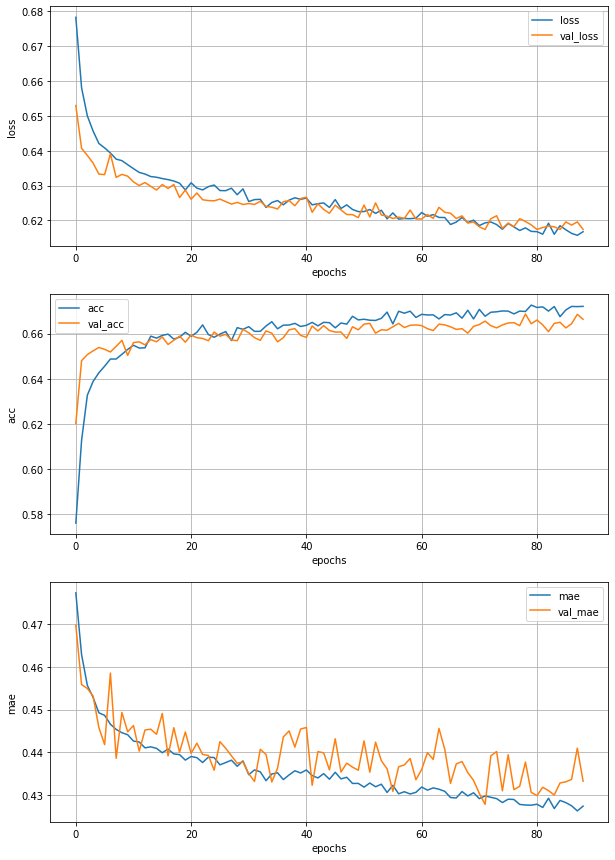

Epoch 90/150
938/938 [==============================] - 4s 5ms/step - loss: 0.6173 - acc: 0.6690 - mae: 0.4274 - val_loss: 0.6196 - val_acc: 0.6631 - val_mae: 0.4370


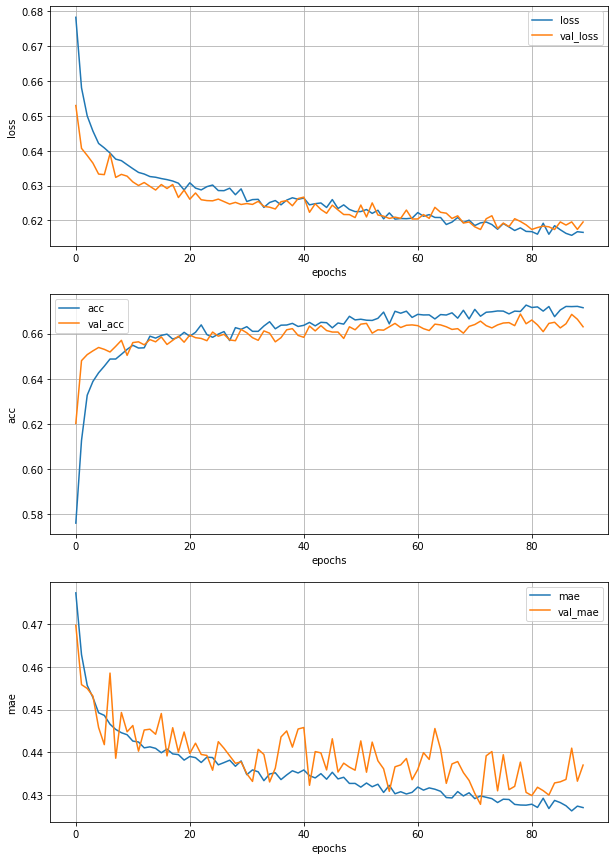

Epoch 91/150
938/938 [==============================] - 4s 4ms/step - loss: 0.6154 - acc: 0.6717 - mae: 0.4274 - val_loss: 0.6185 - val_acc: 0.6644 - val_mae: 0.4334


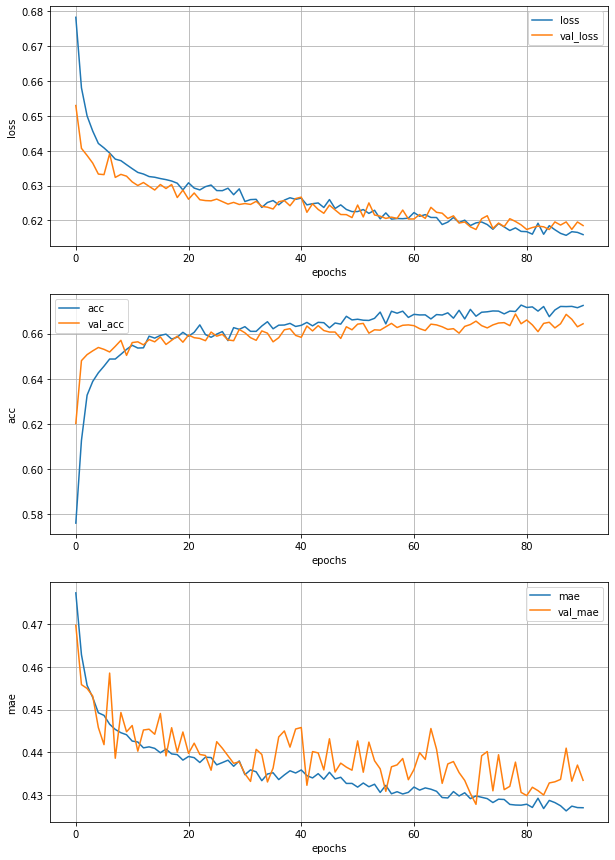

Epoch 92/150
938/938 [==============================] - 4s 4ms/step - loss: 0.6115 - acc: 0.6771 - mae: 0.4240 - val_loss: 0.6185 - val_acc: 0.6646 - val_mae: 0.4370


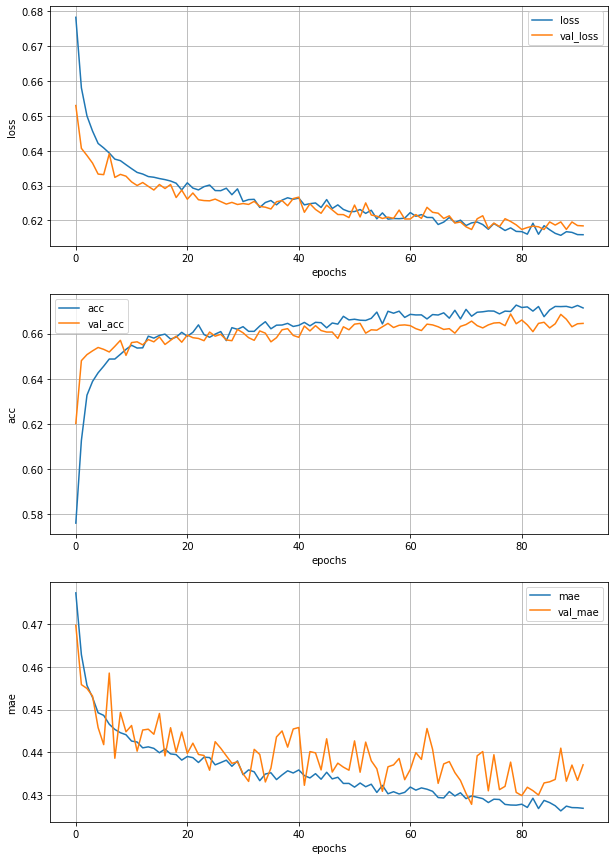

Epoch 93/150
938/938 [==============================] - 4s 5ms/step - loss: 0.6140 - acc: 0.6748 - mae: 0.4254 - val_loss: 0.6168 - val_acc: 0.6651 - val_mae: 0.4258


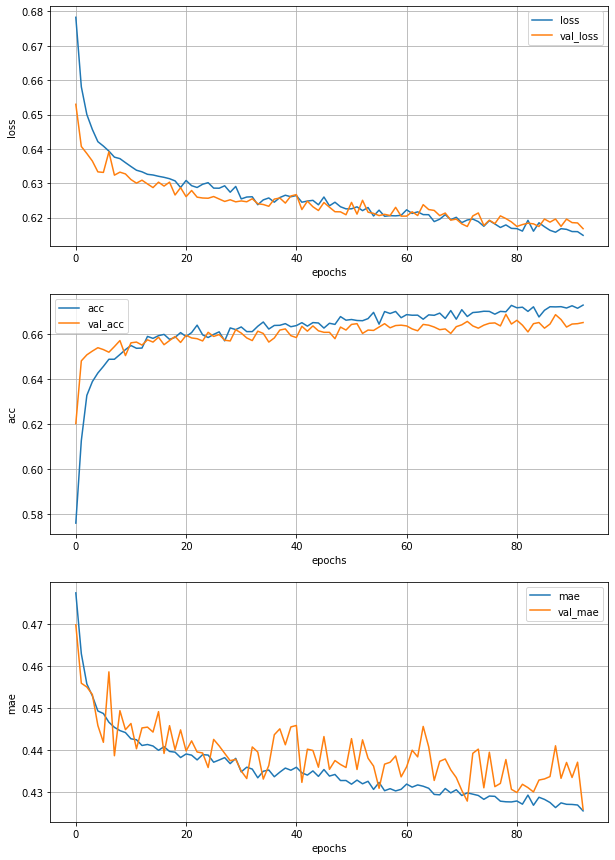

Epoch 94/150
938/938 [==============================] - 4s 4ms/step - loss: 0.6169 - acc: 0.6708 - mae: 0.4269 - val_loss: 0.6177 - val_acc: 0.6629 - val_mae: 0.4336


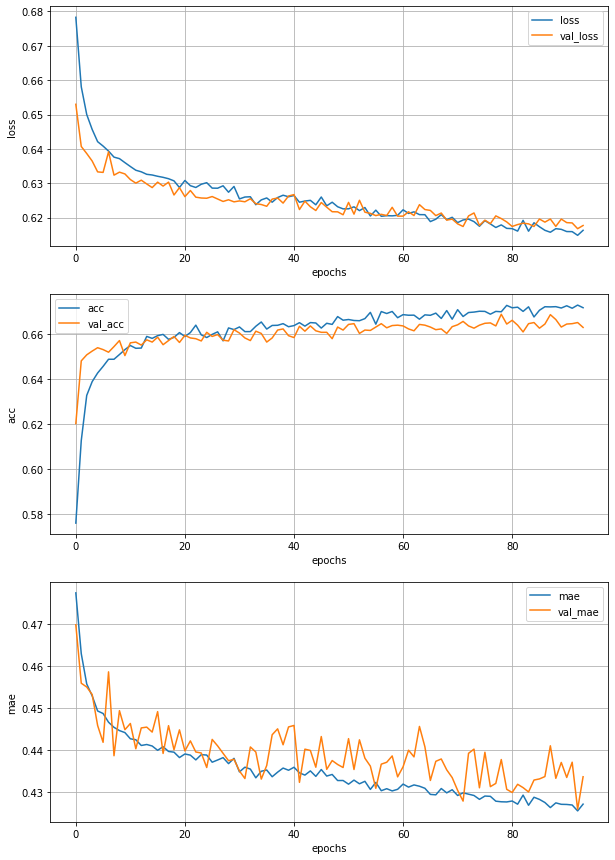

Epoch 95/150
938/938 [==============================] - 4s 4ms/step - loss: 0.6110 - acc: 0.6777 - mae: 0.4232 - val_loss: 0.6180 - val_acc: 0.6627 - val_mae: 0.4287


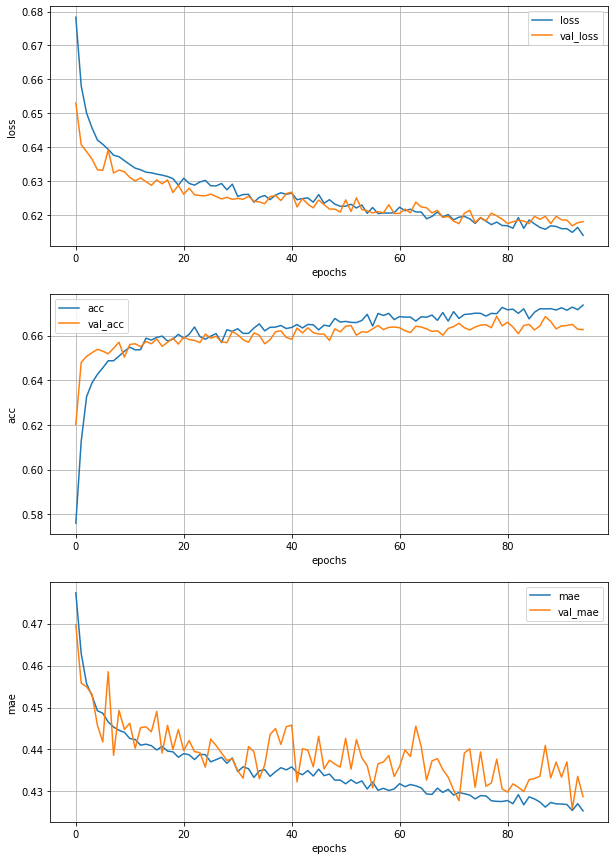

Epoch 96/150
938/938 [==============================] - 4s 5ms/step - loss: 0.6173 - acc: 0.6697 - mae: 0.4269 - val_loss: 0.6173 - val_acc: 0.6679 - val_mae: 0.4358


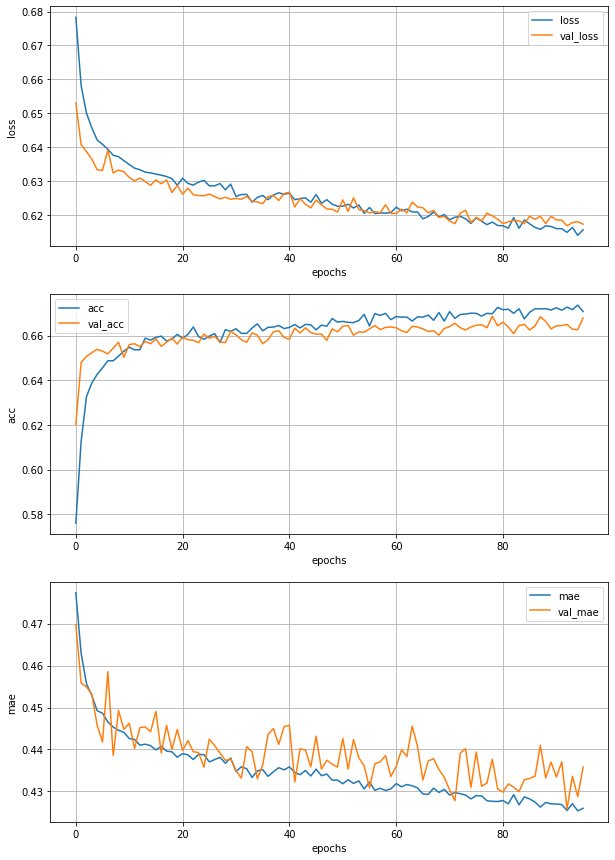

Epoch 97/150
938/938 [==============================] - 4s 4ms/step - loss: 0.6156 - acc: 0.6739 - mae: 0.4264 - val_loss: 0.6167 - val_acc: 0.6674 - val_mae: 0.4335


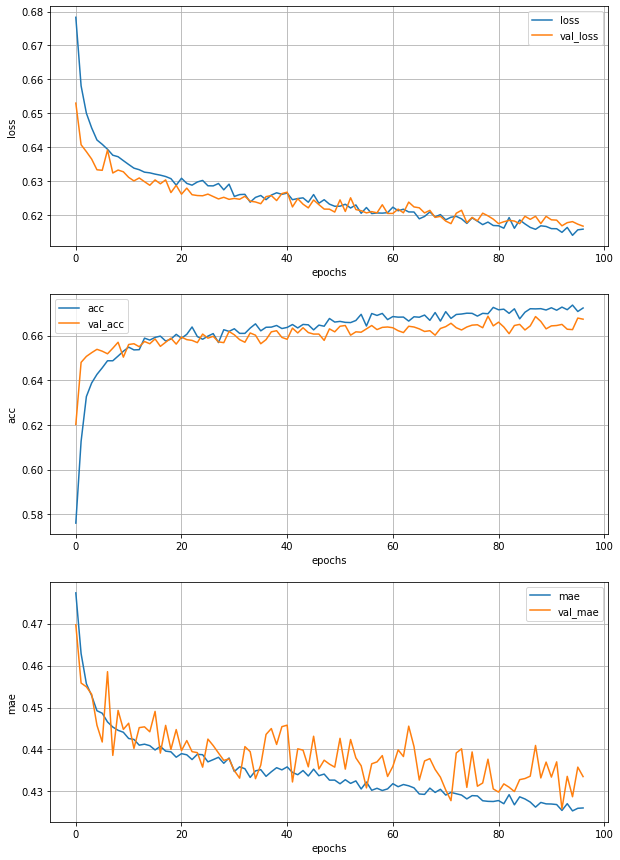

Epoch 98/150
938/938 [==============================] - 4s 5ms/step - loss: 0.6160 - acc: 0.6714 - mae: 0.4274 - val_loss: 0.6167 - val_acc: 0.6676 - val_mae: 0.4343


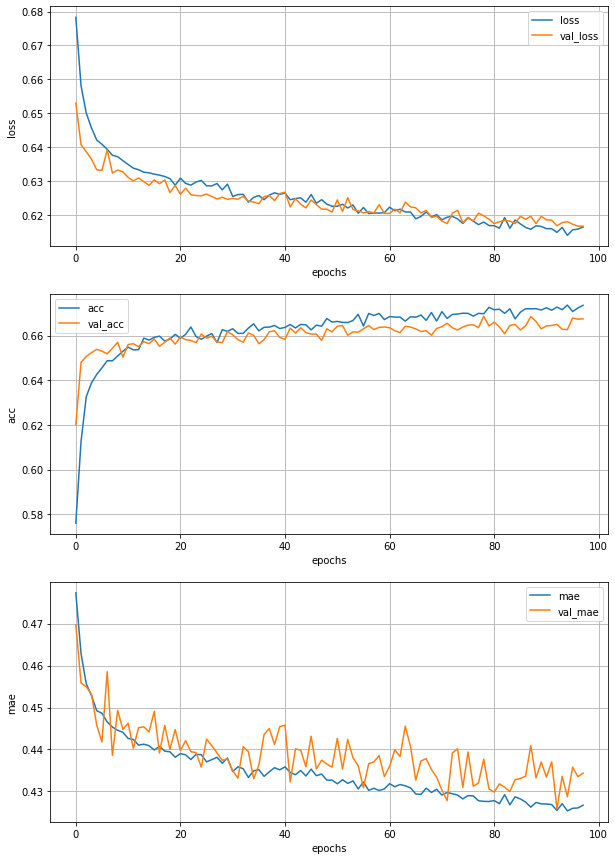

Epoch 99/150
938/938 [==============================] - 4s 5ms/step - loss: 0.6152 - acc: 0.6669 - mae: 0.4264 - val_loss: 0.6177 - val_acc: 0.6661 - val_mae: 0.4369


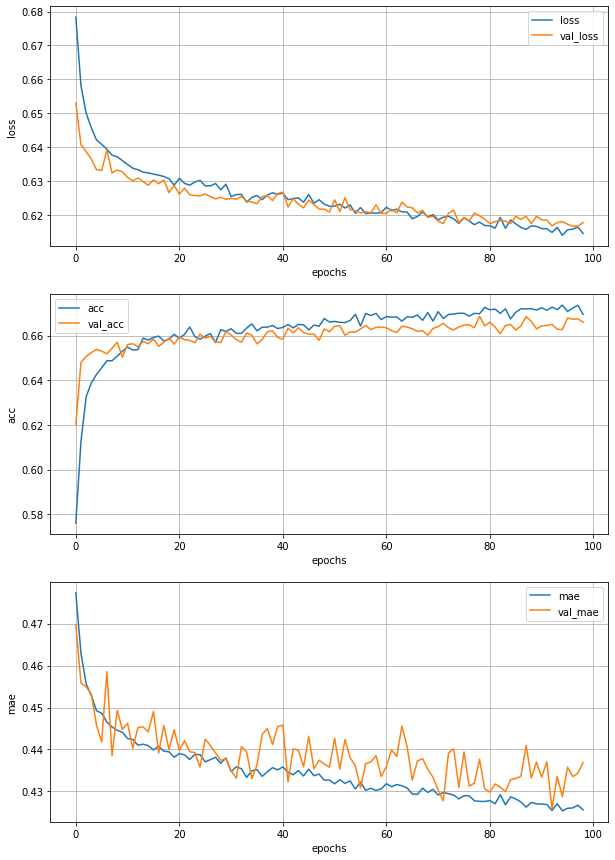

Epoch 100/150
938/938 [==============================] - 4s 5ms/step - loss: 0.6186 - acc: 0.6713 - mae: 0.4293 - val_loss: 0.6165 - val_acc: 0.6676 - val_mae: 0.4304


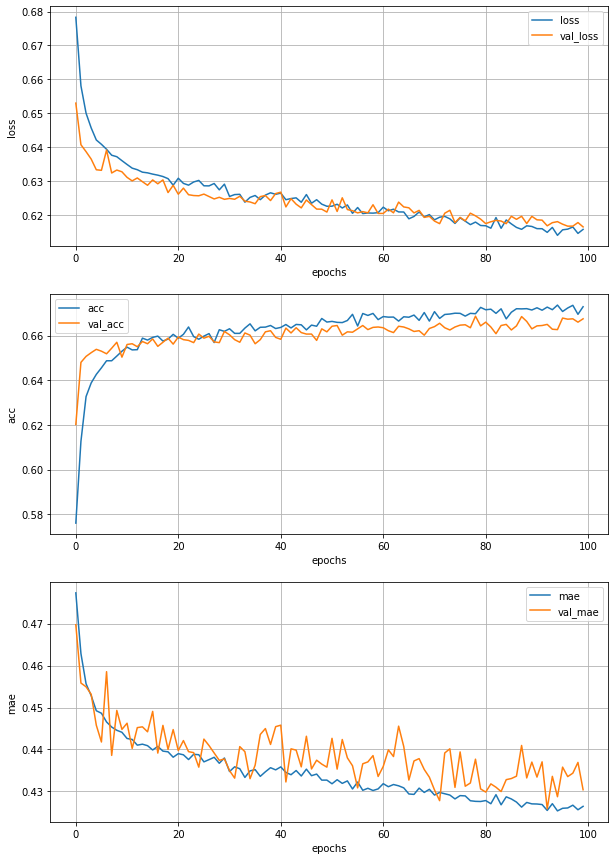

Epoch 101/150
938/938 [==============================] - 4s 4ms/step - loss: 0.6158 - acc: 0.6736 - mae: 0.4258 - val_loss: 0.6171 - val_acc: 0.6631 - val_mae: 0.4239


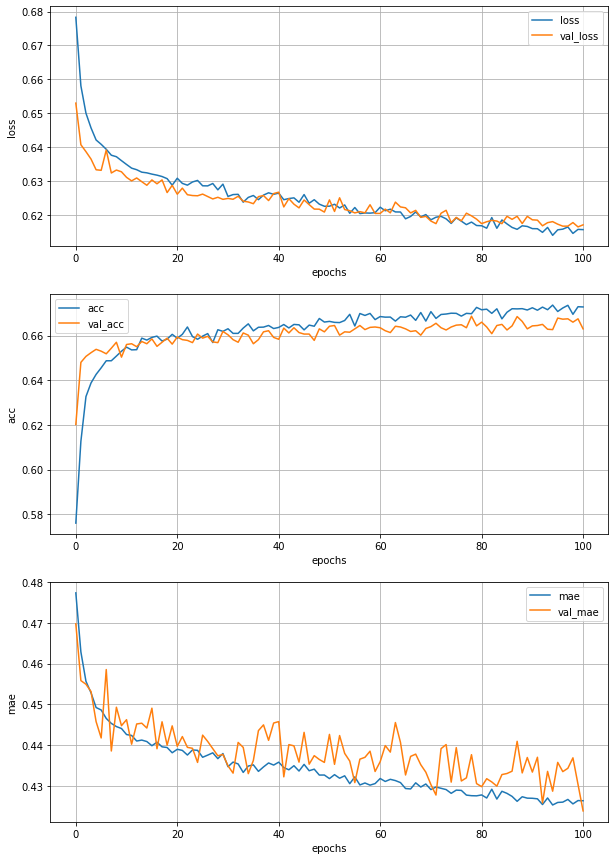

Epoch 102/150
938/938 [==============================] - 4s 4ms/step - loss: 0.6151 - acc: 0.6721 - mae: 0.4248 - val_loss: 0.6176 - val_acc: 0.6667 - val_mae: 0.4342


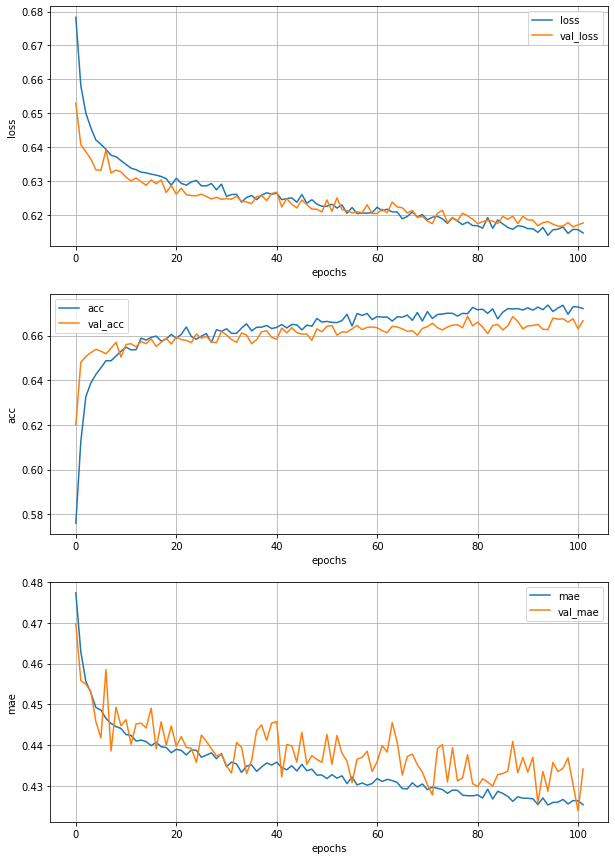

Epoch 103/150
938/938 [==============================] - 4s 5ms/step - loss: 0.6156 - acc: 0.6740 - mae: 0.4265 - val_loss: 0.6171 - val_acc: 0.6664 - val_mae: 0.4346


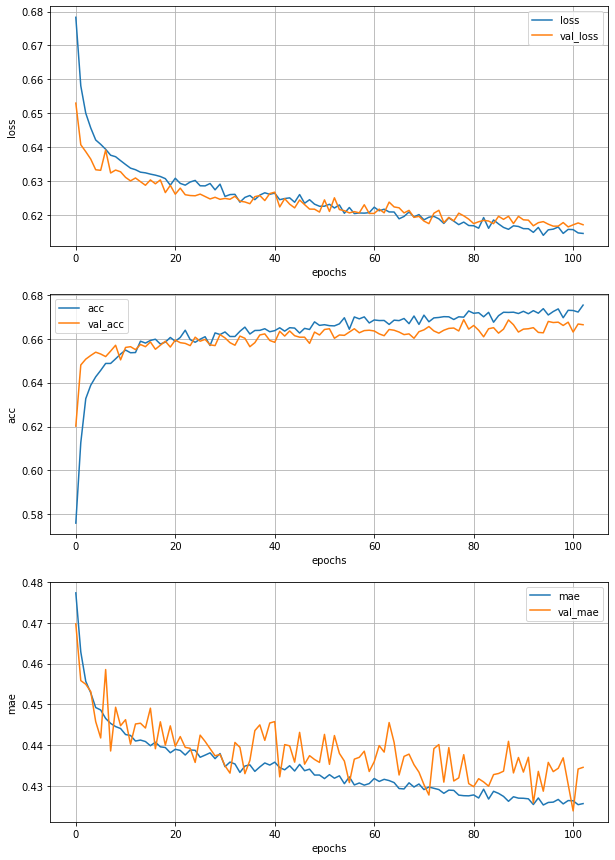

Epoch 104/150
938/938 [==============================] - 4s 5ms/step - loss: 0.6197 - acc: 0.6710 - mae: 0.4303 - val_loss: 0.6155 - val_acc: 0.6669 - val_mae: 0.4258


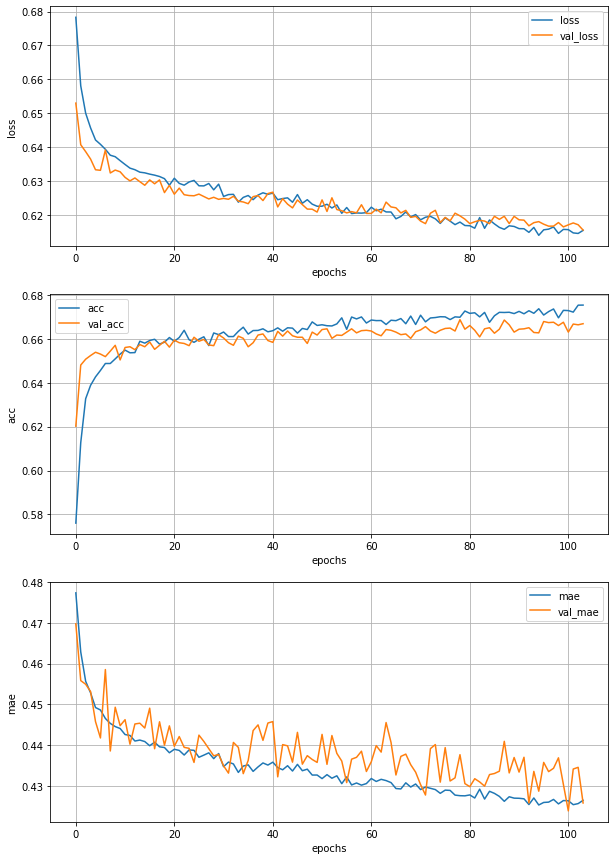

Epoch 105/150
938/938 [==============================] - 4s 4ms/step - loss: 0.6130 - acc: 0.6769 - mae: 0.4240 - val_loss: 0.6162 - val_acc: 0.6662 - val_mae: 0.4330


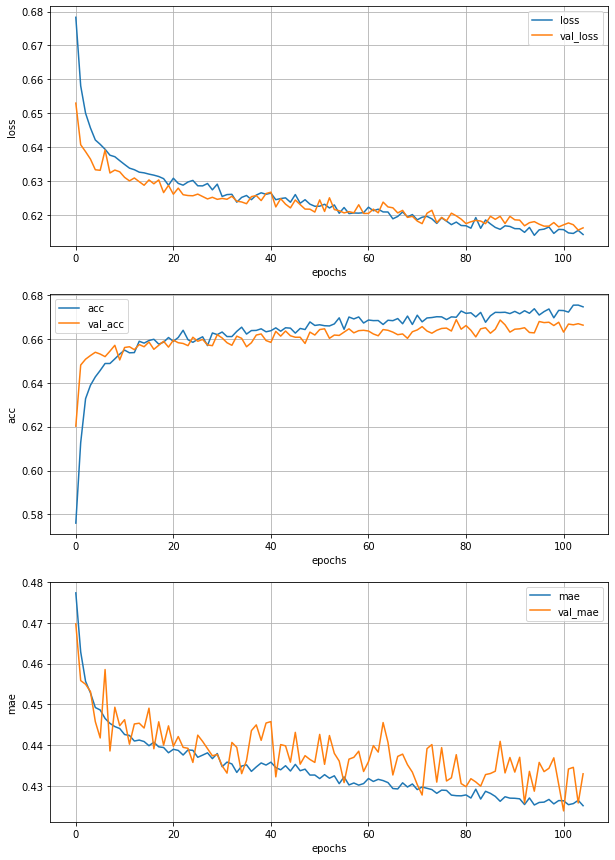

Epoch 106/150
938/938 [==============================] - 4s 5ms/step - loss: 0.6118 - acc: 0.6790 - mae: 0.4231 - val_loss: 0.6165 - val_acc: 0.6622 - val_mae: 0.4321


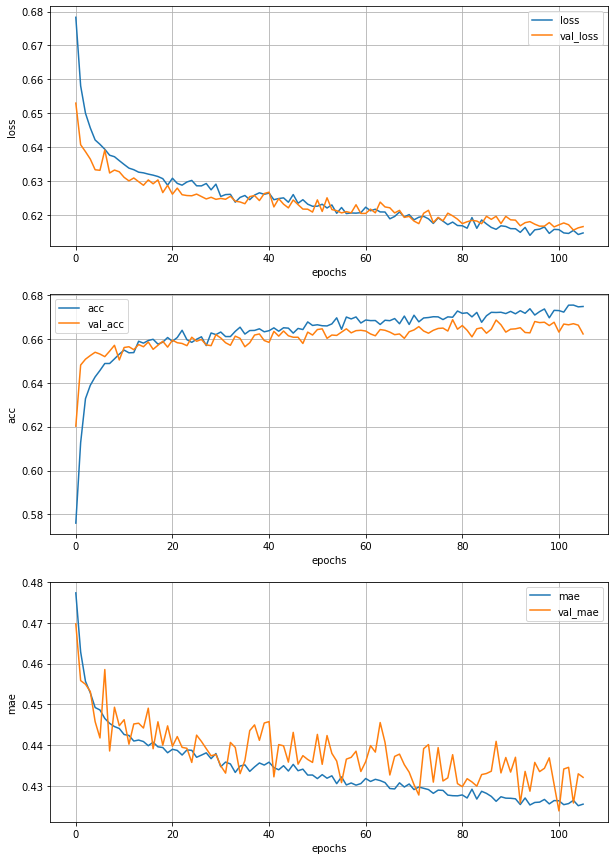

Epoch 107/150
938/938 [==============================] - 4s 4ms/step - loss: 0.6138 - acc: 0.6753 - mae: 0.4243 - val_loss: 0.6163 - val_acc: 0.6686 - val_mae: 0.4347


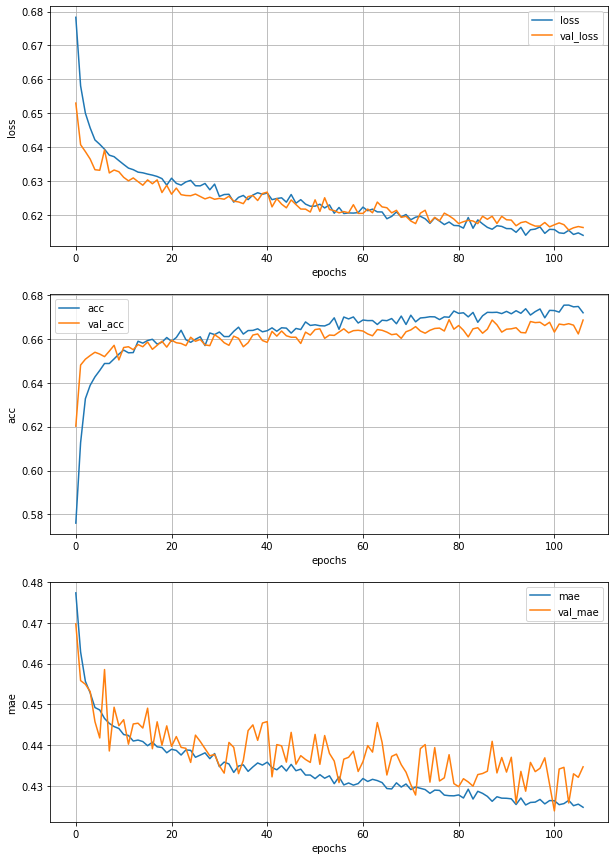

Epoch 108/150
938/938 [==============================] - 4s 4ms/step - loss: 0.6136 - acc: 0.6711 - mae: 0.4241 - val_loss: 0.6165 - val_acc: 0.6644 - val_mae: 0.4305


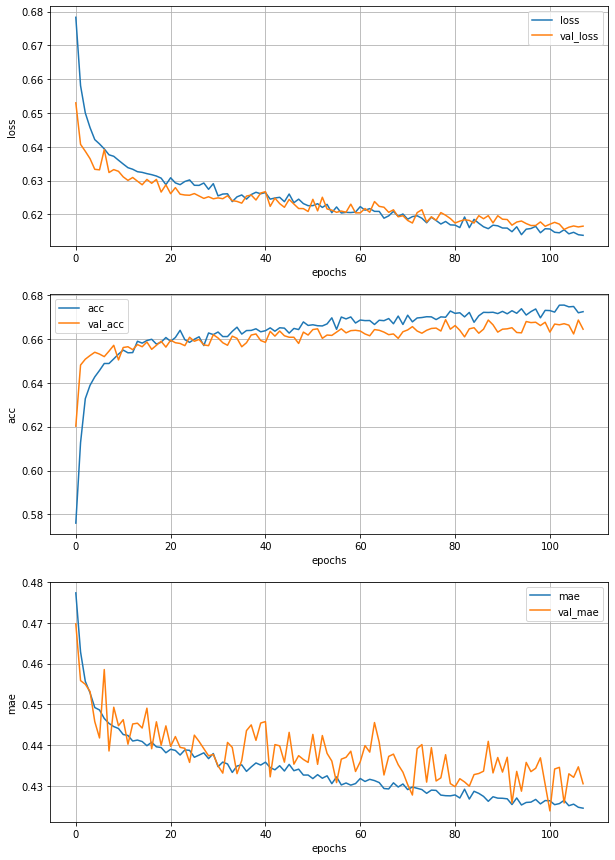

Epoch 109/150
938/938 [==============================] - 4s 4ms/step - loss: 0.6119 - acc: 0.6697 - mae: 0.4239 - val_loss: 0.6175 - val_acc: 0.6652 - val_mae: 0.4289


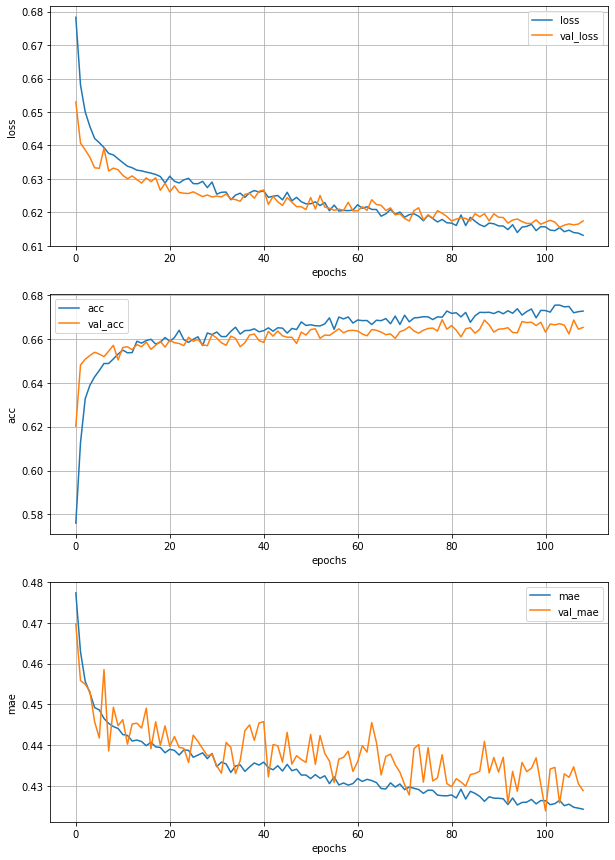

Epoch 110/150
938/938 [==============================] - 4s 5ms/step - loss: 0.6141 - acc: 0.6770 - mae: 0.4261 - val_loss: 0.6156 - val_acc: 0.6652 - val_mae: 0.4275


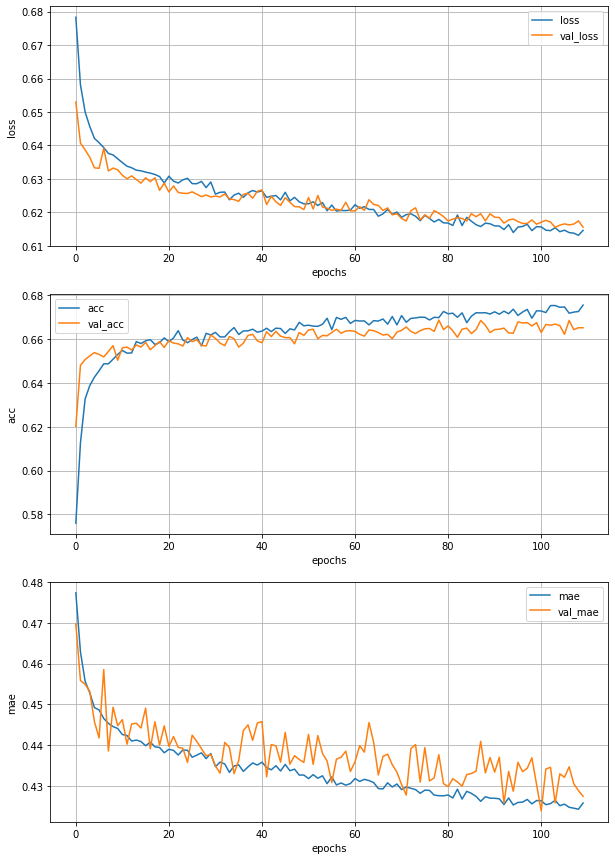

Epoch 111/150
938/938 [==============================] - 4s 4ms/step - loss: 0.6108 - acc: 0.6759 - mae: 0.4224 - val_loss: 0.6150 - val_acc: 0.6671 - val_mae: 0.4289


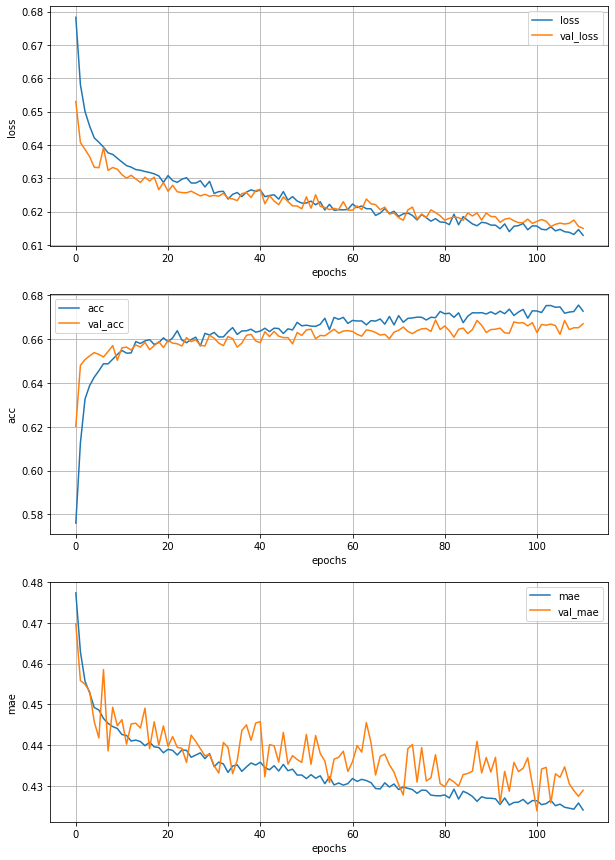

Epoch 112/150
938/938 [==============================] - 4s 5ms/step - loss: 0.6110 - acc: 0.6777 - mae: 0.4224 - val_loss: 0.6177 - val_acc: 0.6661 - val_mae: 0.4329


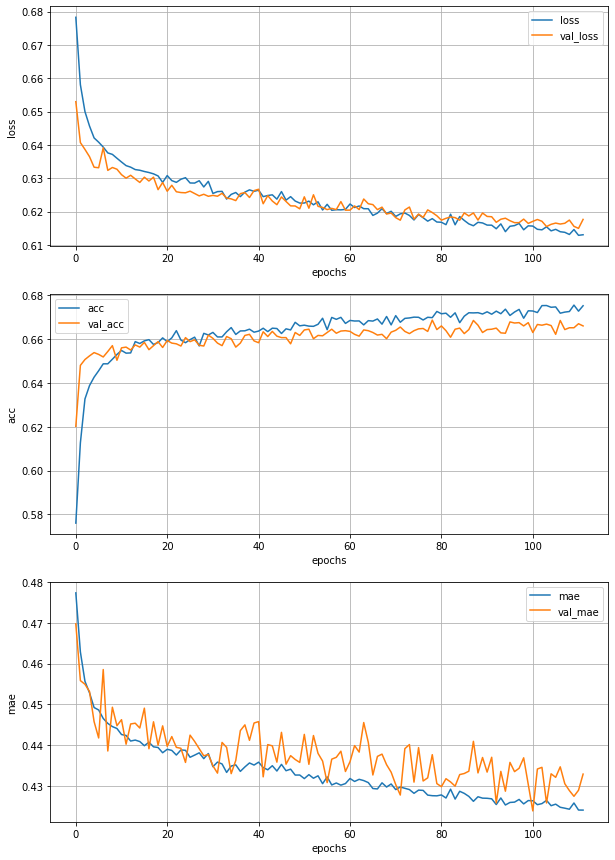

Epoch 113/150
938/938 [==============================] - 4s 5ms/step - loss: 0.6114 - acc: 0.6758 - mae: 0.4234 - val_loss: 0.6161 - val_acc: 0.6657 - val_mae: 0.4330


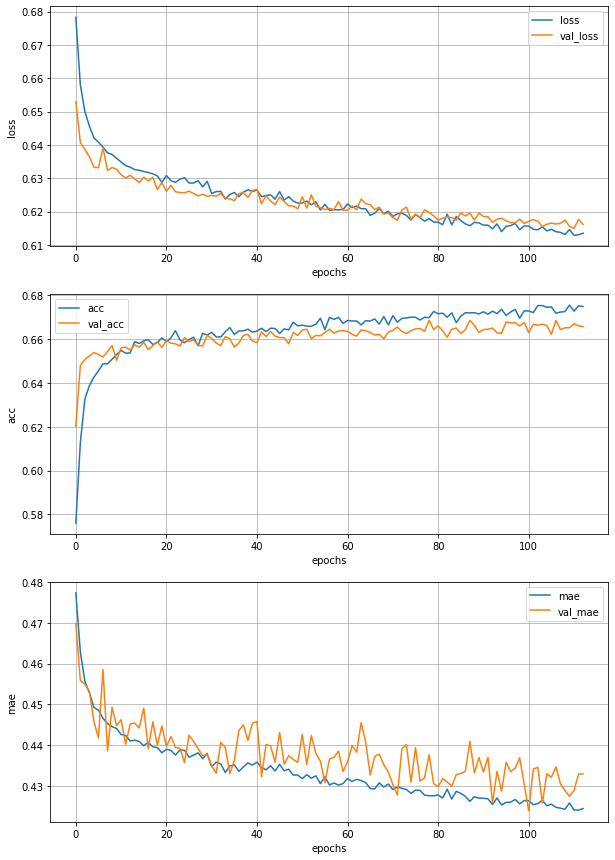

Epoch 114/150
938/938 [==============================] - 4s 5ms/step - loss: 0.6108 - acc: 0.6762 - mae: 0.4233 - val_loss: 0.6156 - val_acc: 0.6681 - val_mae: 0.4330


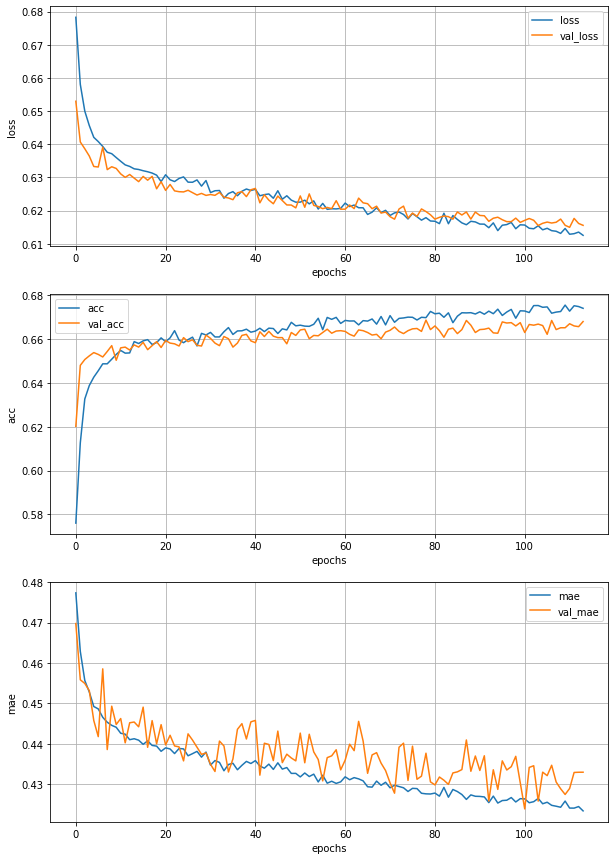

Epoch 115/150
938/938 [==============================] - 4s 5ms/step - loss: 0.6114 - acc: 0.6757 - mae: 0.4234 - val_loss: 0.6166 - val_acc: 0.6696 - val_mae: 0.4364


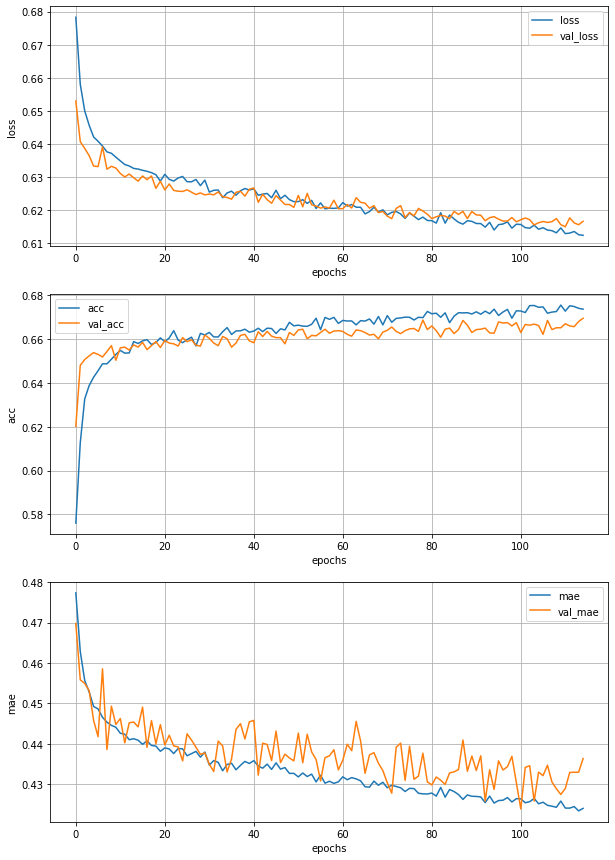

Epoch 116/150
938/938 [==============================] - 4s 4ms/step - loss: 0.6134 - acc: 0.6733 - mae: 0.4242 - val_loss: 0.6148 - val_acc: 0.6684 - val_mae: 0.4307


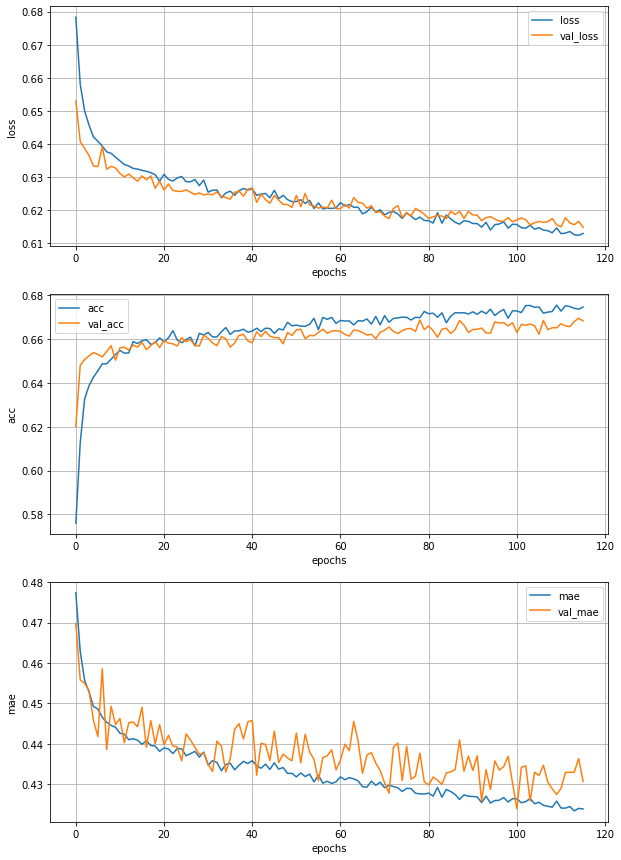

Epoch 117/150
938/938 [==============================] - 4s 4ms/step - loss: 0.6142 - acc: 0.6698 - mae: 0.4253 - val_loss: 0.6163 - val_acc: 0.6679 - val_mae: 0.4336


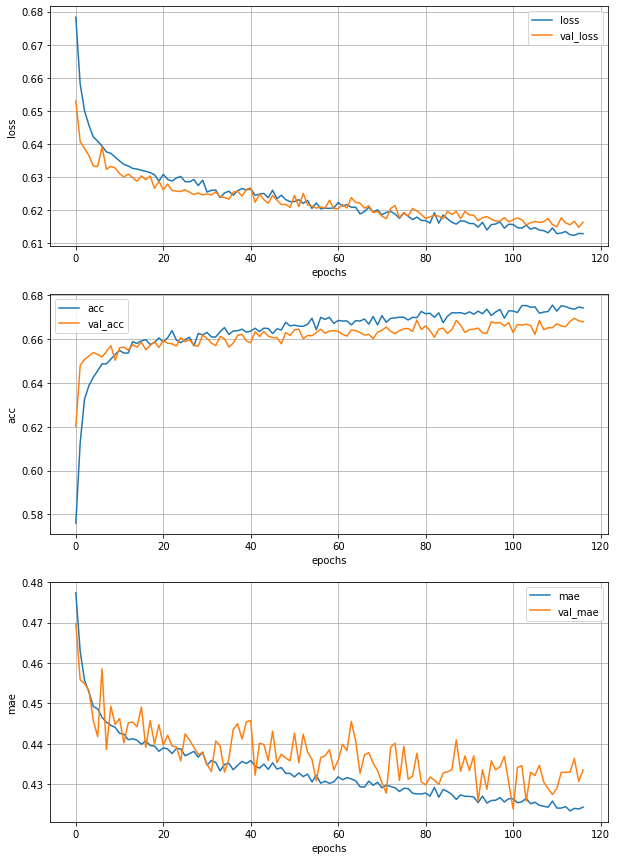

Epoch 118/150
938/938 [==============================] - 4s 5ms/step - loss: 0.6140 - acc: 0.6716 - mae: 0.4256 - val_loss: 0.6159 - val_acc: 0.6671 - val_mae: 0.4304


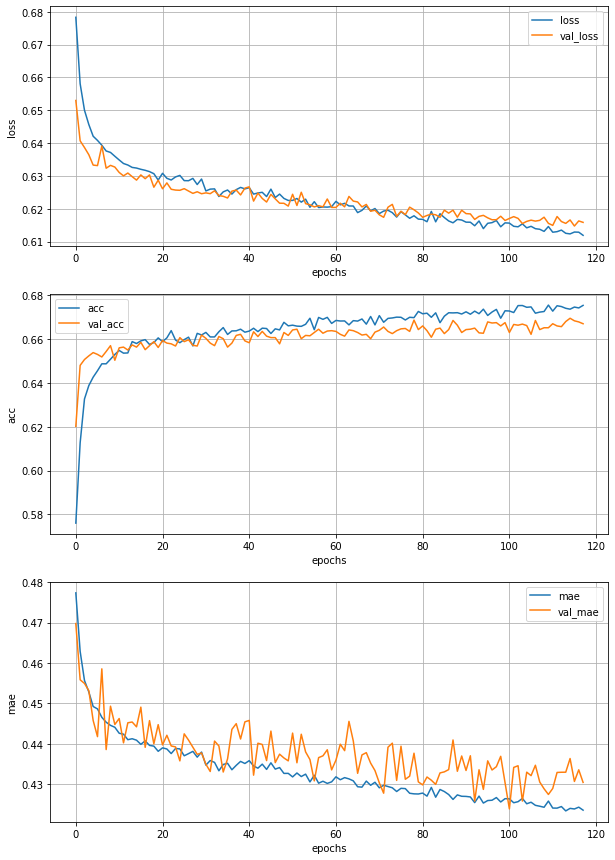

Epoch 119/150
938/938 [==============================] - 4s 4ms/step - loss: 0.6132 - acc: 0.6740 - mae: 0.4232 - val_loss: 0.6158 - val_acc: 0.6684 - val_mae: 0.4235


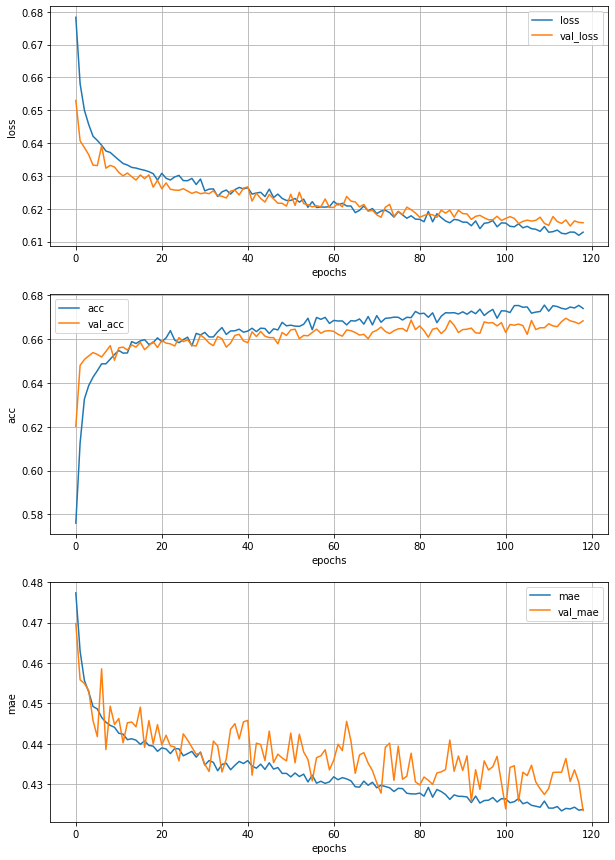

Epoch 120/150
938/938 [==============================] - 4s 5ms/step - loss: 0.6148 - acc: 0.6730 - mae: 0.4245 - val_loss: 0.6149 - val_acc: 0.6699 - val_mae: 0.4296


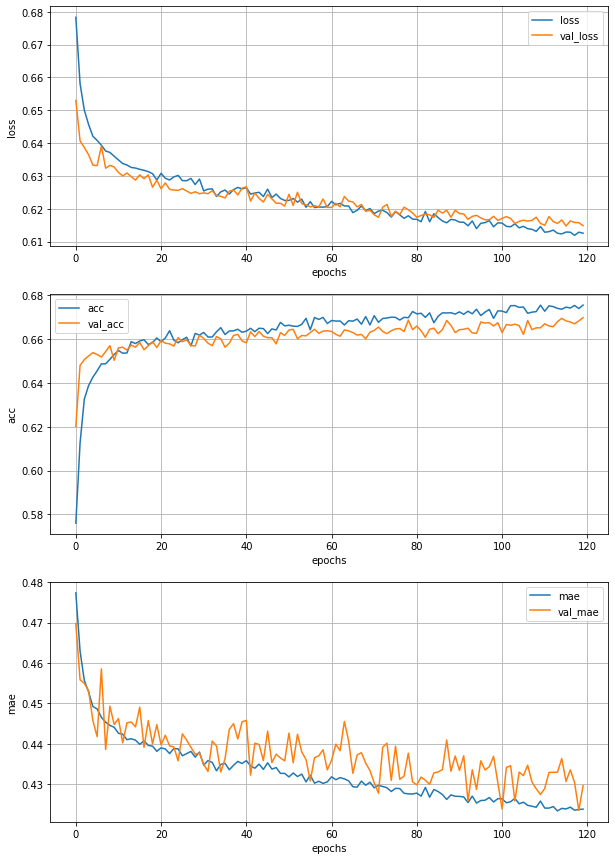

Epoch 121/150
938/938 [==============================] - 4s 4ms/step - loss: 0.6118 - acc: 0.6747 - mae: 0.4236 - val_loss: 0.6159 - val_acc: 0.6677 - val_mae: 0.4347


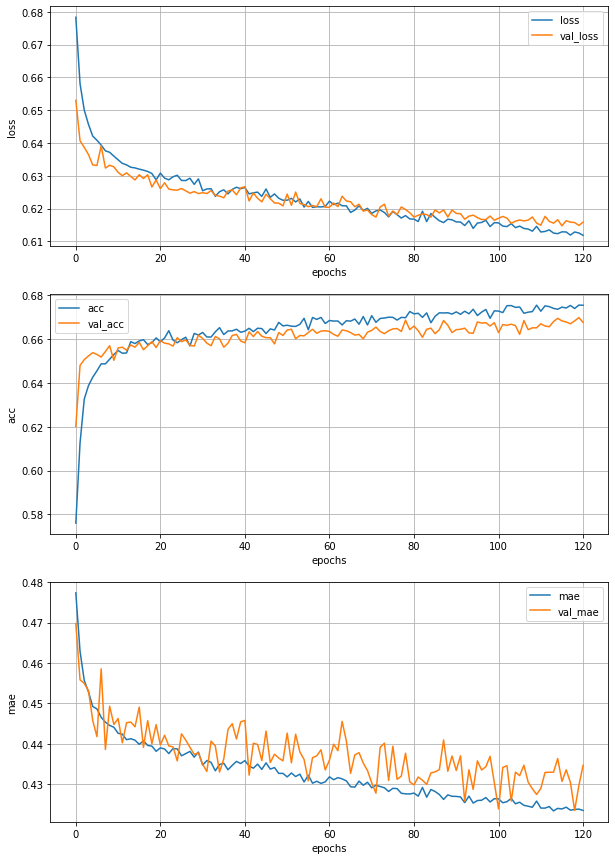

Epoch 122/150
938/938 [==============================] - 4s 4ms/step - loss: 0.6154 - acc: 0.6742 - mae: 0.4259 - val_loss: 0.6147 - val_acc: 0.6701 - val_mae: 0.4302


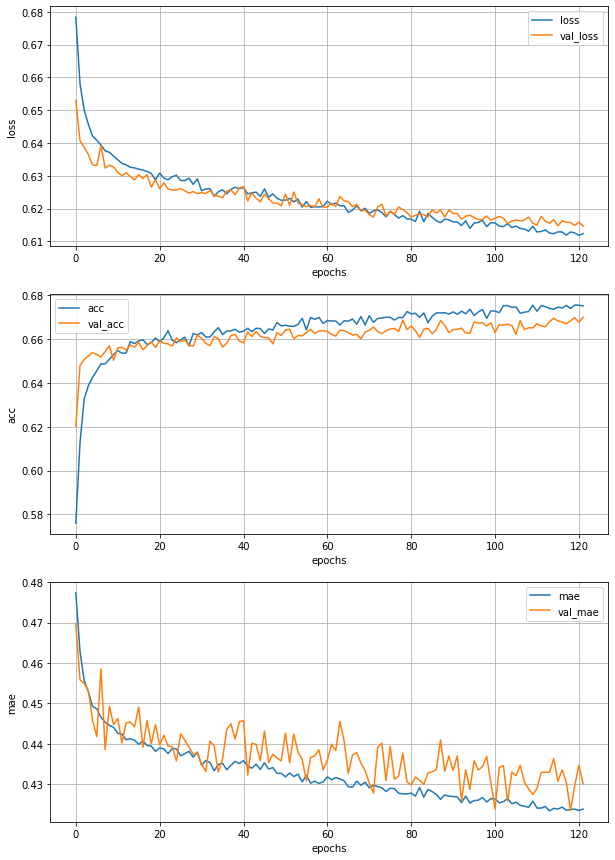

Epoch 123/150
938/938 [==============================] - 4s 4ms/step - loss: 0.6084 - acc: 0.6821 - mae: 0.4197 - val_loss: 0.6159 - val_acc: 0.6697 - val_mae: 0.4337


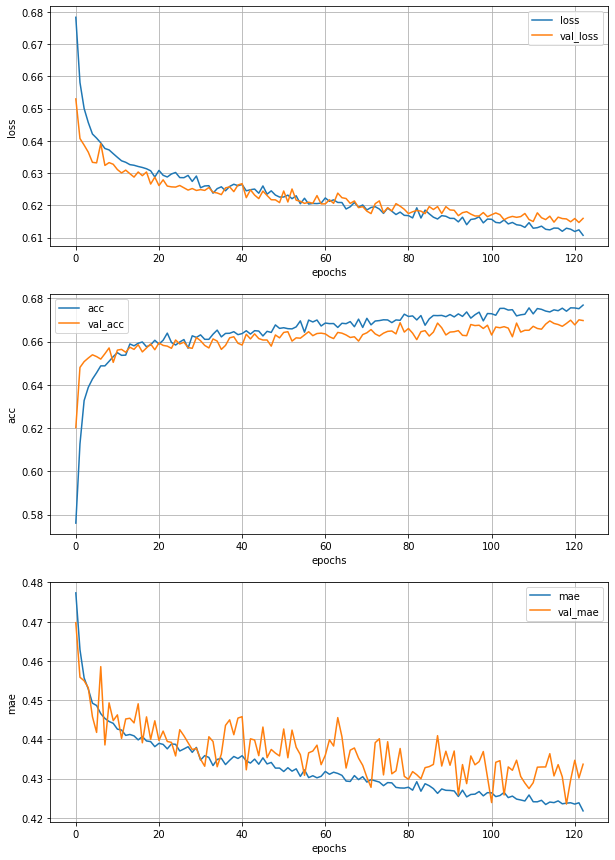

Epoch 124/150
938/938 [==============================] - 4s 4ms/step - loss: 0.6134 - acc: 0.6739 - mae: 0.4252 - val_loss: 0.6142 - val_acc: 0.6674 - val_mae: 0.4259


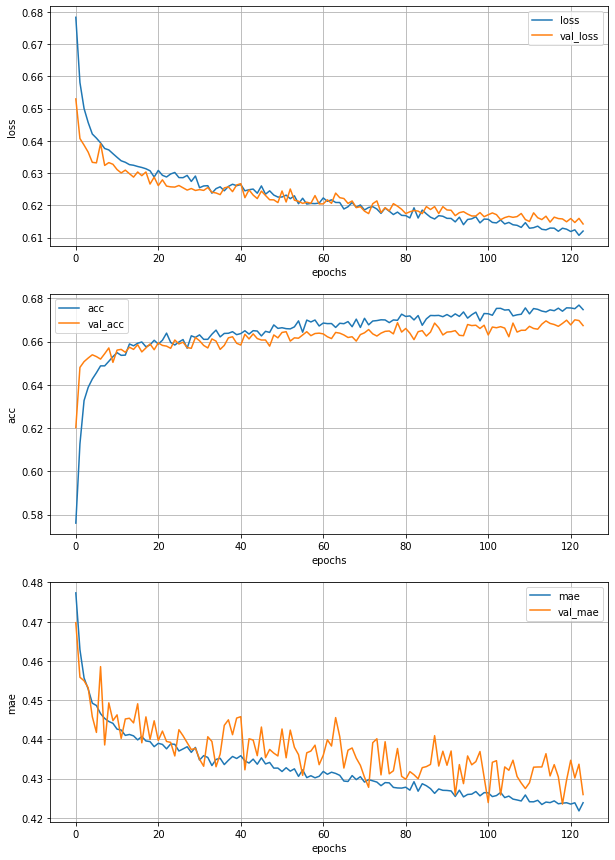

Epoch 125/150
938/938 [==============================] - 4s 4ms/step - loss: 0.6122 - acc: 0.6734 - mae: 0.4230 - val_loss: 0.6153 - val_acc: 0.6652 - val_mae: 0.4255


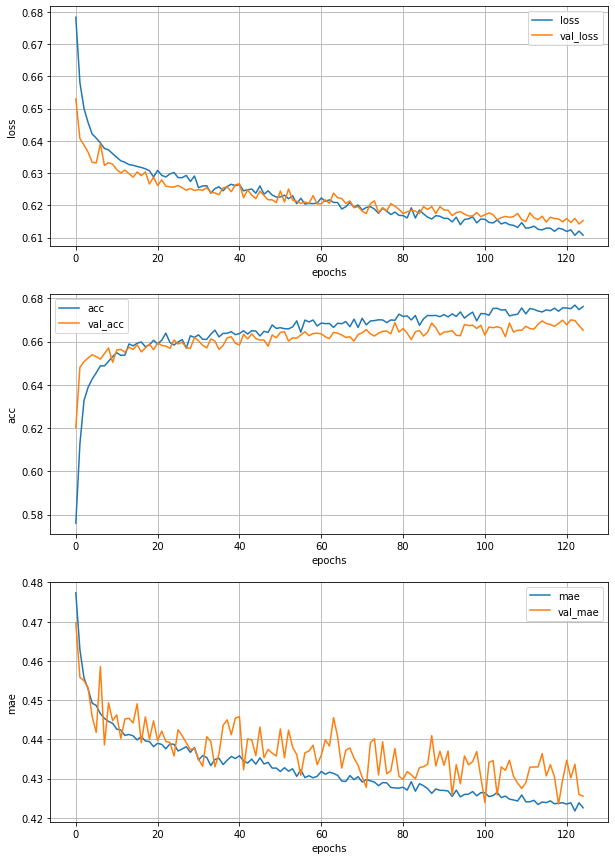

Epoch 126/150
938/938 [==============================] - 4s 4ms/step - loss: 0.6123 - acc: 0.6751 - mae: 0.4222 - val_loss: 0.6148 - val_acc: 0.6699 - val_mae: 0.4271


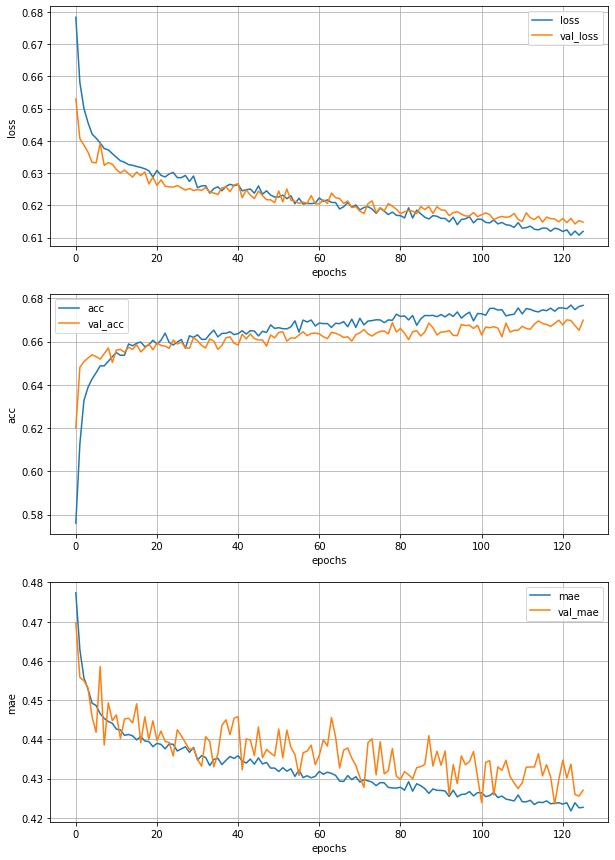

Epoch 127/150
938/938 [==============================] - 4s 5ms/step - loss: 0.6118 - acc: 0.6716 - mae: 0.4230 - val_loss: 0.6150 - val_acc: 0.6697 - val_mae: 0.4339


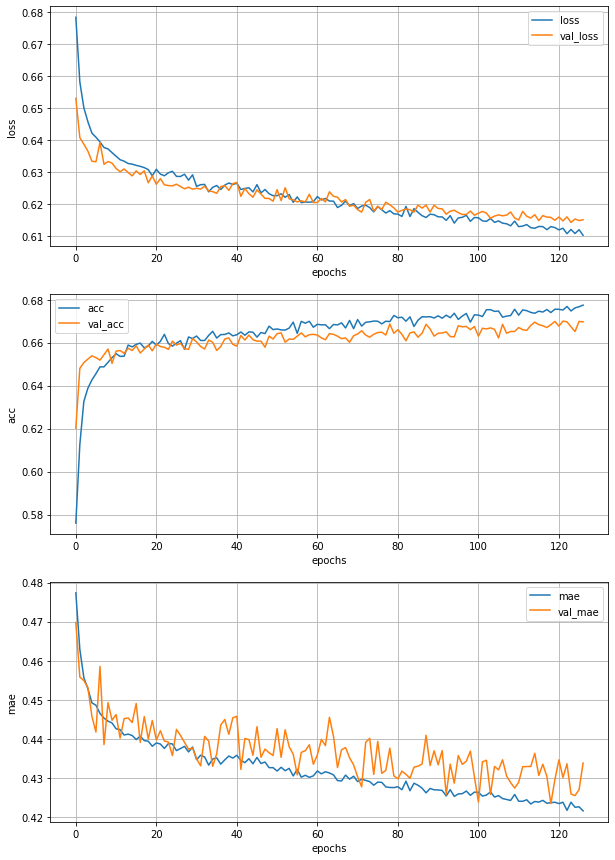

Epoch 128/150
938/938 [==============================] - 4s 4ms/step - loss: 0.6115 - acc: 0.6722 - mae: 0.4240 - val_loss: 0.6153 - val_acc: 0.6676 - val_mae: 0.4309


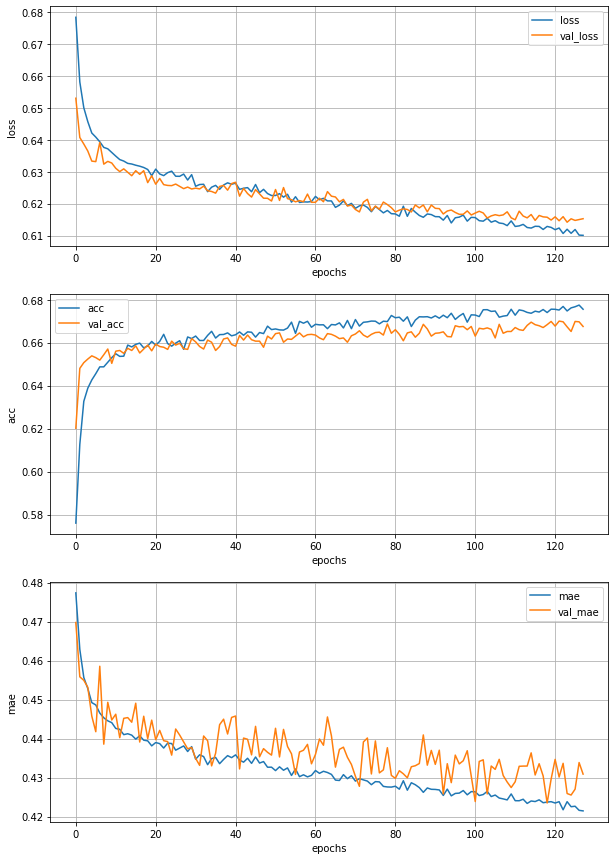

Epoch 129/150
938/938 [==============================] - 4s 5ms/step - loss: 0.6115 - acc: 0.6760 - mae: 0.4228 - val_loss: 0.6156 - val_acc: 0.6697 - val_mae: 0.4314


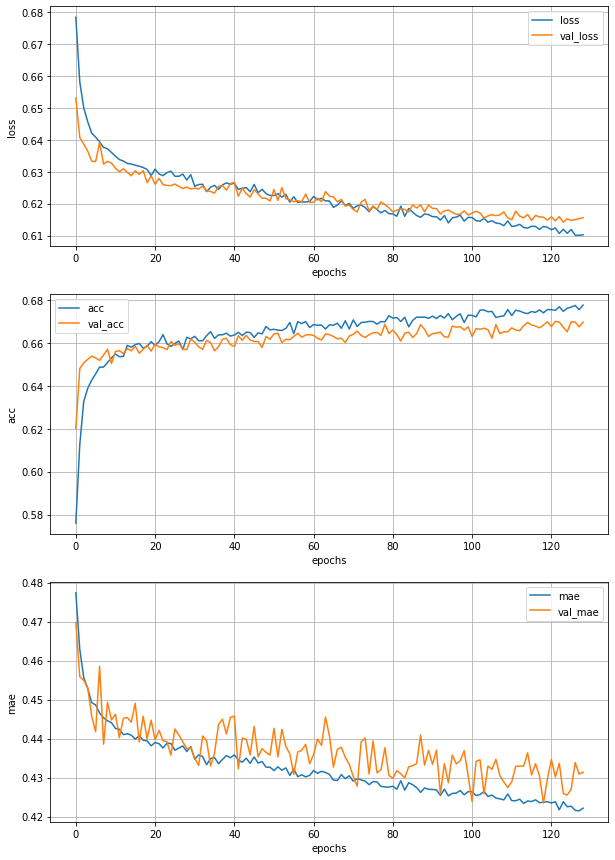

Epoch 130/150
938/938 [==============================] - 4s 4ms/step - loss: 0.6124 - acc: 0.6788 - mae: 0.4223 - val_loss: 0.6162 - val_acc: 0.6692 - val_mae: 0.4343


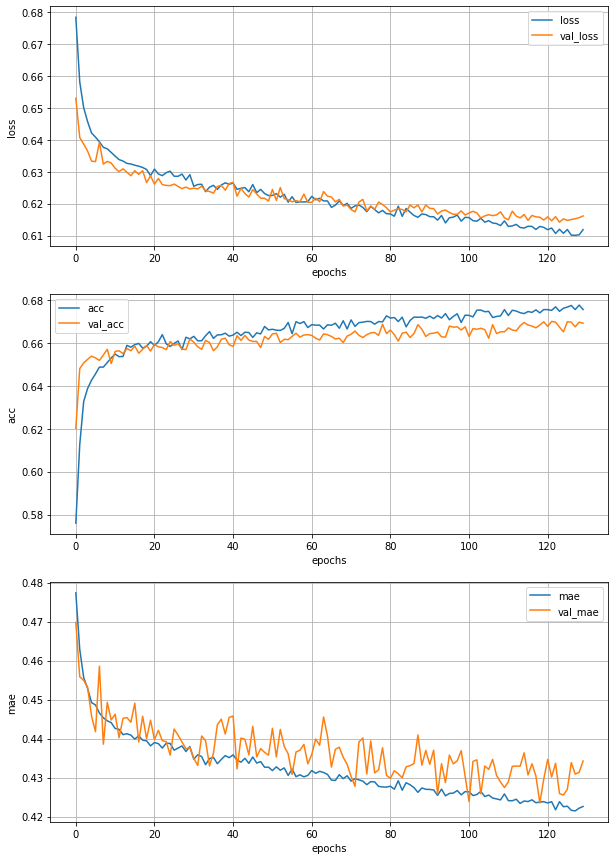

Epoch 131/150
938/938 [==============================] - 4s 4ms/step - loss: 0.6094 - acc: 0.6750 - mae: 0.4219 - val_loss: 0.6143 - val_acc: 0.6702 - val_mae: 0.4269


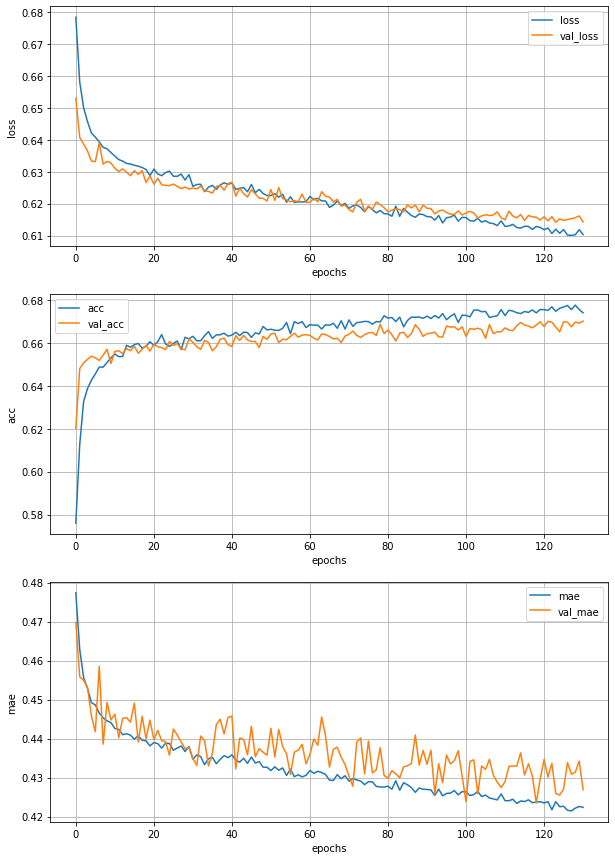

Epoch 132/150
938/938 [==============================] - 4s 4ms/step - loss: 0.6089 - acc: 0.6795 - mae: 0.4199 - val_loss: 0.6159 - val_acc: 0.6724 - val_mae: 0.4338


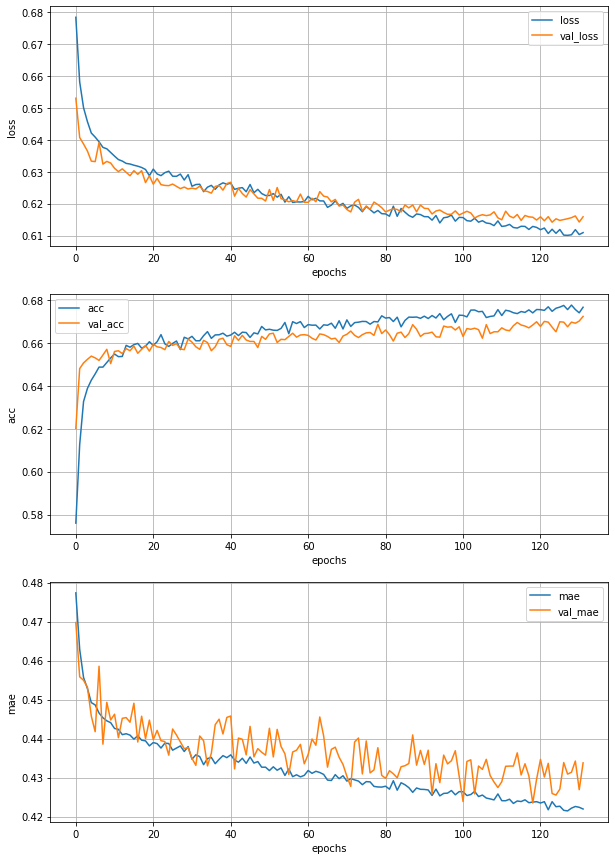

Epoch 133/150
938/938 [==============================] - 4s 5ms/step - loss: 0.6093 - acc: 0.6793 - mae: 0.4215 - val_loss: 0.6138 - val_acc: 0.6676 - val_mae: 0.4276


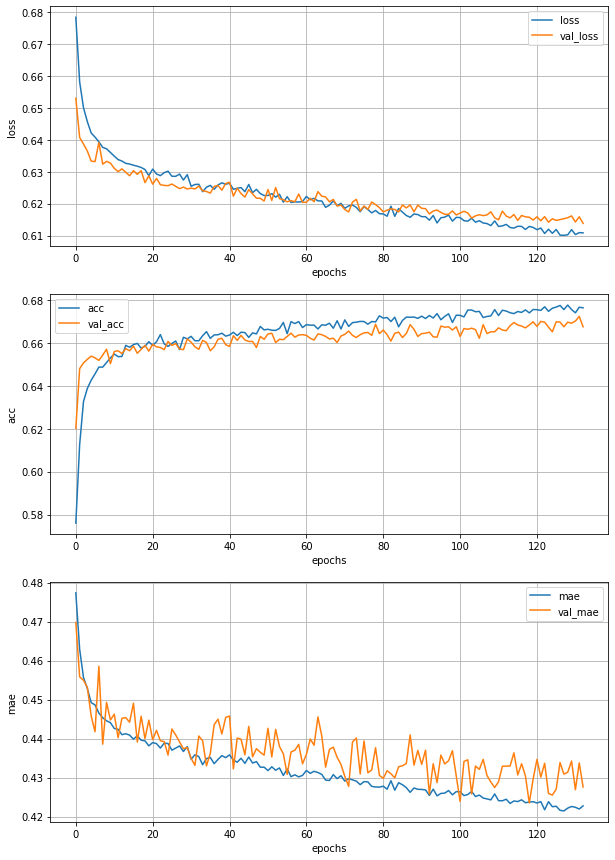

Epoch 134/150
938/938 [==============================] - 4s 5ms/step - loss: 0.6139 - acc: 0.6750 - mae: 0.4234 - val_loss: 0.6142 - val_acc: 0.6667 - val_mae: 0.4262


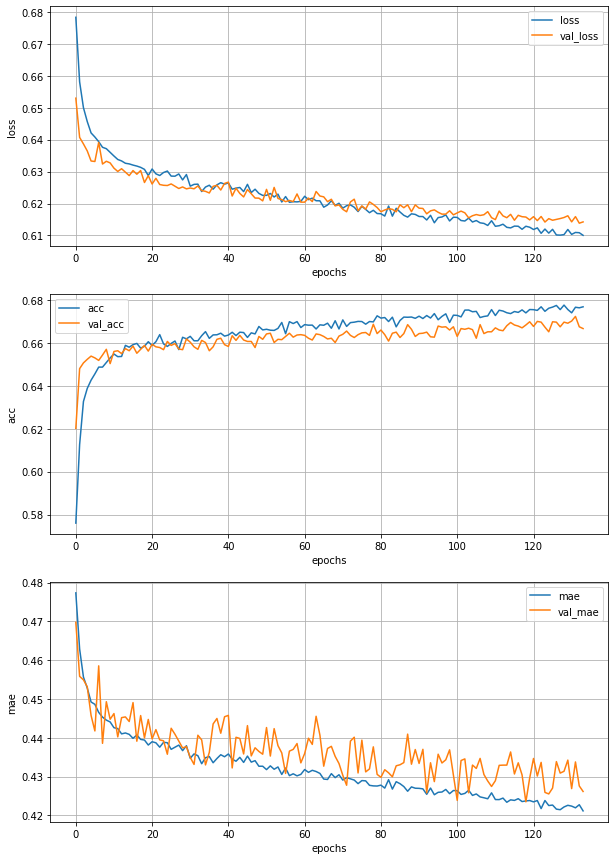

Epoch 135/150
938/938 [==============================] - 4s 4ms/step - loss: 0.6100 - acc: 0.6746 - mae: 0.4207 - val_loss: 0.6141 - val_acc: 0.6667 - val_mae: 0.4267


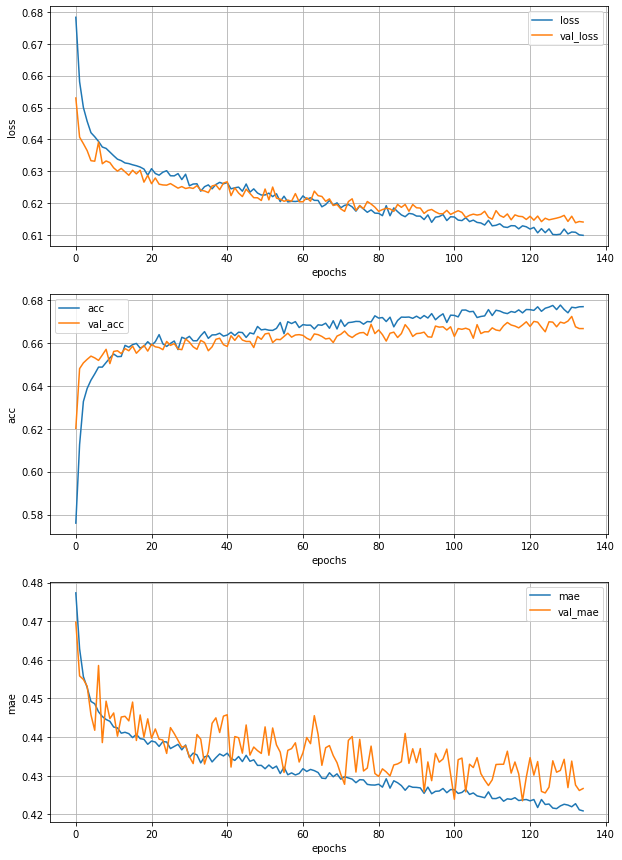

Epoch 136/150
938/938 [==============================] - 4s 4ms/step - loss: 0.6106 - acc: 0.6763 - mae: 0.4224 - val_loss: 0.6140 - val_acc: 0.6681 - val_mae: 0.4277


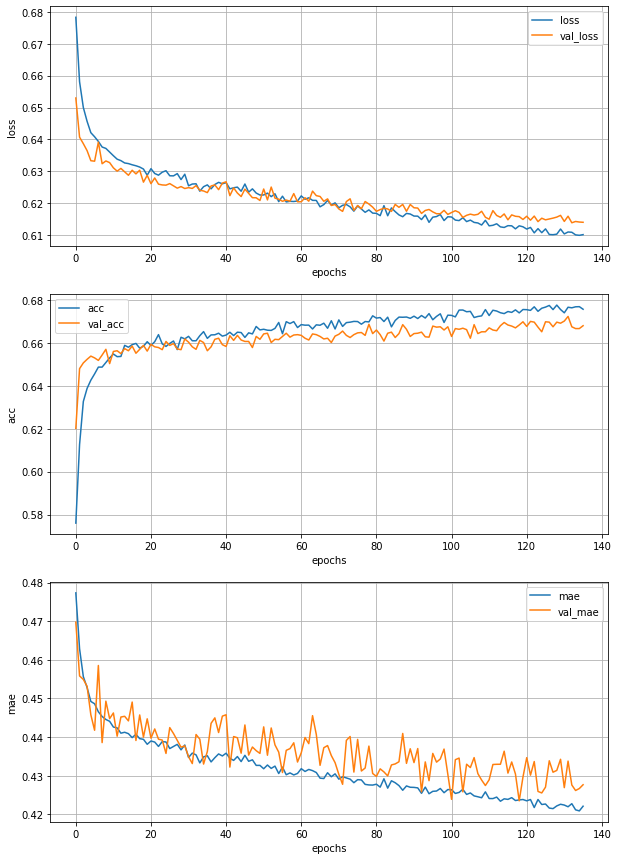

Epoch 137/150
938/938 [==============================] - 4s 5ms/step - loss: 0.6091 - acc: 0.6786 - mae: 0.4201 - val_loss: 0.6138 - val_acc: 0.6669 - val_mae: 0.4251


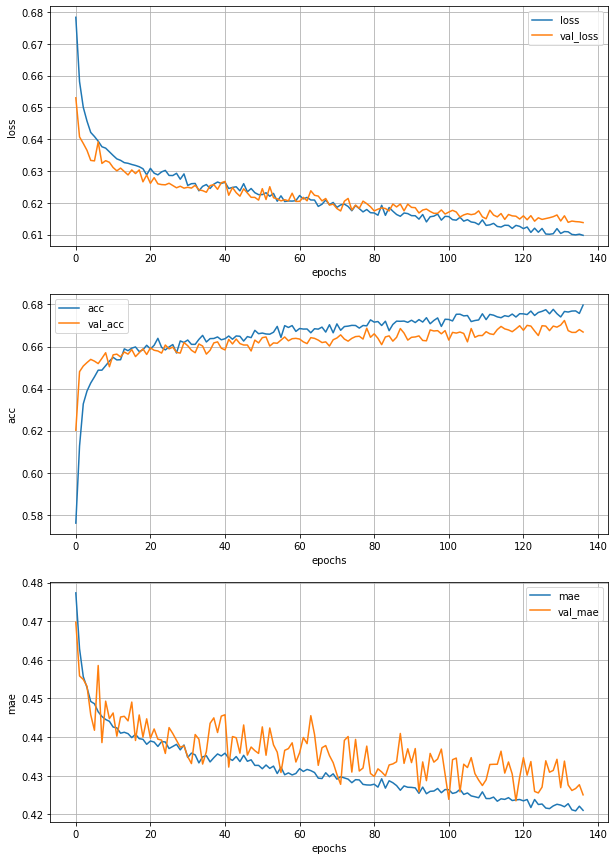

Epoch 138/150
938/938 [==============================] - 4s 5ms/step - loss: 0.6124 - acc: 0.6741 - mae: 0.4227 - val_loss: 0.6141 - val_acc: 0.6706 - val_mae: 0.4274


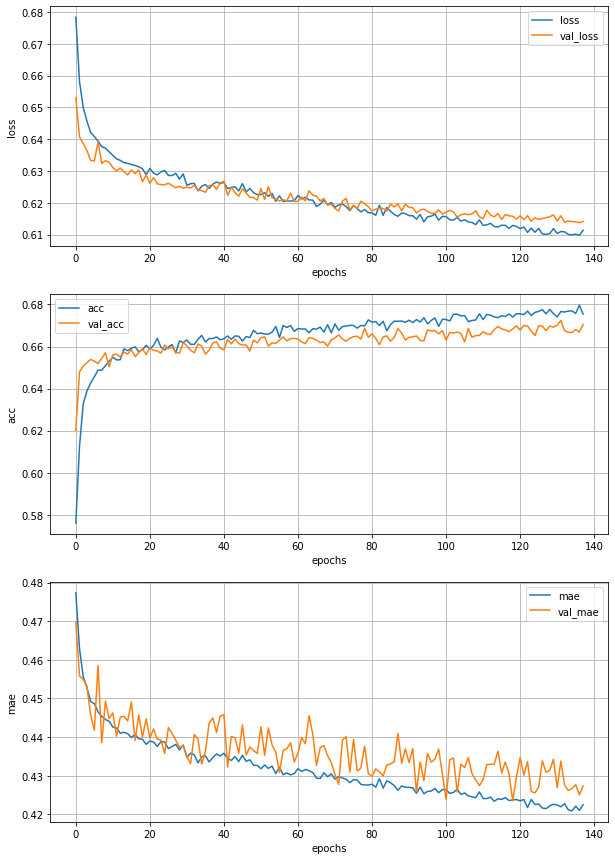

Epoch 139/150
938/938 [==============================] - 4s 4ms/step - loss: 0.6089 - acc: 0.6775 - mae: 0.4206 - val_loss: 0.6135 - val_acc: 0.6684 - val_mae: 0.4249


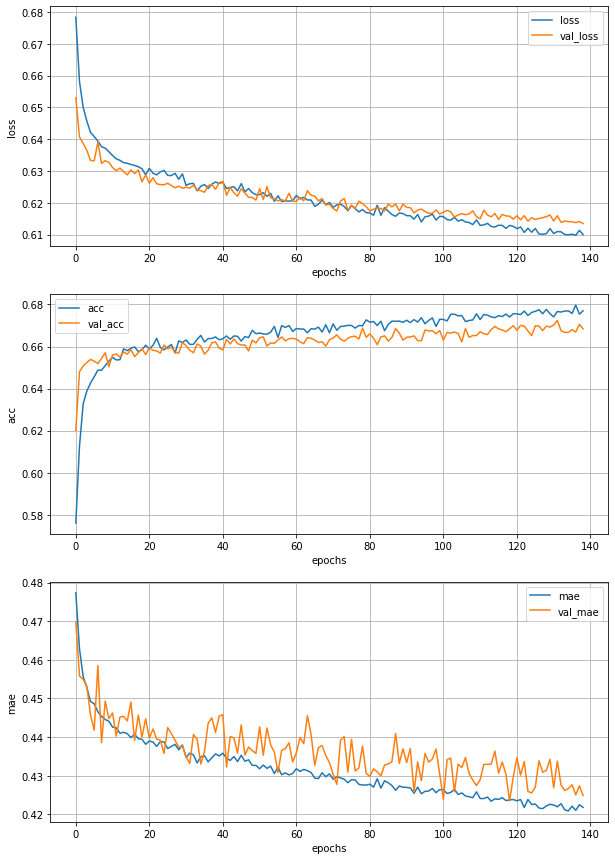

Epoch 140/150
938/938 [==============================] - 4s 5ms/step - loss: 0.6117 - acc: 0.6797 - mae: 0.4219 - val_loss: 0.6138 - val_acc: 0.6734 - val_mae: 0.4273


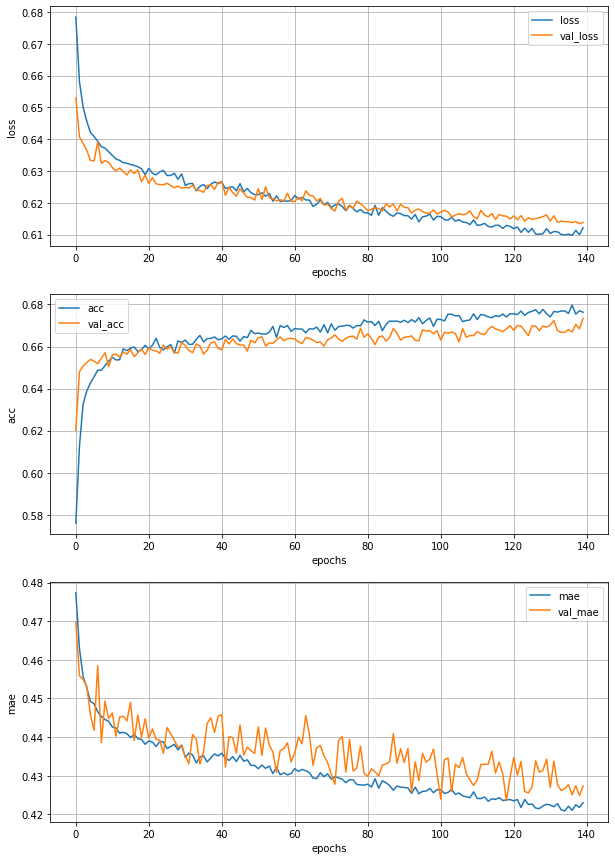

Epoch 141/150
938/938 [==============================] - 4s 5ms/step - loss: 0.6092 - acc: 0.6763 - mae: 0.4210 - val_loss: 0.6147 - val_acc: 0.6712 - val_mae: 0.4323


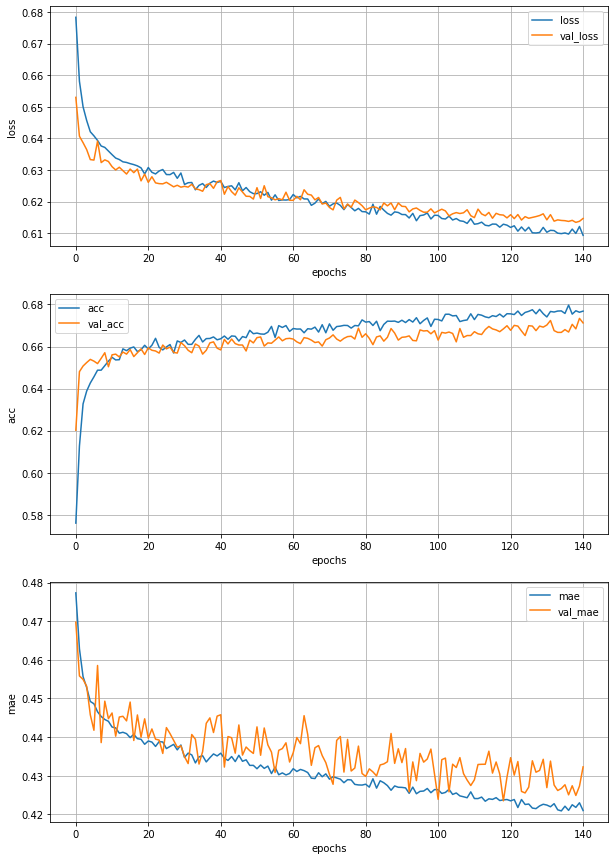

Epoch 142/150
938/938 [==============================] - 4s 4ms/step - loss: 0.6069 - acc: 0.6852 - mae: 0.4197 - val_loss: 0.6124 - val_acc: 0.6719 - val_mae: 0.4268


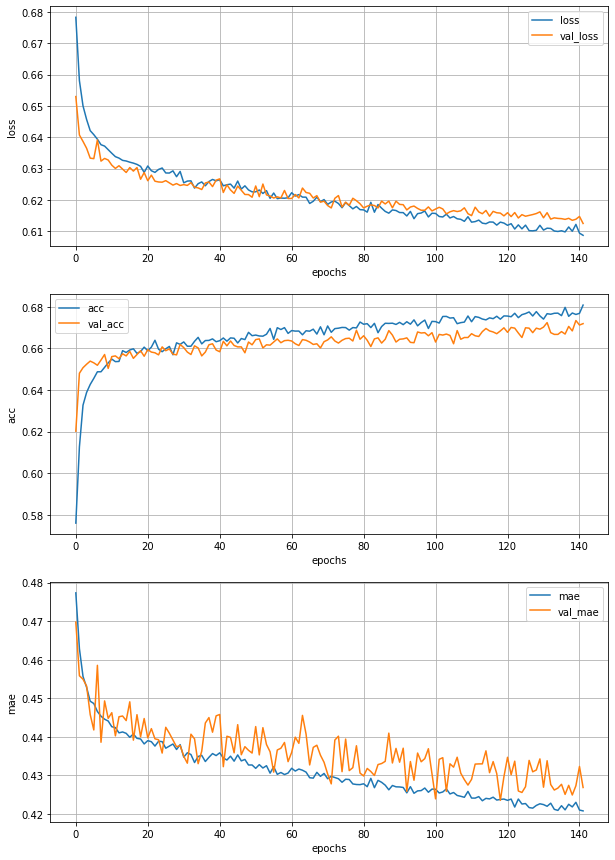

Epoch 143/150
938/938 [==============================] - 4s 4ms/step - loss: 0.6088 - acc: 0.6774 - mae: 0.4214 - val_loss: 0.6147 - val_acc: 0.6697 - val_mae: 0.4298


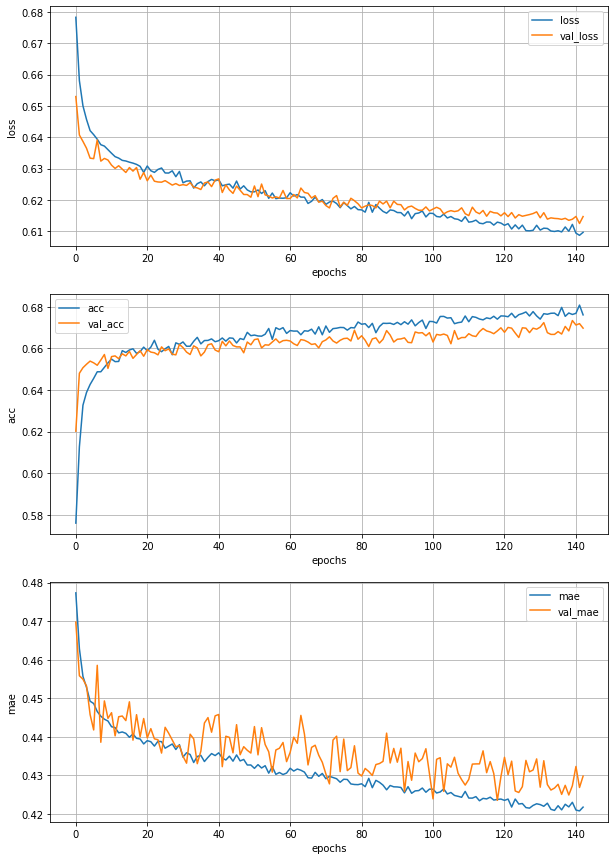

Epoch 144/150
938/938 [==============================] - 4s 4ms/step - loss: 0.6089 - acc: 0.6787 - mae: 0.4207 - val_loss: 0.6169 - val_acc: 0.6659 - val_mae: 0.4379


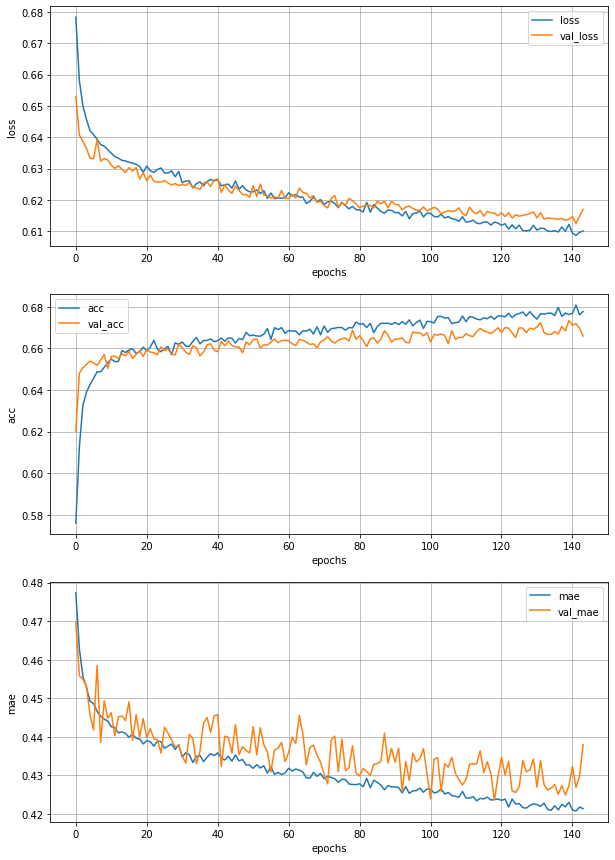

Epoch 145/150
938/938 [==============================] - 4s 4ms/step - loss: 0.6129 - acc: 0.6756 - mae: 0.4247 - val_loss: 0.6148 - val_acc: 0.6679 - val_mae: 0.4334


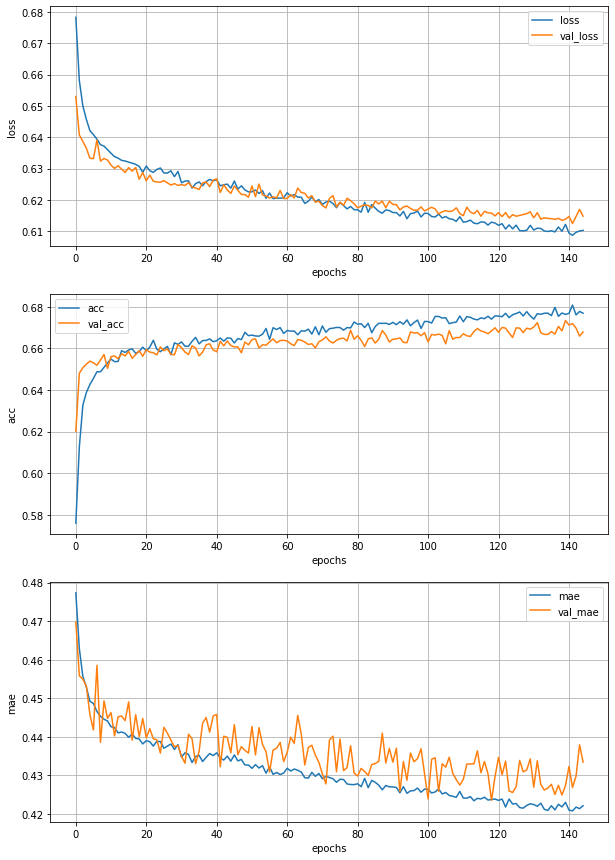

Epoch 146/150
938/938 [==============================] - 4s 4ms/step - loss: 0.6099 - acc: 0.6776 - mae: 0.4214 - val_loss: 0.6141 - val_acc: 0.6709 - val_mae: 0.4298


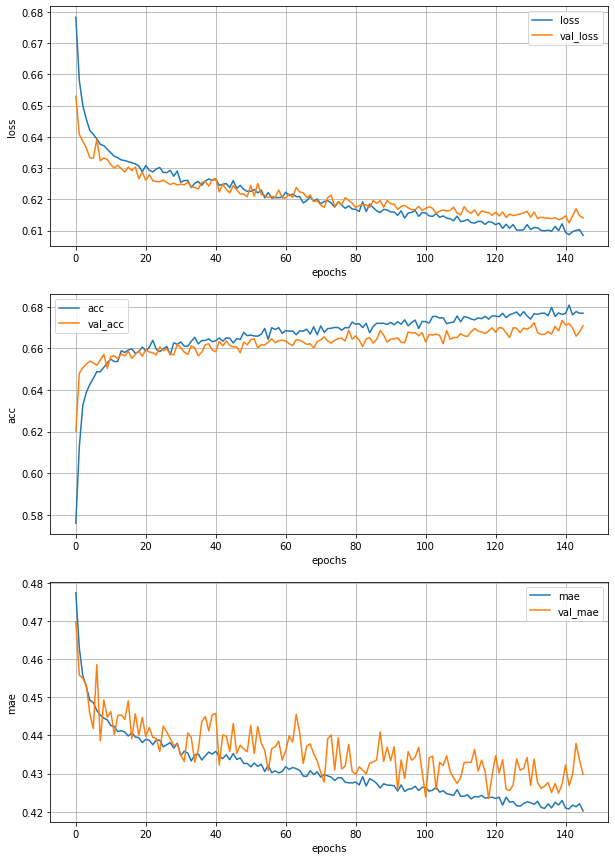

Epoch 147/150
938/938 [==============================] - 4s 5ms/step - loss: 0.6128 - acc: 0.6758 - mae: 0.4238 - val_loss: 0.6135 - val_acc: 0.6726 - val_mae: 0.4272


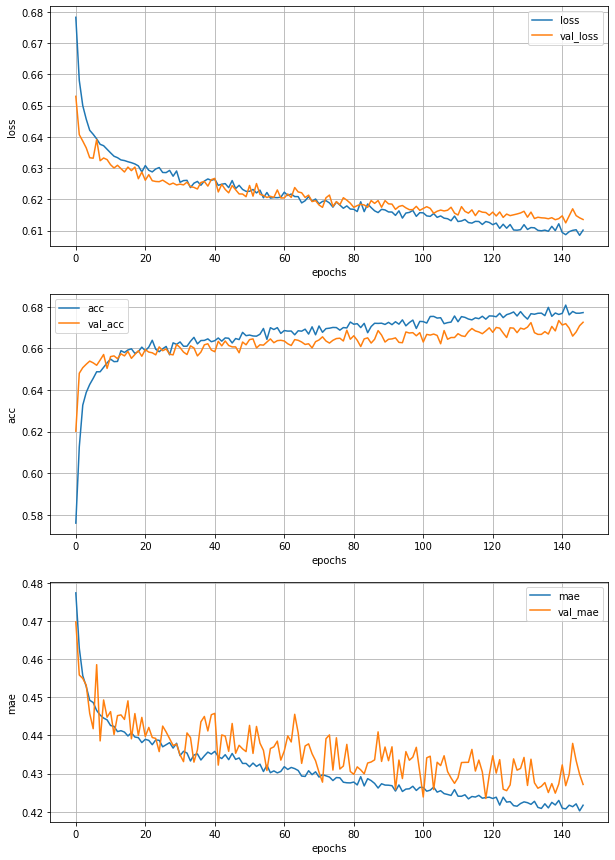

Epoch 148/150
938/938 [==============================] - 4s 5ms/step - loss: 0.6059 - acc: 0.6822 - mae: 0.4184 - val_loss: 0.6145 - val_acc: 0.6692 - val_mae: 0.4272


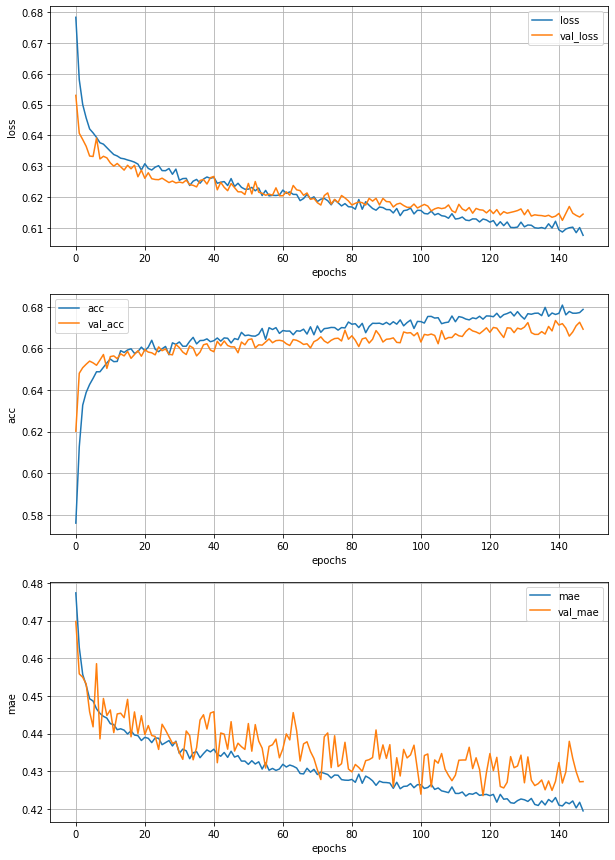

Epoch 149/150
938/938 [==============================] - 4s 5ms/step - loss: 0.6078 - acc: 0.6808 - mae: 0.4187 - val_loss: 0.6145 - val_acc: 0.6696 - val_mae: 0.4272


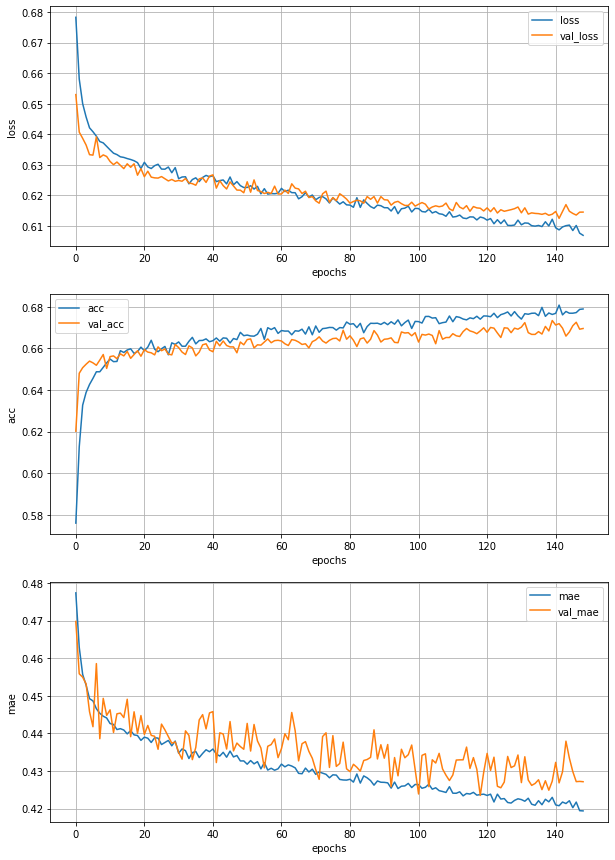

Epoch 150/150
938/938 [==============================] - 4s 5ms/step - loss: 0.6080 - acc: 0.6788 - mae: 0.4188 - val_loss: 0.6143 - val_acc: 0.6677 - val_mae: 0.4292


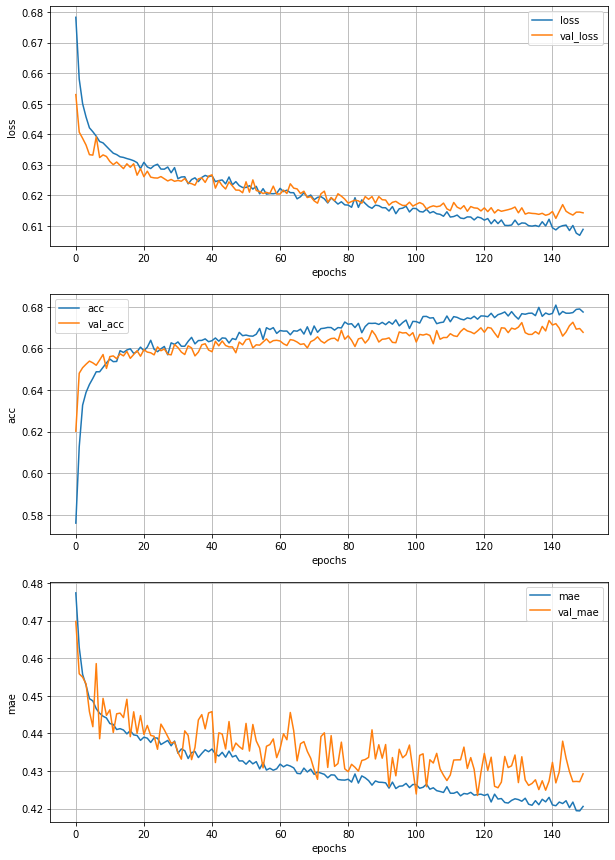

125/125 [==============================] - 0s 3ms/step - loss: 0.6093 - acc: 0.6729 - mae: 0.4275


[0.6093201041221619, 0.6729182004928589, 0.4274718165397644]

In [ ]:
hist = Record()
decision.fit(
    training_x, training_y,
    epochs=150,
    validation_data=(val_x, val_y),
    callbacks=[hist]
)
decision.evaluate(testing_x, testing_y)

In [ ]:
# data.encoder = None
# x, y = data.all()

In [ ]:
# history=model.fit(
#     x, y,
#     epochs=20, 
#     validation_split=0.2
# )

In [ ]:
# model.save_weights('./models/weight-sol2--20%do--150epochs--idx2-with-testing',overwrite=True)

946 556 752 1745


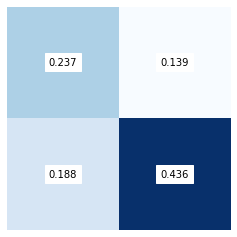

In [ ]:
pre = decision.predict(testing_x)
pre = np.where(pre > 0.5, 1, 0)
FP, FN, TP, TN = 0, 0, 0, 0
for a, b in zip(testing_y, pre):
    if (a, b) == (1, 1):
        TP += 1
    if (a, b) == (0, 0):
        TN += 1
    if (a, b) == (1, 0):
        FN += 1
    if (a, b) == (0, 1):
        FP += 1
N = FP + FN + TP + TN
print(TP, FP, FN, TN)
plt.matshow([[TP / N, FP / N], [FN / N, TN / N]],cmap='Blues')
plt.text(0, 0, '%.3f'%(TP/N), verticalalignment='center', horizontalalignment='center', backgroundcolor='white')
plt.text(1, 0, '%.3f'%(FP/N), verticalalignment='center', horizontalalignment='center', backgroundcolor='white')
plt.text(0, 1, '%.3f'%(FN/N), verticalalignment='center', horizontalalignment='center', backgroundcolor='white')
plt.text(1, 1, '%.3f'%(TN/N), verticalalignment='center', horizontalalignment='center', backgroundcolor='white')
plt.axis('off')
plt.show()

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
price=dict()
with open('./data/price.txt','r') as f:
    for i in f.readlines():
        a, b = i.split('\t')
        price[a]=b
DG = DataGen(rank[:], context='content', concat=False, max_length=SEQ_LEN, to01=True, encoder=bert_w2v, idx_type=2)
with open(DATA_PATH, 'r', encoding='utf-8') as f:
    data = json.load(f)
for d in data:
    if d['stock_id']=='2330':
        data=d['news']
        break
data.sort(key=lambda x: x['date'])
# data=data[-500:]
pre = []
pri = []
date = []
for d in tqdm(data):
    if d['date'] not in price:
        continue
    pri.append(price[d['date']])
    date.append(d['date'])
    encoded = DG.tokenizer(
        [n['content'] for n in d['news']],
        add_special_tokens=True,
        max_length=SEQ_LEN,
        return_attention_mask=True,
        return_token_type_ids=True,
        padding='max_length',
        truncation=True,
        return_tensors="tf",
    )
    input_ids = np.array(encoded["input_ids"], dtype="int32")
    attention_masks = np.array(encoded["attention_mask"], dtype="int32")
    token_type_ids = np.array(encoded["token_type_ids"], dtype="int32")
    p = model.predict([input_ids, attention_masks])
    pre.append(p.mean())


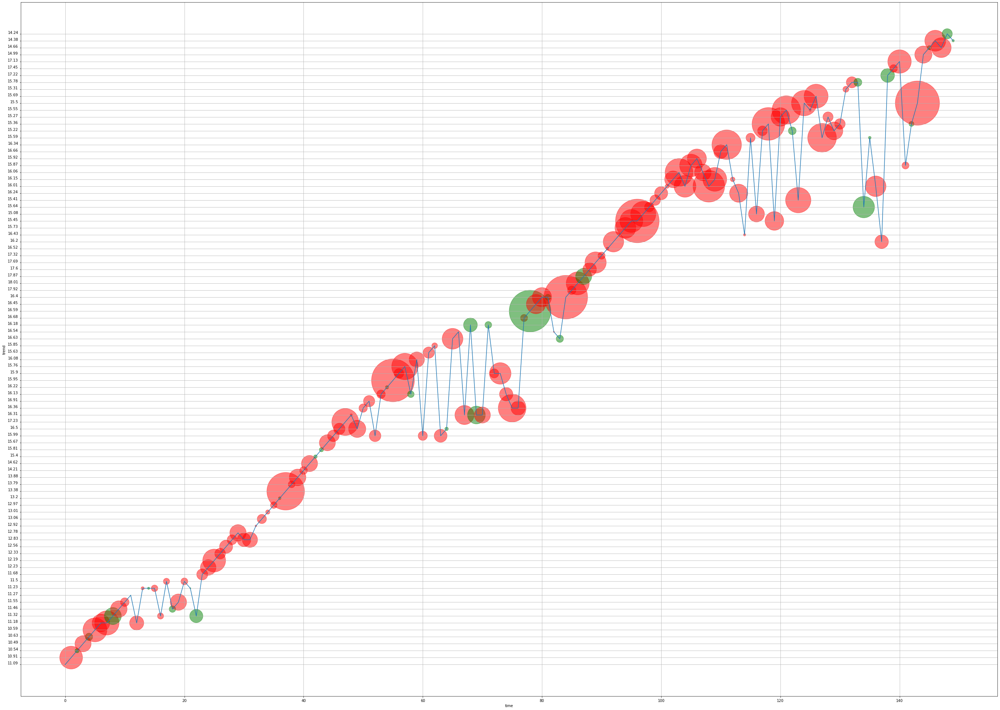

In [ ]:
def display(stockPrice, predict):
    stockPrice = np.array(stockPrice)
    predict = np.array(predict)*2-1
    N = len(predict)
    xaxis = np.arange(N)
    colors = np.where(predict > 0, 'Red', 'Green')
    area = np.pi * (predict ** 2 * 10000)
    plt.figure(figsize=(48,35))
    plt.scatter(xaxis, stockPrice, s=area, c=colors, alpha=0.5)
    plt.plot(stockPrice)
    plt.xlabel('time')
    plt.ylabel('trend')
    plt.grid()
    plt.show()
x=slice(150,300)
display(pri[x],pre[x])